In [1]:
#Karl CMB Project
# M1 - Traditional 3D CNN - Training using SWI Data


In [2]:


# Imports
import argparse
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms

import random

import numpy as np
import pdb

import matplotlib.pyplot as plt
import nibabel as nib
import os
import scipy.io
import pylab
# Training settings
#%matplotlib notebook



In [3]:
# Hyperparameters
num_epochs = 200
#num_classes = 2
batch_size = 5 
learning_rate = 1e-3
momentum = 0.9
dr = 0.3
weight_decay = 1e-4


In [4]:
# 0. Loading Data
# 
# loading extracted CMB and non-CMB Regions Of Interest
# 

ROI_total = np.load('isoCMB.npy').item() 
print("Total Number of Subjects (SWI Contrast):",len(ROI_total))

ROI = []
# array to store ROIs

for i in range(len(ROI_total)):
    #print("Sample Pixel Value of 1st CMB for subject N%s at (0,0,0):"%(i+1), ROI_total['N%s'%(i+1)][0][0][0][0])
    
    #indexing: (cmb#, x, y, z)
    
    # merge all subjects' CMB into one array
    for j in range(len(ROI_total['N%s'%(i+1)])):
        ROI.append(np.asarray(ROI_total['N%s'%(i+1)][j]))

#ROI: 74 SWI CMBs. 

#We will partition 74 into 59 train / 15 test. (80:20 = train:test ratio)

NCR_total1 = np.load('NonCMB1.npy').item()
NCR_total2 = np.load('NonCMB2.npy').item()
print("Number of Subjects (Part 1) (SWI Contrast):",len(NCR_total1))
print("Number of Subjects (Part 2) (SWI Contrast):",len(NCR_total2))

Total Number of Subjects (SWI Contrast): 20
Number of Subjects (Part 1) (SWI Contrast): 10
Number of Subjects (Part 2) (SWI Contrast): 10


In [5]:
NCR1 = []

for i in range(len(NCR_total1)):
    #print("Sample Pixel Value of 1st CMB for subject N%s at (0,0,0):"%(i+1), NCR_total['N%s'%(i+1)][0][0][0][0])
    
    #indexing: (cmb#, x, y, z)
    
    # merge all subjects' CMB into one array
    for j in range(len(NCR_total1['N%s'%(i+1)])):
        NCR1.append(np.asarray(NCR_total1['N%s'%(i+1)][j]))

NCR2 = []

for i in range(len(NCR_total2)):
    #print("Sample Pixel Value of 1st CMB for subject N%s at (0,0,0):"%(i+1), NCR_total['N%s'%(i+1)][0][0][0][0])
    
    #indexing: (cmb#, x, y, z)
    # merge all subjects' CMB into one array
    for j in range(len(NCR_total2['N%s'%(i+11)])):
        NCR2.append(np.asarray(NCR_total2['N%s'%(i+11)][j]))   

# NCR: 400 SWI non CMBs. 

# We will partition 400 into 320 train / 80 test. (80:20 = train:test ratio)

NCR = NCR1 + NCR2
# Merge both part 1 and 2 to get all Non CMB Regions.

random.shuffle(ROI)
random.shuffle(NCR)
# shuffle them.

SWI_train = []
# training dataset

SWI_train += ROI[:59]
SWI_train += NCR[:320]
# Train Data: 0~59 = CMB
# Train Data: 60~320 = Non-CMB

print('Number of Items in Train Data: %s' % len(SWI_train))
SWI_test = []
SWI_test += ROI[59:]
SWI_test += NCR[320:]

#print(SWI_train)
SWI_train = np.array(SWI_train)
SWI_train = np.expand_dims(SWI_train, axis=1)
# expanded to fit network architecture of 1 channel. 
print('Shape of Train Data Vector:', SWI_train.shape)
SWI_test = np.array(SWI_test)
SWI_test = np.expand_dims(SWI_test, axis=1)
#print(len(SWI_test))

Number of Items in Train Data: 379
Shape of Train Data Vector: (379, 1, 16, 16, 16)


In [6]:
# # MRI Image Viewer Tool


# def remove_keymap_conflicts(new_keys_set):
#     for prop in plt.rcParams:
#         if prop.startswith('keymap.'):
#             keys = plt.rcParams[prop]
#             remove_list = set(keys) & new_keys_set
#             for key in remove_list:
#                 keys.remove(key)

# def multi_slice_viewer(volume):
#     remove_keymap_conflicts({'j', 'k'})
#     fig, ax = plt.subplots()
#     ax.volume = volume
#     ax.index = volume.shape[0] // 2
#     ax.imshow(volume[ax.index],cmap = 'gray')
#     #for mouse scroll
#     fig.canvas.mpl_connect('scroll_event', onscroll)
#     #for key control
#     #fig.canvas.mpl_connect('key_press_event', process_key)
#     ax.set_ylabel('slice %s' % ax.index)

# # onscroll source: https://matplotlib.org/2.1.2/gallery/animation/image_slices_viewer.html    
# def onscroll(event):
#     fig = event.canvas.figure
#     ax = fig.axes[0]
#     print("%s %s" % (event.button, event.step))
#     if event.button == 'up':
#         previous_slice(ax)
#     else:
#         next_slice(ax)
#     fig.canvas.draw()
#     ax.set_ylabel('slice %s' % ax.index)

# def process_key(event):
#     fig = event.canvas.figure
#     ax = fig.axes[0]
#     if event.key == 'j':
#         previous_slice(ax)
#     elif event.key == 'k':
#         next_slice(ax)
#     fig.canvas.draw()

# def previous_slice(ax):
#     volume = ax.volume
#     ax.index = (ax.index - 1) % volume.shape[0]  # wrap around using %
#     ax.images[0].set_array(volume[ax.index])

# def next_slice(ax):
#     volume = ax.volume
#     ax.index = (ax.index + 1) % volume.shape[0]
#     ax.images[0].set_array(volume[ax.index])


In [7]:
# multi_slice_viewer(SWI_train[24][0])

In [8]:
# Creating labels for training and testing dataset

target_train = []
target_test =[]
count = 0
for i in range(0,59):
    target_train.append(np.array([1]))
    
# create 60 labels for Yes CMB.

for i in range(0,320):
    target_train.append(np.array([0]))

# create 320 labels for No CMB.

for i in range(59,74):
    target_test.append(np.array([1]))
    
# create 14 labels for Yes CMB.

for i in range(320,400):
    target_test.append(np.array([0]))
    
# create 80 labels for No CMB.

target_train = np.array(target_train)
target_test = np.array(target_test)

#print(target_train, '\n')

#print(target_test)

In [9]:

# class CustomDataset(data.Dataset):

#     def __init__(self, list_SWI, targets):
#         'Initialization'
#         self.to_tensor = transforms.ToTensor()
#         self.targets = targets
#         self.list_SWI = list_SWI


#     def __len__(self):
#         'Denotes the total number of samples'
#         return len(self.list_SWI)

#     def __getitem__(self, index):
#         'Generates one sample of data'

#         SWI_image = self.list_SWI[index]
#         SWI_tensor = self.to_Tensor(SWI_image)
#         #print(SWI_tensor.shape)
#         SWI_tensor = SWI_tensor[None,:,:,:]
#         #print(SWI_tensor.shape)
#         target = self.targets[index]
        
        
#         return SWI_tensor, target


In [10]:
#train dataset conversion: np array -> torch tensor -> torch dataset

#train_tensor_x = torch.stack([torch.Tensor(i) for i in SWI_train]) # transform to torch tensors
#train_tensor_y = torch.stack([torch.Tensor(i) for i in target_train])
#print(train_tensor_x.shape)

#train_dataset = data.TensorDataset(train_tensor_x,train_tensor_y) # create your datset



train_dataset = data.TensorDataset(torch.from_numpy(SWI_train), torch.from_numpy(target_train))
# create a custom tensor train dataset from numpy array. 


#train_dataset = CustomDataset(SWI_train, target_train)
train_loader = data.DataLoader(dataset = train_dataset, batch_size = batch_size, shuffle = True)
# batch dataloader 


In [11]:
#test dataset conversion: np array -> torch tensor -> torch dataset

test_dataset = data.TensorDataset(torch.from_numpy(SWI_test), torch.from_numpy(target_test))
# create a custom tensor test dataset from numpy array.

test_loader = data.DataLoader(dataset = test_dataset, batch_size = 1, shuffle = False)
# batch dataloader.
# no shuffling for test dataset.

In [12]:
# 1. Model Architecture
# INPUT: 
# - 1 x 16 x 16 x 16 image
# CONV1: 3d CONV
# MAXPOOL: 3d MP
# CONV2: 3d CONV
# CONV3: 3d CONV
# FC1: Fully Connected Layer
# FC2: Fully Connected Layer

class M1(nn.Module):
    def __init__(self):
        super(M1, self).__init__()
        self.conv1 = nn.Sequential(nn.Conv3d(1,64, (5,5,5),padding = 2),nn.Dropout(dr)) # in_channel, out_channel, kernel
        self.pool = nn.MaxPool3d((2, 2, 2),2) # kernel, stride
        self.conv2 = nn.Sequential(nn.Conv3d(64, 64, (3,3,3), padding = 1), nn.Dropout(dr)) # in_channel, out_channel, kernel
        self.conv3 = nn.Sequential(nn.Conv3d(64, 64, (3,3,3), padding = 1), nn.Dropout(dr)) # in_channel, out_channel, kernel
        self.fc1 = nn.Sequential(nn.Linear(8*8*8*64,150),nn.Dropout(dr))
        self.fc2 = nn.Sequential(nn.Linear(150,1),nn.Dropout(dr))

    def forward(self,x):
#         print('Input Shape: ', x.shape)
        x = F.relu(self.conv1(x))
#         print('Shape after CONV1: ', x.shape)
        # Conv1 Activation: ReLU
        x = self.pool(x)
#         print('Shape after Maxpool: ', x.shape)
        # Followed by Maxpool
     
        x = F.relu(self.conv2(x))
#         print('Shape after CONV2: ', x.shape)
        # Conv2 Activation: ReLU
        
        x = F.relu(self.conv3(x))
#         print('Shape after CONV3: ', x.shape)
        # Conv3 Activation: ReLU
        
        x = x.reshape(x.size(0),-1)
#         print('Shape after flatten: ', x.shape)
        # flatten vector
              
        x = F.relu(self.fc1(x))
        # FC1 Activation: ReLU
#         print('Shape after FC1: ', x.shape)
        x = self.fc2(x)
        # FC2 Activation: None
#         print('Shape after FC2: ', x.shape)
        m = nn.Sigmoid()
#         print('Shape after Sigmoid Output: ', x.shape)

        x = m(x)
        # Output Activation: Sigmoid
        return x

m1 = M1()

In [13]:
# 2. Loss and Optimizer

criterion = nn.BCELoss()
# Binary Cross Entropy Loss

optimizer = optim.SGD(m1.parameters(), lr = learning_rate, weight_decay = weight_decay)
# SGD Optimizer
# Regularization: Weight Decay



In [14]:
# Function for Validation Accuracy (to be used during training as well)

def testAccuracy(test_loader, m1):
    m1.eval()  # eval mode (batchnorm uses moving mean/variance instead of mini-batch mean/variance)
    m1.to(device)
    with torch.no_grad(): # don't compute grads because we're not backpropagating.
        
        correct = 0 # number of correctly guessed cases
        valloss = 0 # validation loss
        total = 0 # total number of cases
        
        # Use Test Dataset to Compute Validation Loss
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            images = images.float()
            labels = labels.float()


            outputs = m1(images)
            predicted = (outputs>0.5).float()

            
            print("target label: ",labels)
            # What the target label is
            
            print("predicted label: ",predicted)
            # What the model predicts the label to be

            # go through the vector of predicted labels
            for i in range(len(predicted)):
                if predicted[i] == labels[i]:
                    correct += 1
                    
            print('number of correct matches: ', correct)
            # number of correct label matches
            total += len(labels)
            
            loss = criterion(outputs, labels)
            # compute loss between target label and predicted output label (unrounded this time)
            
            valloss += loss.item()
            # should this be +=?

        
    
    accruacy = correct/total * 100
    return valloss, accruacy
    #print('Test Accuracy of the model on the test images: {} %'.format(100 * correct / 38))



In [15]:
# 3. Training Loop

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
m1.to(device)

total_loss = []
total_accuracy = []
valloss =[]
total_step = len(train_loader)
for epoch in range(num_epochs):
    steploss = 0
    for i, (images, labels) in enumerate(train_loader):
        images = images.to(device)
        #print("image",images.shape)
        labels = labels.to(device)
        #print(labels.shape)
        images = images.float()
        labels = labels.float()
        
        outputs = m1(images)
        print("ouput shape: ",outputs.shape)
        print("outputs: ", outputs)
        #pdb.set_trace()
        print('target label:',labels)
        #loss = criterion(outputs, torch.max(labels, 1)[1])
        loss = criterion(outputs, labels)
        steploss += loss.item()
       
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        print ('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}'.format(epoch+1, num_epochs, i+1, total_step, loss.item()))
        
    total_loss.append(steploss)
    total_accuracy.append(testAccuracy(test_loader, m1)[1])
    
    valloss.append(testAccuracy(test_loader,m1)[0])



ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4805],
        [0.4893],
        [0.5000],
        [0.4883],
        [0.5000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [1/200], Step [1/76], Loss: 0.6766
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5000],
        [0.5000],
        [0.4709],
        [0.5000],
        [0.4894]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [1/200], Step [2/76], Loss: 0.7009
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5000],
        [0.4867],
        [0.4879],
        [0.5000],
        [0.4881]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [1/200], Step [3/76], Loss: 0.6784
ouput shape:  torch.Size([5, 1])
outp

Epoch [1/200], Step [37/76], Loss: 0.6589
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4824],
        [0.4563],
        [0.4298],
        [0.4471],
        [0.4817]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [1/200], Step [38/76], Loss: 0.7149
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4816],
        [0.5000],
        [0.4695],
        [0.5000],
        [0.5000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [1/200], Step [39/76], Loss: 0.6985
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4790],
        [0.4787],
        [0.4795],
        [0.4800],
        [0.5000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [1/200], Step [40/76], Loss:

outputs:  tensor([[0.4587],
        [0.5000],
        [0.4748],
        [0.4751],
        [0.4611]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [1/200], Step [68/76], Loss: 0.6759
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4742],
        [0.4723],
        [0.4719],
        [0.4759],
        [0.4610]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [1/200], Step [69/76], Loss: 0.6369
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4734],
        [0.4740],
        [0.4712],
        [0.4703],
        [0.4684]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [1/200], Step [70/76], Loss: 0.6376
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4718],
      

number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0

Epoch [2/200], Step [7/76], Loss: 0.7101
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4793],
        [0.4781],
        [0.4768],
        [0.4792],
        [0.4793]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [2/200], Step [8/76], Loss: 0.6697
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4758],
        [0.4780],
        [0.4791],
        [0.4791],
        [0.4791]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [2/200], Step [9/76], Loss: 0.6699
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4789],
        [0.4761],
        [0.4790],
        [0.4772],
        [0.4790]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [2/200], Step [10/76], Loss: 0.

Epoch [2/200], Step [41/76], Loss: 0.6879
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4723],
        [0.4646],
        [0.4641],
        [0.4731],
        [0.4710]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [2/200], Step [42/76], Loss: 0.6902
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4646],
        [0.4731],
        [0.4731],
        [0.4731],
        [0.4664]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [2/200], Step [43/76], Loss: 0.6634
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4730],
        [0.4652],
        [0.4658],
        [0.4729],
        [0.4630]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [2/200], Step [44/76], Loss:

Epoch [2/200], Step [75/76], Loss: 0.6560
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[0.4660],
        [0.4521],
        [0.4664],
        [0.4604]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [2/200], Step [76/76], Loss: 0.6665
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], dev

number of correct matches:  11
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [3/200], Step [15/76], Loss: 0.6504
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4518],
        [0.4636],
        [0.4604],
        [0.4631],
        [0.4454]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [3/200], Step [16/76], Loss: 0.6930
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4508],
        [0.4539],
        [0.4633],
        [0.4584],
        [0.4572]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [3/200], Step [17/76], Loss: 0.6101
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4618],
        [0.4505],
        [0.4607],
        [0.4629],
        [0.4629]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [3/200], Step [18/76], Loss:

Epoch [3/200], Step [49/76], Loss: 0.6463
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4433],
        [0.4498],
        [0.4418],
        [0.4559],
        [0.4559]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [3/200], Step [50/76], Loss: 0.6423
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4342],
        [0.4556],
        [0.4467],
        [0.4554],
        [0.4437]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [3/200], Step [51/76], Loss: 0.5927
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4550],
        [0.4363],
        [0.4457],
        [0.4405],
        [0.4490]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [3/200], Step [52/76], Loss:

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [4/200], Step [23/76], Loss: 0.6348
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4414],
        [0.4096],
        [0.4414],
        [0.4084],
        [0.4361]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [4/200], Step [24/76], Loss: 0.7051
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4381],
        [0.4417],
        [0.4415],
        [0.4243],
        [0.4417]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [4/200], Step [25/76], Loss: 0.5753
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4408],
        [0.4185],
        [0.4411],
        [0.4410],
        [0.4412]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [4/200], Step [26/76], Loss:

Epoch [4/200], Step [57/76], Loss: 0.5645
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4314],
        [0.4312],
        [0.4316],
        [0.4314],
        [0.4312]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [4/200], Step [58/76], Loss: 0.5646
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4252],
        [0.4167],
        [0.4282],
        [0.4311],
        [0.4296]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [4/200], Step [59/76], Loss: 0.6227
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4213],
        [0.4308],
        [0.4126],
        [0.4307],
        [0.4308]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [4/200], Step [60/76], Loss:

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [5/200], Step [31/76], Loss: 0.6063
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4174],
        [0.4168],
        [0.4301],
        [0.4155],
        [0.4173]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [5/200], Step [32/76], Loss: 0.5437
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4164],
        [0.4132],
        [0.4161],
        [0.4166],
        [0.4165]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [5/200], Step [33/76], Loss: 0.5375
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4146],
        [0.4157],
        [0.4157],
        [0.4146],
        [0.4159]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [5/200], Step [34/76], Loss:

Epoch [5/200], Step [65/76], Loss: 0.4939
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3943],
        [0.3651],
        [0.3949],
        [0.3737],
        [0.3807]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [5/200], Step [66/76], Loss: 0.4810
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3935],
        [0.3688],
        [0.3934],
        [0.3937],
        [0.3679]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [5/200], Step [67/76], Loss: 0.5913
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3931],
        [0.3491],
        [0.3934],
        [0.3608],
        [0.3493]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [5/200], Step [68/76], Loss:

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [6/200], Step [5/76], Loss: 0.6698
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3887],
        [0.3683],
        [0.3720],
        [0.4051],
        [0.3884]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [6/200], Step [6/76], Loss: 0.5624
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3920],
        [0.3942],
        [0.3932],
        [0.3953],
        [0.3881]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [6/200], Step [7/76], Loss: 0.7572
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3889],
        [0.3817],
        [0.4087],
        [0.3889],
        [0.3837]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [6/200], Step [8/76], Loss: 0.4

Epoch [6/200], Step [39/76], Loss: 0.4604
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3661],
        [0.3540],
        [0.3902],
        [0.3664],
        [0.3665]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [6/200], Step [40/76], Loss: 0.5494
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3660],
        [0.3490],
        [0.3602],
        [0.4015],
        [0.3946]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [6/200], Step [41/76], Loss: 0.4694
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3640],
        [0.3483],
        [0.3638],
        [0.3644],
        [0.3630]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [6/200], Step [42/76], Loss:

Epoch [6/200], Step [73/76], Loss: 0.5219
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3367],
        [0.3358],
        [0.3367],
        [0.3736],
        [0.3355]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [6/200], Step [74/76], Loss: 0.5247
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3355],
        [0.3335],
        [0.3360],
        [0.3882],
        [0.3888]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [6/200], Step [75/76], Loss: 0.5324
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[0.3354],
        [0.3355],
        [0.3703],
        [0.3854]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [6/200], Step [76/76], Loss: 0.5583
target label:  tensor([[

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of co

outputs:  tensor([[0.4027],
        [0.3235],
        [0.3190],
        [0.3231],
        [0.3183]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [7/200], Step [14/76], Loss: 0.4916
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3231],
        [0.3387],
        [0.3227],
        [0.3234],
        [0.3221]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [7/200], Step [15/76], Loss: 0.3946
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3364],
        [0.3216],
        [0.3605],
        [0.3941],
        [0.3211]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [7/200], Step [16/76], Loss: 0.5127
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3093],
      

Epoch [7/200], Step [47/76], Loss: 0.3517
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.2980],
        [0.4113],
        [0.3921],
        [0.3956],
        [0.2877]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [7/200], Step [48/76], Loss: 0.6014
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.2881],
        [0.3200],
        [0.2883],
        [0.2883],
        [0.2881]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [7/200], Step [49/76], Loss: 0.3491
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.2863],
        [0.2833],
        [0.3015],
        [0.2861],
        [0.2841]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [7/200], Step [50/76], Loss:

number of correct matches:  2
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], d

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [8/200], Step [21/76], Loss: 0.5671
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.2406],
        [0.2270],
        [0.2748],
        [0.4569],
        [0.2195]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [8/200], Step [22/76], Loss: 0.3771
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.2177],
        [0.2152],
        [0.2189],
        [0.4736],
        [0.2174]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [8/200], Step [23/76], Loss: 0.3455
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.2468],
        [0.2176],
        [0.2176],
        [0.2176],
        [0.2585]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [8/200], Step [24/76], Loss:

outputs:  tensor([[0.1720],
        [0.4666],
        [0.2352],
        [0.1737],
        [0.1928]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [8/200], Step [55/76], Loss: 0.3248
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.2933],
        [0.2744],
        [0.2704],
        [0.4714],
        [0.4816]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [8/200], Step [56/76], Loss: 0.4932
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4970],
        [0.1846],
        [0.1847],
        [0.1697],
        [0.1683]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [8/200], Step [57/76], Loss: 0.2931
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5021],
      

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [9/200], Step [28/76], Loss: 0.3464
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.1153],
        [0.1143],
        [0.1104],
        [0.1156],
        [0.1149]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [9/200], Step [29/76], Loss: 0.1212
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.1141],
        [0.5356],
        [0.1678],
        [0.1141],
        [0.1118]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [9/200], Step [30/76], Loss: 0.2338
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.1128],
        [0.1116],
        [0.1125],
        [0.1114],
        [0.1732]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [9/200], Step [31/76], Loss:

Epoch [9/200], Step [62/76], Loss: 0.2146
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0990],
        [0.0786],
        [0.5574],
        [0.1018],
        [0.0807]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [9/200], Step [63/76], Loss: 0.1924
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.2782],
        [0.0788],
        [0.0759],
        [0.1987],
        [0.5237]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [9/200], Step [64/76], Loss: 0.4617
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0815],
        [0.0762],
        [0.5379],
        [0.0808],
        [0.0794]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [9/200], Step [65/76], Loss:

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [10/200], Step [2/76], Loss: 0.2063
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0938],
        [0.0676],
        [0.0696],
        [0.0658],
        [0.0683]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [10/200], Step [3/76], Loss: 0.0759
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0662],
        [0.3128],
        [0.0632],
        [0.5288],
        [0.3369]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [10/200], Step [4/76], Loss: 0.6042
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5872],
        [0.1890],
        [0.1092],
        [0.0816],
        [0.0722]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [10/200], Step [5/76], Loss:

Epoch [10/200], Step [36/76], Loss: 0.2036
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0460],
        [0.0517],
        [0.0515],
        [0.0517],
        [0.5405]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [10/200], Step [37/76], Loss: 0.1643
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5487],
        [0.5713],
        [0.6082],
        [0.5035],
        [0.0503]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [10/200], Step [38/76], Loss: 0.5365
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.1296],
        [0.0516],
        [0.0517],
        [0.0509],
        [0.5617]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [10/200], Step [39/76], L

Epoch [10/200], Step [70/76], Loss: 0.2565
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5839],
        [0.0394],
        [0.0887],
        [0.0382],
        [0.0433]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [10/200], Step [71/76], Loss: 0.2186
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0359],
        [0.0382],
        [0.5654],
        [0.0688],
        [0.0391]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [10/200], Step [72/76], Loss: 0.1514
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.1205],
        [0.4895],
        [0.0390],
        [0.0387],
        [0.4234]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [10/200], Step [73/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of cor

Epoch [11/200], Step [10/76], Loss: 0.4596
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6663],
        [0.0468],
        [0.0366],
        [0.0359],
        [0.5959]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [11/200], Step [11/76], Loss: 0.2091
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0372],
        [0.0357],
        [0.2932],
        [0.0363],
        [0.0333]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [11/200], Step [12/76], Loss: 0.0984
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5984],
        [0.6255],
        [0.5277],
        [0.6110],
        [0.0348]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [11/200], Step [13/76], L

Epoch [11/200], Step [44/76], Loss: 0.1491
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0265],
        [0.0451],
        [0.0272],
        [0.1887],
        [0.0272]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [11/200], Step [45/76], Loss: 0.0674
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0242],
        [0.0263],
        [0.0365],
        [0.5240],
        [0.0240]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [11/200], Step [46/76], Loss: 0.1710
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0335],
        [0.5996],
        [0.0260],
        [0.0253],
        [0.0260]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [11/200], Step [47/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of corr

number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [12/200], Step [18/76], Loss: 0.3480
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0196],
        [0.0171],
        [0.0192],
        [0.5818],
        [0.5785]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [12/200], Step [19/76], Loss: 0.2291
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0198],
        [0.0214],
        [0.0187],
        [0.0198],
        [0.0190]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [12/200], Step [20/76], Loss: 0.0199
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0196],
        [0.0193],
        [0.0179],
        [0.0196],
        [0.5682]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [12/200], Step [21/76], L

Epoch [12/200], Step [52/76], Loss: 0.0210
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0241],
        [0.3132],
        [0.2090],
        [0.0273],
        [0.0156]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [12/200], Step [53/76], Loss: 0.1356
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0286],
        [0.0345],
        [0.5934],
        [0.6530],
        [0.0160]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [12/200], Step [54/76], Loss: 0.2813
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6057],
        [0.0153],
        [0.0323],
        [0.0140],
        [0.0155]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [12/200], Step [55/76], L

predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [13/200], Step [26/76], Loss: 0.1729
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6092],
        [0.0120],
        [0.6225],
        [0.0121],
        [0.6300]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [13/200], Step [27/76], Loss: 0.3800
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0108],
        [0.0518],
        [0.0099],
        [0.6692],
        [0.0119]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [13/200], Step [28/76], Loss: 0.0975
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5736],
        [0.0100],
        [0.0119],
        [0.0119],
        [0.6277]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [13/200], Step [29/76], L

Epoch [13/200], Step [59/76], Loss: 0.0143
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.2540],
        [0.7115],
        [0.0104],
        [0.6628],
        [0.0261]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [13/200], Step [60/76], Loss: 0.2163
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0101],
        [0.6466],
        [0.4507],
        [0.0106],
        [0.0100]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [13/200], Step [61/76], Loss: 0.3340
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0127],
        [0.0095],
        [0.0103],
        [0.0103],
        [0.4673]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [13/200], Step [62/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0095],
        [0.0095],
        [0.0084],
        [0.0092],
        [0.0095]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [14/200], Step [1/76], Loss: 0.0093
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0095],
        [0.0089],
        [0.0094],
        [0.0090],
        [0.0091]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [14/200]

Epoch [14/200], Step [33/76], Loss: 0.1289
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0086],
        [0.0086],
        [0.0129],
        [0.0086],
        [0.6687]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [14/200], Step [34/76], Loss: 0.0883
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5675],
        [0.0194],
        [0.6398],
        [0.0080],
        [0.6607]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [14/200], Step [35/76], Loss: 0.4603
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4050],
        [0.0081],
        [0.0127],
        [0.0084],
        [0.6447]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [14/200], Step [36/76], L

Epoch [14/200], Step [67/76], Loss: 0.2834
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0234],
        [0.6124],
        [0.0072],
        [0.0070],
        [0.0072]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [14/200], Step [68/76], Loss: 0.1071
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0072],
        [0.6432],
        [0.2630],
        [0.0064],
        [0.0069]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [14/200], Step [69/76], Loss: 0.1534
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0053],
        [0.6503],
        [0.0064],
        [0.0072],
        [0.6665]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [14/200], Step [70/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of 

outputs:  tensor([[0.0061],
        [0.0049],
        [0.4920],
        [0.0061],
        [0.4612]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [15/200], Step [8/76], Loss: 0.3001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0061],
        [0.0052],
        [0.0406],
        [0.5345],
        [0.0067]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [15/200], Step [9/76], Loss: 0.1372
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0066],
        [0.0049],
        [0.0064],
        [0.3243],
        [0.0096]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [15/200], Step [10/76], Loss: 0.2307
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6367],
     

Epoch [15/200], Step [41/76], Loss: 0.0361
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0072],
        [0.0103],
        [0.5838],
        [0.0055],
        [0.0056]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [15/200], Step [42/76], Loss: 0.1811
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0082],
        [0.0053],
        [0.0055],
        [0.0037],
        [0.0055]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [15/200], Step [43/76], Loss: 0.0057
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0055],
        [0.0046],
        [0.0111],
        [0.0055],
        [0.5024]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [15/200], Step [44/76], L

Epoch [15/200], Step [75/76], Loss: 0.2917
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[0.0053],
        [0.0052],
        [0.0060],
        [0.6808]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [15/200], Step [76/76], Loss: 0.1003
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], d

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [16/200], Step [15/76], Loss: 0.3736
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0042],
        [0.0047],
        [0.0048],
        [0.0043],
        [0.0048]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [16/200], Step [16/76], Loss: 0.0046
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0039],
        [0.0048],
        [0.6371],
        [0.0040],
        [0.6589]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [16/200], Step [17/76], Loss: 0.2887
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0045],
        [0.0065],
        [0.0047],
        [0.0076],
        [0.6357]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [16/200], Step [18/76], L

Epoch [16/200], Step [49/76], Loss: 0.1830
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0037],
        [0.0039],
        [0.4332],
        [0.0039],
        [0.0022]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [16/200], Step [50/76], Loss: 0.1163
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0038],
        [0.0011],
        [0.0038],
        [0.0026],
        [0.0026]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [16/200], Step [51/76], Loss: 0.0028
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0037],
        [0.0038],
        [0.4647],
        [0.0051],
        [0.0010]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [16/200], Step [52/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [17/200], Step [23/76], Loss: 0.0698
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0037],
        [0.0638],
        [0.0037],
        [0.0036],
        [0.0498]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [17/200], Step [24/76], Loss: 0.0256
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0034],
        [0.0035],
        [0.0029],
        [0.0035],
        [0.0034]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [17/200], Step [25/76], Loss: 0.0033
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0022],
        [0.0035],
        [0.0033],
        [0.7677],
        [0.0035]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [17/200], Step [26/76], L

Epoch [17/200], Step [57/76], Loss: 0.1928
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0033],
        [0.1005],
        [0.0030],
        [0.0905],
        [0.0024]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [17/200], Step [58/76], Loss: 0.0419
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0032],
        [0.0029],
        [0.4257],
        [0.0027],
        [0.0031]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [17/200], Step [59/76], Loss: 0.1133
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0040],
        [0.0031],
        [0.0187],
        [0.7171],
        [0.1520]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [17/200], Step [60/76], L

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [18/200], Step [31/76], Loss: 0.1687
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0028],
        [0.0508],
        [0.0873],
        [0.0028],
        [0.0028]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [18/200], Step [32/76], Loss: 0.0304
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0220],
        [0.6314],
        [0.0040],
        [0.0161],
        [0.0026]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [18/200], Step [33/76], Loss: 0.1010
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0020],
        [0.0026],
        [0.0028],
        [0.0028],
        [0.0053]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [18/200], Step [34/76], L

Epoch [18/200], Step [64/76], Loss: 0.2525
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0026],
        [0.0026],
        [0.0024],
        [0.0052],
        [0.0025]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [18/200], Step [65/76], Loss: 0.0031
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0020],
        [0.0034],
        [0.6235],
        [0.0025],
        [0.5398]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [18/200], Step [66/76], Loss: 0.3522
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5705],
        [0.0736],
        [0.0024],
        [0.0020],
        [0.0023]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [18/200], Step [67/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [19/200], Step [4/76], Loss: 0.1812
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0026],
        [0.0023],
        [0.0026],
        [0.0026],
        [0.0026]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [19/200], Step [5/76], Loss: 0.0026
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0025],
        [0.0055],
        [0.0026],
        [0.0025],
        [0.0025]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [19/200], Step [6/76], Loss: 0.0031
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6340],
        [0.0026],
        [0.0354],
        [0.6332],
        [0.0031]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [19/200], Step [7/76], Loss:

Epoch [19/200], Step [38/76], Loss: 0.0027
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0021],
        [0.0026],
        [0.0026],
        [0.6453],
        [0.0024]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [19/200], Step [39/76], Loss: 0.0895
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0024],
        [0.6447],
        [0.0218],
        [0.0050],
        [0.2447]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [19/200], Step [40/76], Loss: 0.1498
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0079],
        [0.6605],
        [0.0023],
        [0.0066],
        [0.0025]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [19/200], Step [41/76], L

Epoch [19/200], Step [72/76], Loss: 0.1047
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0020],
        [0.0021],
        [0.6000],
        [0.2935],
        [0.0021]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [19/200], Step [73/76], Loss: 0.1729
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6392],
        [0.0019],
        [0.0021],
        [0.0042],
        [0.0016]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [19/200], Step [74/76], Loss: 0.0915
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4430],
        [0.4705],
        [0.0021],
        [0.0365],
        [0.0053]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [19/200], Step [75/76], L

number of correct matches:  6
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]

Epoch [20/200], Step [12/76], Loss: 0.1294
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0015],
        [0.0016],
        [0.0043],
        [0.0086],
        [0.0020]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [20/200], Step [13/76], Loss: 0.0036
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6361],
        [0.5797],
        [0.6860],
        [0.5850],
        [0.0035]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [20/200], Step [14/76], Loss: 0.3828
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0017],
        [0.6558],
        [0.0050],
        [0.0020],
        [0.0021]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [20/200], Step [15/76], L

Epoch [20/200], Step [46/76], Loss: 0.1572
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6775],
        [0.0013],
        [0.7236],
        [0.0018],
        [0.6463]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [20/200], Step [47/76], Loss: 0.3790
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6823],
        [0.0018],
        [0.0018],
        [0.0018],
        [0.0016]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [20/200], Step [48/76], Loss: 0.0779
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0018],
        [0.0210],
        [0.0018],
        [0.0018],
        [0.0694]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [20/200], Step [49/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of cor

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [21/200], Step [20/76], Loss: 0.3311
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0016],
        [0.0016],
        [0.0016],
        [0.0015],
        [0.5412]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [21/200], Step [21/76], Loss: 0.1241
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0035],
        [0.5805],
        [0.5687],
        [0.0017],
        [0.5971]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [21/200], Step [22/76], Loss: 0.3258
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0017],
        [0.0016],
        [0.6510],
        [0.6538],
        [0.0017]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [21/200], Step [23/76], L

Epoch [21/200], Step [54/76], Loss: 0.2965
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0033],
        [0.0016],
        [0.0046],
        [0.0016],
        [0.0014]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [21/200], Step [55/76], Loss: 0.0025
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0010],
        [0.0012],
        [0.0011],
        [0.0015],
        [0.0016]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [21/200], Step [56/76], Loss: 0.0013
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0180],
        [0.0016],
        [0.0858],
        [0.0013],
        [0.0012]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [21/200], Step [57/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [22/200], Step [28/76], Loss: 0.2623
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0013],
        [0.0013],
        [0.0031],
        [0.0298],
        [0.0012]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [22/200], Step [29/76], Loss: 0.0074
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0013],
        [0.3592],
        [0.6004],
        [0.5314],
        [0.4566]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [22/200], Step [30/76], Loss: 0.5555
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0379],
        [0.0014],
        [0.0013],
        [0.0027],
        [0.6293]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [22/200], Step [31/76], L

Epoch [22/200], Step [61/76], Loss: 0.0899
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6505],
        [0.6456],
        [0.0012],
        [0.0012],
        [0.0039]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [22/200], Step [62/76], Loss: 0.1748
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6468],
        [0.0012],
        [0.0101],
        [0.6709],
        [0.0012]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [22/200], Step [63/76], Loss: 0.2905
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0315],
        [0.0011],
        [0.0012],
        [0.0012],
        [0.0486]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [22/200], Step [64/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [23/200], Step [1/76], Loss: 0.2598
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0013],
        [0.0013],
        [0.0367],
        [0.0013],
        [0.6812]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [23/200], Step [2/76], Loss: 0.0850
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0012],
        [0.7057],
        [0.0011],
        [0.0533],
        [0.0013]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [23/200], Step [3/76], Loss: 0.0814
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0090],
        [0.0012],
        [0.0012],
        [0.3802],
        [0.0017]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [23/200], Step [4/76], Loss:

Epoch [23/200], Step [35/76], Loss: 0.0015
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0115],
        [0.0010],
        [0.0013],
        [0.0011],
        [0.0011]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [23/200], Step [36/76], Loss: 0.0032
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0011],
        [0.0011],
        [0.4525],
        [0.6170],
        [0.0079]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [23/200], Step [37/76], Loss: 0.3144
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0011],
        [0.0010],
        [0.0011],
        [0.5635],
        [0.0011]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [23/200], Step [38/76], L

Epoch [23/200], Step [69/76], Loss: 0.2927
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0009],
        [0.0014],
        [0.0013],
        [0.6984],
        [0.6425]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [23/200], Step [70/76], Loss: 0.1610
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0018],
        [0.6466],
        [0.0032],
        [0.0010],
        [0.0013]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [23/200], Step [71/76], Loss: 0.2095
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0009],
        [0.0010],
        [0.0043],
        [0.6000],
        [0.5682]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [23/200], Step [72/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of corr

Epoch [24/200], Step [9/76], Loss: 0.2252
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0011],
        [0.0011],
        [0.6558],
        [0.0008],
        [0.4772]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [24/200], Step [10/76], Loss: 0.2147
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0009],
        [0.0010],
        [0.0011],
        [0.0008],
        [0.0010]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [24/200], Step [11/76], Loss: 0.0009
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0010],
        [0.0016],
        [0.6350],
        [0.0023],
        [0.5504]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [24/200], Step [12/76], Lo

Epoch [24/200], Step [43/76], Loss: 0.0669
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0008],
        [0.6359],
        [0.0010],
        [0.0009],
        [0.7207]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [24/200], Step [44/76], Loss: 0.2681
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.2421],
        [0.0011],
        [0.7279],
        [0.0020],
        [0.0071]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [24/200], Step [45/76], Loss: 0.1210
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6938],
        [0.6747],
        [0.0007],
        [0.0017],
        [0.7537]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [24/200], Step [46/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of corr

number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

        [0.]], device='cuda:0')
Epoch [25/200], Step [17/76], Loss: 0.0009
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0784],
        [0.0848],
        [0.0007],
        [0.0008],
        [0.7159]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [25/200], Step [18/76], Loss: 0.1012
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0023],
        [0.0125],
        [0.7590],
        [0.0009],
        [0.1411]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [25/200], Step [19/76], Loss: 0.3181
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0009],
        [0.0038],
        [0.3908],
        [0.6910],
        [0.7137]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')

Epoch [25/200], Step [50/76], Loss: 0.3506
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0007],
        [0.1475],
        [0.0009],
        [0.0007],
        [0.0008]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [25/200], Step [51/76], Loss: 0.0326
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0008],
        [0.0006],
        [0.5635],
        [0.0007],
        [0.0007]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [25/200], Step [52/76], Loss: 0.1153
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0008],
        [0.0005],
        [0.0162],
        [0.0008],
        [0.1079]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [25/200], Step [53/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number 

number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [26/200], Step [24/76], Loss: 0.0925
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0007],
        [0.0010],
        [0.0004],
        [0.0007],
        [0.0007]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [26/200], Step [25/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5661],
        [0.0007],
        [0.0007],
        [0.5804],
        [0.6517]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [26/200], Step [26/76], Loss: 0.4266
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0007],
        [0.0007],
        [0.4141],
        [0.0004],
        [0.0024]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [26/200], Step [27/76], L

Epoch [26/200], Step [58/76], Loss: 0.3436
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0006],
        [0.0007],
        [0.0004],
        [0.0007],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [26/200], Step [59/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0006],
        [0.0006],
        [0.6832],
        [0.0006],
        [0.0700]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [26/200], Step [60/76], Loss: 0.0911
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0008],
        [0.0005],
        [0.6917],
        [0.0006],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [26/200], Step [61/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0020],
        [0.0007],
        [0.0007],
        [0.6254],
        [0.0205]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.]

Epoch [27/200], Step [32/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0008],
        [0.0004],
        [0.6144],
        [0.0208],
        [0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [27/200], Step [33/76], Loss: 0.1952
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0006],
        [0.0006],
        [0.0010],
        [0.0006],
        [0.4397]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [27/200], Step [34/76], Loss: 0.1164
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0006],
        [0.5623],
        [0.4307],
        [0.0006],
        [0.0010]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [27/200], Step [35/76], L

Epoch [27/200], Step [66/76], Loss: 0.0044
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0005],
        [0.0006],
        [0.0006],
        [0.0006],
        [0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [27/200], Step [67/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6985],
        [0.0006],
        [0.0006],
        [0.0006],
        [0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [27/200], Step [68/76], Loss: 0.0722
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0006],
        [0.7824],
        [0.0006],
        [0.0006],
        [0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [27/200], Step [69/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [28/200], Step [6/76], Loss: 0.3871
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0033],
        [0.0004],
        [0.0005],
        [0.0003],
        [0.5587]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [28/200], Step [7/76], Loss: 0.1173
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0005],
        [0.0003],
        [0.0006],
        [0.0006],
        [0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [28/200], Step [8/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5743],
        [0.0003],
        [0.0006],
        [0.0005],
        [0.0016]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [28/200], Step [9/76], Loss:

Epoch [28/200], Step [40/76], Loss: 0.3316
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0008],
        [0.0005],
        [0.0005],
        [0.0003],
        [0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [28/200], Step [41/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0008],
        [0.0017],
        [0.0005],
        [0.0005],
        [0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [28/200], Step [42/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5816],
        [0.0005],
        [0.0004],
        [0.6659],
        [0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [28/200], Step [43/76], L

Epoch [28/200], Step [74/76], Loss: 0.2234
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.0003],
        [0.0005],
        [0.0005],
        [0.6378]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [28/200], Step [75/76], Loss: 0.0903
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[0.0008],
        [0.0006],
        [0.0005],
        [0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [28/200], Step [76/76], Loss: 0.0006
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='c

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number 

Epoch [29/200], Step [14/76], Loss: 0.0629
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0005],
        [0.5711],
        [0.0034],
        [0.0004],
        [0.6220]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [29/200], Step [15/76], Loss: 0.2078
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0182],
        [0.6302],
        [0.0004],
        [0.6723],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [29/200], Step [16/76], Loss: 0.2822
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6521],
        [0.0047],
        [0.0003],
        [0.0003],
        [0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [29/200], Step [17/76], L

Epoch [29/200], Step [48/76], Loss: 0.2551
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5796],
        [0.0005],
        [0.7190],
        [0.0033],
        [0.6023]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [29/200], Step [49/76], Loss: 0.3602
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0011],
        [0.0005],
        [0.5940],
        [0.0003],
        [0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [29/200], Step [50/76], Loss: 0.1047
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0024],
        [0.0005],
        [0.0005],
        [0.0005],
        [0.6411]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [29/200], Step [51/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [30/200], Step [22/76], Loss: 0.2474
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0116],
        [0.0004],
        [0.0020],
        [0.0004],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [30/200], Step [23/76], Loss: 0.0030
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.0003],
        [0.6595],
        [0.0008],
        [0.0020]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [30/200], Step [24/76], Loss: 0.2162
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.6991],
        [0.0004],
        [0.0004],
        [0.6718]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [30/200], Step [25/76], L

Epoch [30/200], Step [56/76], Loss: 0.0746
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.0283],
        [0.0003],
        [0.6523],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [30/200], Step [57/76], Loss: 0.0914
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.1814],
        [0.0004],
        [0.0004],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [30/200], Step [58/76], Loss: 0.3417
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0005],
        [0.0209],
        [0.5403],
        [0.0576],
        [0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [30/200], Step [59/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [31/200], Step [30/76], Loss: 0.3783
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4725],
        [0.0004],
        [0.0006],
        [0.0004],
        [0.0141]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [31/200], Step [31/76], Loss: 0.1310
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.0004],
        [0.0004],
        [0.0004],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [31/200], Step [32/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.0045],
        [0.0003],
        [0.0014],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [31/200], Step [33/76], L

Epoch [31/200], Step [64/76], Loss: 0.0049
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.0004],
        [0.0004],
        [0.0004],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [31/200], Step [65/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6845],
        [0.0003],
        [0.0004],
        [0.0011],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [31/200], Step [66/76], Loss: 0.2312
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.0004],
        [0.0004],
        [0.0003],
        [0.6593]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [31/200], Step [67/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [32/200], Step [4/76], Loss: 0.0983
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6513],
        [0.0004],
        [0.0004],
        [0.0008],
        [0.0726]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [32/200], Step [5/76], Loss: 0.2261
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6843],
        [0.6862],
        [0.0004],
        [0.0004],
        [0.0033]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [32/200], Step [6/76], Loss: 0.1520
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0007],
        [0.0004],
        [0.0005],
        [0.6077],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [32/200], Step [7/76], Loss:

Epoch [32/200], Step [38/76], Loss: 0.1101
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6718],
        [0.0003],
        [0.0060],
        [0.0003],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [32/200], Step [39/76], Loss: 0.2242
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.0005],
        [0.0005],
        [0.6924],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [32/200], Step [40/76], Loss: 0.0738
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.0035],
        [0.0003],
        [0.6685],
        [0.0560]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [32/200], Step [41/76], L

Epoch [32/200], Step [72/76], Loss: 0.2328
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.0003],
        [0.6443],
        [0.0002],
        [0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [32/200], Step [73/76], Loss: 0.0882
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.0002],
        [0.6507],
        [0.0003],
        [0.4383]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [32/200], Step [74/76], Loss: 0.3259
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.0003],
        [0.0003],
        [0.0001],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [32/200], Step [75/76], L

number of correct matches:  8
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0

Epoch [33/200], Step [12/76], Loss: 0.2096
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.0003],
        [0.0023],
        [0.0004],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [33/200], Step [13/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.6127],
        [0.0003],
        [0.0003],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [33/200], Step [14/76], Loss: 0.0982
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7040],
        [0.0020],
        [0.0003],
        [0.0003],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [33/200], Step [15/76], L

Epoch [33/200], Step [46/76], Loss: 0.1211
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4437],
        [0.0003],
        [0.0003],
        [0.4546],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [33/200], Step [47/76], Loss: 0.2751
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0003],
        [0.0003],
        [0.0002],
        [0.5127]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [33/200], Step [48/76], Loss: 0.1338
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5585],
        [0.0020],
        [0.0004],
        [0.0003],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [33/200], Step [49/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [34/200], Step [20/76], Loss: 0.1014
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0007],
        [0.7115],
        [0.0003],
        [0.0025],
        [0.0010]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [34/200], Step [21/76], Loss: 0.0690
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0005],
        [0.0002],
        [0.0003],
        [0.0002],
        [0.5257]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [34/200], Step [22/76], Loss: 0.1494
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0045],
        [0.0003],
        [0.0003],
        [0.6645],
        [0.6190]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [34/200], Step [23/76], L

Epoch [34/200], Step [54/76], Loss: 0.0379
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0507],
        [0.0003],
        [0.7278],
        [0.0003],
        [0.0014]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [34/200], Step [55/76], Loss: 0.0743
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.6314],
        [0.6513],
        [0.0003],
        [0.6081]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [34/200], Step [56/76], Loss: 0.2773
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.0435],
        [0.0006],
        [0.6469],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [34/200], Step [57/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [35/200], Step [28/76], Loss: 0.0511
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.0002],
        [0.3551],
        [0.6006],
        [0.5035]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [35/200], Step [29/76], Loss: 0.4115
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6707],
        [0.0003],
        [0.5170],
        [0.5263],
        [0.5776]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [35/200], Step [30/76], Loss: 0.4711
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.5815],
        [0.0003],
        [0.0005],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [35/200], Step [31/76], L

Epoch [35/200], Step [62/76], Loss: 0.0009
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.6671],
        [0.0002],
        [0.0003],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [35/200], Step [63/76], Loss: 0.2202
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.0002],
        [0.0003],
        [0.0002],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [35/200], Step [64/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0015],
        [0.0028],
        [0.5967],
        [0.7594],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [35/200], Step [65/76], L

number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [36/200], Step [2/76], Loss: 0.0768
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6969],
        [0.0002],
        [0.5993],
        [0.4980],
        [0.7218]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [36/200], Step [3/76], Loss: 0.6247
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6402],
        [0.3165],
        [0.0002],
        [0.6227],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [36/200], Step [4/76], Loss: 0.2601
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0016],
        [0.4428],
        [0.0002],
        [0.0002],
        [0.1183]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [36/200], Step [5/76], Loss:

Epoch [36/200], Step [36/76], Loss: 0.0010
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0002],
        [0.0002],
        [0.0003],
        [0.6250]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [36/200], Step [37/76], Loss: 0.1963
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.5311],
        [0.6571],
        [0.0002],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [36/200], Step [38/76], Loss: 0.2107
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.6723],
        [0.6995],
        [0.0002],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [36/200], Step [39/76], L

Epoch [36/200], Step [70/76], Loss: 0.2855
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0030],
        [0.0001],
        [0.0002],
        [0.0007]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [36/200], Step [71/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.0002],
        [0.0005],
        [0.0002],
        [0.5806]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [36/200], Step [72/76], Loss: 0.1741
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0825],
        [0.0002],
        [0.0002],
        [0.0002],
        [0.0024]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [36/200], Step [73/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of

Epoch [37/200], Step [10/76], Loss: 0.1774
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0029],
        [0.0002],
        [0.6756],
        [0.0417]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [37/200], Step [11/76], Loss: 0.0876
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.6717],
        [0.0004],
        [0.6373],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [37/200], Step [12/76], Loss: 0.1699
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0002],
        [0.0002],
        [0.0002],
        [0.0024]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [37/200], Step [13/76], L

Epoch [37/200], Step [44/76], Loss: 0.1976
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0002],
        [0.0001],
        [0.0005],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [37/200], Step [45/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0003],
        [0.6426],
        [0.0002],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [37/200], Step [46/76], Loss: 0.0886
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0002],
        [0.0002],
        [0.5609],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [37/200], Step [47/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of c

number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [38/200], Step [18/76], Loss: 0.0678
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.8411],
        [0.0002],
        [0.3617],
        [0.0001],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [38/200], Step [19/76], Loss: 0.1245
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0002],
        [0.5372],
        [0.6795],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [38/200], Step [20/76], Loss: 0.2016
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7955],
        [0.0002],
        [0.0002],
        [0.0002],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [38/200], Step [21/76], L

Epoch [38/200], Step [52/76], Loss: 0.0739
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6112],
        [0.0005],
        [0.0002],
        [0.0002],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [38/200], Step [53/76], Loss: 0.0987
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.0019],
        [0.0004],
        [0.5992],
        [0.7493]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [38/200], Step [54/76], Loss: 0.1607
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0198],
        [0.0002],
        [0.0002],
        [0.0114]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [38/200], Step [55/76], L

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([

number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [39/200], Step [26/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3192],
        [0.0015],
        [0.0002],
        [0.6424],
        [0.0046]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [39/200], Step [27/76], Loss: 0.1667
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.0002],
        [0.7271],
        [0.0002],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [39/200], Step [28/76], Loss: 0.0639
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6979],
        [0.0002],
        [0.6870],
        [0.0002],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [39/200], Step [29/76], L

Epoch [39/200], Step [60/76], Loss: 0.0196
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0278],
        [0.7286],
        [0.0002],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [39/200], Step [61/76], Loss: 0.0691
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7346],
        [0.0784],
        [0.7176],
        [0.2133],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [39/200], Step [62/76], Loss: 0.3789
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7506],
        [0.0006],
        [0.0009],
        [0.0004],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [39/200], Step [63/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0001],
        [0.6994],
        [0.6139],
        [0.0021]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [40/200], Step [1/76], Loss: 0.2623
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0002],
        [0.6546],
        [0.0002],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [40/200], Step [2/76], Loss: 0.0849
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.6660],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        

Epoch [40/200], Step [33/76], Loss: 0.0515
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0001],
        [0.0001],
        [0.0002],
        [0.0727]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [40/200], Step [34/76], Loss: 0.0152
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0018],
        [0.0001],
        [0.0004],
        [0.0002],
        [0.7651]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [40/200], Step [35/76], Loss: 0.0541
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.7823],
        [0.0002],
        [0.0002],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [40/200], Step [36/76], L

Epoch [40/200], Step [67/76], Loss: 0.3685
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6003],
        [0.0010],
        [0.0002],
        [0.6195],
        [0.4540]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [40/200], Step [68/76], Loss: 0.3191
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0002],
        [0.0001],
        [0.0017]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [40/200], Step [69/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0232],
        [0.5306],
        [0.0002],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [40/200], Step [70/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of 

Epoch [41/200], Step [7/76], Loss: 0.0061
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7371],
        [0.5132],
        [0.0001],
        [0.2368],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [41/200], Step [8/76], Loss: 0.2591
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.7925],
        [0.0001],
        [0.0002],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [41/200], Step [9/76], Loss: 0.0466
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.2429],
        [0.4774],
        [0.0001],
        [0.0002],
        [0.6195]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [41/200], Step [10/76], Loss

Epoch [41/200], Step [41/76], Loss: 0.2841
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.5352],
        [0.0005],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [41/200], Step [42/76], Loss: 0.1252
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4488],
        [0.3655],
        [0.6087],
        [0.5350],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [41/200], Step [43/76], Loss: 0.5037
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.6037],
        [0.0001],
        [0.0001],
        [0.5906]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [41/200], Step [44/76], L

Epoch [41/200], Step [75/76], Loss: 0.0001
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[0.0001],
        [0.7284],
        [0.7699],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [41/200], Step [76/76], Loss: 0.1447
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], d

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [42/200], Step [15/76], Loss: 0.0261
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0008],
        [0.0001],
        [0.6924],
        [0.7482],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [42/200], Step [16/76], Loss: 0.2940
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [42/200], Step [17/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.7739],
        [0.7630]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [42/200], Step [18/76], L

Epoch [42/200], Step [49/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5132],
        [0.6152],
        [0.0000],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [42/200], Step [50/76], Loss: 0.2306
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.2600],
        [0.6210],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [42/200], Step [51/76], Loss: 0.2543
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.6795],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [42/200], Step [52/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [43/200], Step [23/76], Loss: 0.0508
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0087],
        [0.0147],
        [0.0685]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [43/200], Step [24/76], Loss: 0.0189
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0035],
        [0.0001],
        [0.0552],
        [0.0001],
        [0.0553]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [43/200], Step [25/76], Loss: 0.0235
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.6694]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [43/200], Step [26/76], L

Epoch [43/200], Step [57/76], Loss: 0.0692
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0003],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [43/200], Step [58/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0086],
        [0.6730],
        [0.3486],
        [0.5819]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [43/200], Step [59/76], Loss: 0.3411
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.6708],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [43/200], Step [60/76], L

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [44/200], Step [30/76], Loss: 0.1124
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0003],
        [0.0001],
        [0.5133],
        [0.7471]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [44/200], Step [31/76], Loss: 0.2024
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0090],
        [0.0000],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [44/200], Step [32/76], Loss: 0.0019
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.7076],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [44/200], Step [33/76], L

Epoch [44/200], Step [63/76], Loss: 0.0528
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0012],
        [0.0008],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [44/200], Step [64/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6508],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [44/200], Step [65/76], Loss: 0.0860
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0007],
        [0.0001],
        [0.0001],
        [0.8322]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [44/200], Step [66/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [45/200], Step [1/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.6097],
        [0.0001],
        [0.0003],
        [0.0009]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [45/200], Step [2/76], Loss: 0.1884
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.4994],
        [0.0001],
   

Epoch [45/200], Step [33/76], Loss: 0.3818
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.6664],
        [0.0020],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [45/200], Step [34/76], Loss: 0.0816
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.3381],
        [0.7099],
        [0.7222],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [45/200], Step [35/76], Loss: 0.3505
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7107],
        [0.0001],
        [0.6937],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [45/200], Step [36/76], L

        [0.]], device='cuda:0')
Epoch [45/200], Step [67/76], Loss: 0.2054
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.7487],
        [0.7035],
        [0.0001],
        [0.7649]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [45/200], Step [68/76], Loss: 0.1819
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.7356],
        [0.7023],
        [0.0013],
        [0.0015]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [45/200], Step [69/76], Loss: 0.3373
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number 

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0002],
        [0.6331],
        [0.0010],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [46/200], Step [7/76], Loss: 0.2008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [46/200], Step [8/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0007],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [46/200], Step [9/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
o

Epoch [46/200], Step [40/76], Loss: 0.2523
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.7303],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [46/200], Step [41/76], Loss: 0.0630
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.7501],
        [0.0006],
        [0.0001],
        [0.0012]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [46/200], Step [42/76], Loss: 0.0579
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0046],
        [0.6985],
        [0.0017],
        [0.5092],
        [0.6790]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [46/200], Step [43/76], L

Epoch [46/200], Step [74/76], Loss: 0.2024
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.6029],
        [0.0001],
        [0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [46/200], Step [75/76], Loss: 0.1014
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[0.1765],
        [0.6613],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [46/200], Step [76/76], Loss: 0.3193
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='c

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number 

Epoch [47/200], Step [14/76], Loss: 0.0890
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.7093],
        [0.0002],
        [0.0235],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [47/200], Step [15/76], Loss: 0.0735
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.6985],
        [0.0039],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [47/200], Step [16/76], Loss: 0.0726
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0177],
        [0.7457],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [47/200], Step [17/76], L

Epoch [47/200], Step [48/76], Loss: 0.1309
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0004],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [47/200], Step [49/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0029],
        [0.1941],
        [0.0001],
        [0.0001],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [47/200], Step [50/76], Loss: 0.0438
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.7142]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [47/200], Step [51/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [48/200], Step [22/76], Loss: 0.1413
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.2681],
        [0.5742],
        [0.7764]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [1.]], device='cuda:0')
Epoch [48/200], Step [23/76], Loss: 0.4249
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.8064],
        [0.0001],
        [0.1074],
        [0.0005],
        [0.0729]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [48/200], Step [24/76], Loss: 0.0810
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7944],
        [0.7970],
        [0.0001],
        [0.0011],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [48/200], Step [25/76], L

Epoch [48/200], Step [56/76], Loss: 0.0055
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0017],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [48/200], Step [57/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0001],
        [0.0001],
        [0.6454],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [48/200], Step [58/76], Loss: 0.0877
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0027],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [48/200], Step [59/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [49/200], Step [30/76], Loss: 0.0798
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5323],
        [0.6311],
        [0.0016],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [49/200], Step [31/76], Loss: 0.3259
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0154],
        [0.0003],
        [0.6802],
        [0.5407]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [49/200], Step [32/76], Loss: 0.2032
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.7434],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [49/200], Step [33/76], L

Epoch [49/200], Step [64/76], Loss: 0.1155
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [49/200], Step [65/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [49/200], Step [66/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6567],
        [0.0001],
        [0.8363],
        [0.5136],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [49/200], Step [67/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [50/200], Step [4/76], Loss: 0.1136
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0001],
        [0.0002],
        [0.2392],
        [0.7287]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [50/200], Step [5/76], Loss: 0.3495
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0002],
        [0.0001],
        [0.2350],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [50/200], Step [6/76], Loss: 0.0537
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.4988],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [50/200], Step [7/76], Loss:

Epoch [50/200], Step [38/76], Loss: 0.0110
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4694],
        [0.0001],
        [0.0000],
        [0.0001],
        [0.7507]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [50/200], Step [39/76], Loss: 0.2087
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.7359],
        [0.2267],
        [0.7033],
        [0.7999]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [50/200], Step [40/76], Loss: 0.2278
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0047],
        [0.8093],
        [0.0001],
        [0.6515]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [50/200], Step [41/76], L

Epoch [50/200], Step [72/76], Loss: 0.0809
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [50/200], Step [73/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0004],
        [0.0001],
        [0.0002],
        [0.0018]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [50/200], Step [74/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7203],
        [0.0001],
        [0.8027],
        [0.6458],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [50/200], Step [75/76], L

number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [51/200], Step [12/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6406],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [51/200], Step [13/76], Loss: 0.0891
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0088],
        [0.7768],
        [0.0001],
        [0.8553]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [51/200], Step [14/76], Loss: 0.0836
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0003],
        [0.0001],
        [0.0001],
        [0.2676]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [51/200], Step [15/76], L

Epoch [51/200], Step [46/76], Loss: 0.2516
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0000],
        [0.0000],
        [0.8137]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [51/200], Step [47/76], Loss: 0.0413
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6198],
        [0.0002],
        [0.6568],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [51/200], Step [48/76], Loss: 0.2776
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0883],
        [0.7521],
        [0.4250],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [51/200], Step [49/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([

Epoch [52/200], Step [20/76], Loss: 0.3818
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.5320],
        [0.7386],
        [0.6937]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [52/200], Step [21/76], Loss: 0.2856
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.7939],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [52/200], Step [22/76], Loss: 0.0462
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0005],
        [0.0248],
        [0.0001],
        [0.0990]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [52/200], Step [23/76], L

Epoch [52/200], Step [54/76], Loss: 0.0171
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0002],
        [0.6794],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [52/200], Step [55/76], Loss: 0.0774
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0001],
        [0.0001],
        [0.0018],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [52/200], Step [56/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [52/200], Step [57/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [53/200], Step [28/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.6068],
        [0.6791]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [53/200], Step [29/76], Loss: 0.4141
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5824],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [53/200], Step [30/76], Loss: 0.1747
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.5290],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [53/200], Step [31/76], L

Epoch [53/200], Step [62/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0151],
        [0.0035],
        [0.0001],
        [0.7390]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [53/200], Step [63/76], Loss: 0.0643
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0000],
        [0.0001],
        [0.8453],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [53/200], Step [64/76], Loss: 0.0337
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0001],
        [0.6715],
        [0.0000],
        [0.5624]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [53/200], Step [65/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [54/200], Step [2/76], Loss: 0.2414
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0001],
        [0.0000],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [54/200], Step [3/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5904],
        [0.0001],
        [0.0001],
        [0.0003],
        [0.7459]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [54/200], Step [4/76], Loss: 0.2372
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.4352],
        [0.0007],
        [0.8192]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [54/200], Step [5/76], Loss:

Epoch [54/200], Step [36/76], Loss: 0.1207
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0001],
        [0.0000],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [54/200], Step [37/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6907],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [54/200], Step [38/76], Loss: 0.0741
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0000],
        [0.6918],
        [0.7785],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [54/200], Step [39/76], L

Epoch [54/200], Step [70/76], Loss: 0.2126
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.5593],
        [0.0001],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [54/200], Step [71/76], Loss: 0.1639
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0002],
        [0.7829],
        [0.0016],
        [0.0041]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [54/200], Step [72/76], Loss: 0.0501
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0067],
        [0.0001],
        [0.0001],
        [0.0000],
        [0.6628]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [54/200], Step [73/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of

Epoch [55/200], Step [10/76], Loss: 0.0919
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0000],
        [0.0000],
        [0.6972],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [55/200], Step [11/76], Loss: 0.0722
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.8800],
        [0.0003],
        [0.0001],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [55/200], Step [12/76], Loss: 0.0256
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5941],
        [0.0001],
        [0.7473],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [55/200], Step [13/76], L

Epoch [55/200], Step [44/76], Loss: 0.2134
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [55/200], Step [45/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0001],
        [0.5132],
        [0.0001],
        [0.7214]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [55/200], Step [46/76], Loss: 0.1988
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0086],
        [0.7951],
        [0.0001],
        [0.4467],
        [0.5792]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [55/200], Step [47/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of c

number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [56/200], Step [18/76], Loss: 0.1996
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0005],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [56/200], Step [19/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0067],
        [0.1777],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [56/200], Step [20/76], Loss: 0.0405
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0000],
        [0.0001],
        [0.6857]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [56/200], Step [21/76], L

Epoch [56/200], Step [52/76], Loss: 0.0964
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0035],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.8401]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [56/200], Step [53/76], Loss: 0.0356
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.4966],
        [0.7208]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [56/200], Step [54/76], Loss: 0.2028
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3988],
        [0.0001],
        [0.0044],
        [0.0044],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [56/200], Step [55/76], L

number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [57/200], Step [26/76], Loss: 0.1861
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.1036],
        [0.0000],
        [0.0000],
        [0.0001],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [57/200], Step [27/76], Loss: 0.0219
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [57/200], Step [28/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8893e-02],
        [5.5655e-06],
        [1.9102e-03],
        [3.9466e-05],
        [4.4057e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [57/2

Epoch [57/200], Step [60/76], Loss: 0.1364
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0001],
        [0.0001],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [57/200], Step [61/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.8340],
        [0.0526],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [57/200], Step [62/76], Loss: 0.0471
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6606],
        [0.8506],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [57/200], Step [63/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.8137],
        [0.7300],
        [0.0001],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [58/200], Step [1/76], Loss: 0.1042
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.8121],
        [0.0000],
        [0.0001],
        [0.0014],
        [0.9527]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [58/200], Step [2/76], Loss: 0.0516
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0000],
        [0.0000],
        [0.0007],
        [0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        

Epoch [58/200], Step [33/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.8294],
        [0.0000],
        [0.0000],
        [0.9628],
        [0.5046]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [58/200], Step [34/76], Loss: 0.1855
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.8707],
        [0.0000],
        [0.2946],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [58/200], Step [35/76], Loss: 0.0975
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.4904e-06],
        [8.1824e-06],
        [8.4806e-01],
        [4.1214e-05],
        [3.8844e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [58/2

Epoch [58/200], Step [67/76], Loss: 0.0033
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0033],
        [0.1387],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [58/200], Step [68/76], Loss: 0.0305
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.1039],
        [0.0000],
        [0.5194],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [58/200], Step [69/76], Loss: 0.1685
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3844],
        [0.0000],
        [0.0000],
        [0.7006],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [58/200], Step [70/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of 

Epoch [59/200], Step [7/76], Loss: 0.3105
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.5573],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [59/200], Step [8/76], Loss: 0.1630
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [59/200], Step [9/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.7626],
        [0.9020],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [59/200], Step [10/76], Loss

Epoch [59/200], Step [41/76], Loss: 0.1703
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.9228],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [59/200], Step [42/76], Loss: 0.0161
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5632],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [59/200], Step [43/76], Loss: 0.1148
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [59/200], Step [44/76], L

Epoch [59/200], Step [75/76], Loss: 0.1362
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[3.7499e-05],
        [2.1928e-05],
        [3.1457e-05],
        [3.8922e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [59/200], Step [76/76], Loss: 0.0000
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

outputs:  tensor([[0.8688],
        [0.0000],
        [0.2828],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [60/200], Step [15/76], Loss: 0.0946
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.8693],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [60/200], Step [16/76], Loss: 0.0281
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.8414],
        [0.0000],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [60/200], Step [17/76], Loss: 0.0346
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
   

        [0.]], device='cuda:0')
Epoch [60/200], Step [48/76], Loss: 0.0221
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0004],
        [0.0001],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [60/200], Step [49/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.3545]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [60/200], Step [50/76], Loss: 0.0876
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0535],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [61/200], Step [21/76], Loss: 0.0350
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.9240],
        [0.0002],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [61/200], Step [22/76], Loss: 0.0159
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.1753]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [61/200], Step [23/76], Loss: 0.0386
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.4928],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [61/200], Step [24/76], L

Epoch [61/200], Step [55/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3923],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0304]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [61/200], Step [56/76], Loss: 0.1058
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.6275],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [61/200], Step [57/76], Loss: 0.0932
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0095],
        [0.4552],
        [0.0001],
        [0.9725]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [61/200], Step [58/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [62/200], Step [29/76], Loss: 0.0184
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4957],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [62/200], Step [30/76], Loss: 0.1404
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.5556],
        [0.8656],
        [0.0395],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [62/200], Step [31/76], Loss: 0.1991
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0003],
        [0.0000],
        [0.7432]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [62/200], Step [32/76], L

Epoch [62/200], Step [63/76], Loss: 0.1825
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.9234],
        [0.0000],
        [0.0000],
        [0.7700],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [62/200], Step [64/76], Loss: 0.0682
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [62/200], Step [65/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.3699],
        [0.0000],
        [0.7460],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [62/200], Step [66/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [63/200], Step [3/76], Loss: 0.0075
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0005],
        [0.0123]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [63/200], Step [4/76], Loss: 0.0026
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0039],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [63/200], Step [5/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4014],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [63/200], Step [6/76], Loss:

Epoch [63/200], Step [37/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.7535],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [63/200], Step [38/76], Loss: 0.0566
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0000],
        [0.0004],
        [0.0002],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [63/200], Step [39/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.7169],
        [0.8618],
        [0.0616],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [63/200], Step [40/76], L

Epoch [63/200], Step [71/76], Loss: 0.0948
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.6425],
        [0.0000],
        [0.0002],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [63/200], Step [72/76], Loss: 0.0885
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0065e-05],
        [8.9815e-06],
        [2.1308e-04],
        [2.3735e-05],
        [2.9255e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [63/200], Step [73/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0779],
        [0.8227],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [63/2

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.0000],
        [0.0000],
        [0.0035],
        [0.4148]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [64/200], Step [12/76], Loss: 0.1768
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.3488],
        [0.0000],
        [0.0002],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [64/200], Step [13/76], Loss: 0.0859
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0000],
        [0.7471],
        [0.0000],
        [0.5875]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [64/200], Step [14/76], Loss: 0.1647
ouput shape:  torch.Size([5, 1]

Epoch [64/200], Step [45/76], Loss: 0.0899
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0002],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [64/200], Step [46/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.1980],
        [0.4659],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [64/200], Step [47/76], Loss: 0.1969
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3600],
        [0.5570],
        [0.0002],
        [0.0000],
        [0.0824]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [64/200], Step [48/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [65/200], Step [19/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.9547],
        [0.0625],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [65/200], Step [20/76], Loss: 0.0222
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0990],
        [0.0282],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [65/200], Step [21/76], Loss: 0.0266
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0354],
        [0.0005],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [65/200], Step [22/76], L

Epoch [65/200], Step [53/76], Loss: 0.0228
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [65/200], Step [54/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.9418],
        [0.0000],
        [0.1015],
        [0.0027],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [65/200], Step [55/76], Loss: 0.0340
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.9686]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [65/200], Step [56/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [66/200], Step [27/76], Loss: 0.0773
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4660e-05],
        [1.4511e-04],
        [1.1779e-05],
        [2.4861e-05],
        [9.8945e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [66/200], Step [28/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4735e-03],
        [1.0405e-03],
        [2.2106e-05],
        [8.2812e-06],
        [2.1908e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [66/200], Step [29/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0013],
        [0.1205],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='

Epoch [66/200], Step [61/76], Loss: 0.0795
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.2834],
        [0.0000],
        [0.9311],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [66/200], Step [62/76], Loss: 0.0810
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0051],
        [0.0592],
        [0.0000],
        [0.0000],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [66/200], Step [63/76], Loss: 0.0133
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.3426],
        [0.3067],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [66/200], Step [64/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [67/200], Step [1/76], Loss: 0.0119
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [67/200], Step [2/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.9503],
        [0.0001],
        [0.9847],
        [0.0000],
        [0.9335]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [67/200], Step [3/76], Loss: 0.0271
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.9659],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [67/200], Step [4/76], Loss:

Epoch [67/200], Step [35/76], Loss: 0.1172
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.9436],
        [0.8781],
        [0.0000],
        [0.8464]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [67/200], Step [36/76], Loss: 0.0710
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.1077e-06],
        [1.0041e-01],
        [7.0719e-06],
        [2.1911e-05],
        [3.9198e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [67/200], Step [37/76], Loss: 0.0212
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9588e-06],
        [1.9520e-03],
        [1.9193e-05],
        [2.0113e-05],
        [1.7888e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='

Epoch [67/200], Step [69/76], Loss: 0.0702
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.9634],
        [0.0000],
        [0.9452],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [67/200], Step [70/76], Loss: 0.0187
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3657e-05],
        [2.3521e-05],
        [2.0713e-05],
        [7.1303e-06],
        [9.8045e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [67/200], Step [71/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.9908],
        [0.9110],
        [0.0000],
        [0.4447],
        [0.9698]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [67/2

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of corr

Epoch [68/200], Step [9/76], Loss: 0.2392
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.5906],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [68/200], Step [10/76], Loss: 0.1786
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3115e-05],
        [9.2991e-06],
        [2.2059e-05],
        [3.7172e-01],
        [2.3940e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [68/200], Step [11/76], Loss: 0.0930
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.1032],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [68/20

Epoch [68/200], Step [43/76], Loss: 0.0738
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.2039],
        [0.0000],
        [0.0000],
        [0.9560]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [68/200], Step [44/76], Loss: 0.0546
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [68/200], Step [45/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0003],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [68/200], Step [46/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of corr

number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [69/200], Step [17/76], Loss: 0.3233
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.9273],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [69/200], Step [18/76], Loss: 0.0151
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.9670],
        [0.0000],
        [0.0038],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [69/200], Step [19/76], Loss: 0.0075
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2599e-05],
        [1.3567e-05],
        [1.1379e-04],
        [8.9048e-06],
        [1.9340

Epoch [69/200], Step [50/76], Loss: 0.0265
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.3179],
        [0.1635],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [69/200], Step [51/76], Loss: 0.2649
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.7824e-01],
        [3.1217e-06],
        [3.1417e-05],
        [1.5405e-05],
        [1.9225e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [69/200], Step [52/76], Loss: 0.0260
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.2389e-06],
        [2.7049e-05],
        [1.5056e-05],
        [1.5506e-05],
        [1.7440e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [70/200], Step [24/76], Loss: 0.0322
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0794e-01],
        [5.0804e-06],
        [1.3827e-05],
        [1.2094e-01],
        [1.5205e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [70/200], Step [25/76], Loss: 0.0724
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4122e-05],
        [1.5389e-05],
        [1.1538e-06],
        [1.5389e-05],
        [2.5090e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [70/200], Step [26/76], Loss: 0.0578
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1806e-06],
        [1.4937e-05],
        [9.1387e-02],
        [1.7209e-06],
        [7.5849e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [70/200], Step [58/76], Loss: 0.0228
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.9791],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0011]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [70/200], Step [59/76], Loss: 0.0045
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0001],
        [0.0021],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [70/200], Step [60/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.1728e-01],
        [9.3371e-06],
        [1.9245e-05],
        [8.0775e-06],
        [8.4428e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [70/2

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3687e-01],
        [6.6660e-06],
        [1.8353e-05],
        [1.9265e-05],
        [6.0684e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
      

Epoch [71/200], Step [32/76], Loss: 0.0342
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0003],
        [0.9765]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [71/200], Step [33/76], Loss: 0.0048
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5706e-05],
        [1.9702e-05],
        [4.5043e-06],
        [1.4743e-05],
        [1.5483e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [71/200], Step [34/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.8325e-06],
        [1.3812e-05],
        [9.1833e-06],
        [7.4953e-01],
        [4.4347e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='

Epoch [71/200], Step [66/76], Loss: 0.0121
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.0105e-01],
        [2.3354e-05],
        [1.6497e-05],
        [7.2045e-06],
        [1.7966e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [71/200], Step [67/76], Loss: 0.1018
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.9214],
        [0.0000],
        [0.0000],
        [0.9815],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [71/200], Step [68/76], Loss: 0.0201
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5987],
        [0.0000],
        [0.7707],
        [0.0000],
        [0.0157]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [71/2

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [72/200], Step [6/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3152],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0016]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [72/200], Step [7/76], Loss: 0.0761
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [72/200], Step [8/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.3610e-06],
        [1.4717e-05],
        [4.6392e-06],
        [3.7900e-01],
        [1.6699e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [72/200]

Epoch [72/200], Step [40/76], Loss: 0.1225
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.7711],
        [0.0000],
        [0.0003],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [72/200], Step [41/76], Loss: 0.0520
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.4462e-06],
        [1.3811e-05],
        [3.1341e-01],
        [1.2457e-05],
        [8.9168e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [72/200], Step [42/76], Loss: 0.2550
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3708],
        [0.0000],
        [0.0000],
        [0.9010],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [72/2

Epoch [72/200], Step [74/76], Loss: 0.1570
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3042e-05],
        [9.9442e-01],
        [1.5596e-03],
        [4.4931e-01],
        [6.5267e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [72/200], Step [75/76], Loss: 0.1208
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[8.9149e-01],
        [7.8329e-06],
        [1.6203e-05],
        [1.3500e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [72/200], Step [76/76], Loss: 0.0287
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predic

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [73/200], Step [14/76], Loss: 0.1327
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3139e-05],
        [4.5068e-06],
        [1.2638e-05],
        [8.9088e-06],
        [1.5106e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [73/200], Step [15/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.8486],
        [0.0000],
        [0.0000],
        [0.0234],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [73/200], Step [16/76], Loss: 0.0376
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6012e-01],
        [8.9627e-01],
        [8.9900e-04],
        [4.3936e-06],
        [1.4562e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='

Epoch [73/200], Step [48/76], Loss: 0.0357
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.8423],
        [0.0000],
        [0.0000],
        [0.8380],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [73/200], Step [49/76], Loss: 0.0697
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3369e-05],
        [9.7853e-01],
        [1.3904e-05],
        [1.4018e-05],
        [7.1117e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [73/200], Step [50/76], Loss: 0.0043
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.9543],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.4077]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [73/2

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [74/200], Step [22/76], Loss: 0.0340
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.8183],
        [0.0155],
        [0.0000],
        [0.8936],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [74/200], Step [23/76], Loss: 0.0658
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3787e-05],
        [7.7760e-01],
        [1.3464e-05],
        [9.2559e-06],
        [3.0161e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [74/200], Step [24/76], Loss: 0.0503
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.9752],
        [0.0005],
        [0.0000],
        [0.0001],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [74/2

Epoch [74/200], Step [56/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0012],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [74/200], Step [57/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4716e-05],
        [7.5674e-01],
        [7.5155e-06],
        [1.2980e-05],
        [1.4716e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [74/200], Step [58/76], Loss: 0.0558
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.9777e-06],
        [3.9711e-04],
        [9.8899e-01],
        [9.8361e-01],
        [3.7693e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [75/200], Step [30/76], Loss: 0.0238
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.9852],
        [0.0548],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [75/200], Step [31/76], Loss: 0.0143
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8765e-06],
        [1.4836e-04],
        [1.7486e-01],
        [2.0862e-05],
        [9.9130e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [75/200], Step [32/76], Loss: 0.0402
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0847],
        [0.9852],
        [0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [75/2

Epoch [75/200], Step [64/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3411e-05],
        [9.8047e-01],
        [3.6515e-06],
        [1.0841e-05],
        [1.1569e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [75/200], Step [65/76], Loss: 0.0040
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3426e-05],
        [9.9520e-01],
        [1.3426e-05],
        [6.8301e-06],
        [6.6381e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [75/200], Step [66/76], Loss: 0.0829
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0029e-05],
        [4.6101e-06],
        [2.4212e-01],
        [4.5953e-06],
        [7.4017e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [76/200], Step [4/76], Loss: 0.0449
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.5293],
        [0.0000],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [76/200], Step [5/76], Loss: 0.1273
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.9501],
        [0.9720],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [76/200], Step [6/76], Loss: 0.0159
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3095e-05],
        [2.6766e-05],
        [9.9336e-06],
        [1.2429e-05],
        [1.2592e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [76/200]

Epoch [76/200], Step [38/76], Loss: 0.0046
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.4850e-04],
        [3.4149e-01],
        [1.2851e-05],
        [1.2851e-05],
        [5.0304e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [76/200], Step [39/76], Loss: 0.0837
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8702e-06],
        [1.2522e-05],
        [1.2522e-05],
        [1.9267e-06],
        [9.5324e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [76/200], Step [40/76], Loss: 0.0096
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0050e-02],
        [1.2578e-05],
        [1.6496e-04],
        [1.4096e-02],
        [1.4699e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [76/200], Step [72/76], Loss: 0.0048
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0001],
        [0.0002],
        [0.0001],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [76/200], Step [73/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0495e-06],
        [1.2659e-05],
        [4.0316e-01],
        [1.2527e-05],
        [1.1985e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [76/200], Step [74/76], Loss: 0.1032
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.2915e-06],
        [9.3699e-01],
        [1.1602e-05],
        [1.2209e-05],
        [1.0735e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='

number of correct matches:  13
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [77/200], Step [12/76], Loss: 0.1495
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.0913e-07],
        [7.6052e-01],
        [5.3889e-06],
        [1.1202e-05],
        [1.2070e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [77/200], Step [13/76], Loss: 0.0548
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.9850],
        [0.0000],
        [0.9431],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [77/200], Step [14/76], Loss: 0.0148
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2840e-05],
        [9.8195e-01],
        [3.1426e-02],
        [7.8877e-02],
        [4.3745e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='

Epoch [77/200], Step [46/76], Loss: 0.0949
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3077e-05],
        [5.6734e-06],
        [1.2178e-05],
        [1.0299e-05],
        [4.5629e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [77/200], Step [47/76], Loss: 0.0093
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.9801],
        [0.7016],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [77/200], Step [48/76], Loss: 0.0749
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.7808e-01],
        [9.4705e-01],
        [1.1030e-05],
        [5.0856e-06],
        [1.3260e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [78/200], Step [20/76], Loss: 0.3137
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0008],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [78/200], Step [21/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1728e-01],
        [1.0290e-05],
        [9.1215e-01],
        [1.1792e-05],
        [3.4068e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [78/200], Step [22/76], Loss: 0.0947
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1643e-05],
        [8.9259e-05],
        [9.4862e-06],
        [1.1366e-05],
        [1.1338e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='

Epoch [78/200], Step [54/76], Loss: 0.0095
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0345e-05],
        [1.0022e-05],
        [9.7061e-01],
        [6.3857e-06],
        [4.7624e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [78/200], Step [55/76], Loss: 0.0069
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1286e-05],
        [3.7294e-06],
        [1.0564e-05],
        [1.1286e-05],
        [1.1259e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [78/200], Step [56/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1285e-05],
        [4.2463e-06],
        [9.9839e-06],
        [1.1510e-01],
        [1.0840e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([

number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [79/200], Step [27/76], Loss: 0.0547
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.4314e-01],
        [9.1472e-06],
        [8.0051e-01],
        [1.0690e-05],
        [1.0591e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [79/200], Step [28/76], Loss: 0.2506
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.7850e-06],
        [1.7412e-06],
        [9.4818e-01],
        [9.7650e-01],
        [9.8905e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [79/200], Step [29/76], Loss: 0.0154
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.9697e-01],
        [9.9999e-06],
        [9.9768e-01],
        [7.9171e-06],
        [7.2075e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
   

Epoch [79/200], Step [61/76], Loss: 0.0599
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1143e-05],
        [3.5593e-05],
        [9.3913e-06],
        [1.1143e-05],
        [6.7324e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [79/200], Step [62/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1142e-05],
        [7.3368e-06],
        [8.6815e-06],
        [1.1142e-05],
        [8.5328e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [79/200], Step [63/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.3215e-01],
        [7.5407e-01],
        [1.0876e-05],
        [8.9502e-07],
        [1.3087e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [80/200], Step [1/76], Loss: 0.0376
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9072e-01],
        [3.5890e-06],
        [2.6389e-01],
        [9.9802e-01],
        [9.4641e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [80/200], Step [2/76], Loss: 0.0746
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8352e-01],
        [8.8623e-01],
        [8.1388e-06],
        [7.7888e-06],
        [9.0401e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [80/200], Step [3/76], Loss: 0.0275
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.5506e-06],
        [7.7804e-06],
        [1.0234e-05],
        [1.0234e-05],
        [3.7063e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
      

Epoch [80/200], Step [35/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.6381e-06],
        [1.9290e-06],
        [5.9068e-02],
        [9.8791e-06],
        [9.8791e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [80/200], Step [36/76], Loss: 0.0122
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.1104e-03],
        [5.3914e-06],
        [8.8633e-01],
        [8.5022e-01],
        [9.3822e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [80/200], Step [37/76], Loss: 0.0578
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.5204e-06],
        [6.0393e-01],
        [8.9606e-01],
        [8.6682e-06],
        [6.9737e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
   

Epoch [80/200], Step [69/76], Loss: 0.1979
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.4530e-06],
        [6.4816e-06],
        [1.0129e-05],
        [1.1503e-05],
        [8.1379e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [80/200], Step [70/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.1120e-06],
        [3.3485e-06],
        [1.7011e-01],
        [3.9197e-06],
        [1.0129e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [80/200], Step [71/76], Loss: 0.0373
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.6178e-01],
        [9.7289e-01],
        [9.9227e-06],
        [2.9626e-06],
        [9.0024e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
   

number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], d

outputs:  tensor([[1.1208e-05],
        [8.8208e-06],
        [1.1208e-05],
        [7.0936e-06],
        [2.7592e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [81/200], Step [9/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9038e-01],
        [1.0001e-05],
        [4.0433e-01],
        [1.7243e-06],
        [8.6986e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [81/200], Step [10/76], Loss: 0.1056
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7369e-06],
        [9.2591e-01],
        [9.4567e-06],
        [9.9602e-01],
        [1.1013e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [81/200], Step [11/76], Loss: 0.0162
ouput

Epoch [81/200], Step [42/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7635e-06],
        [4.5269e-06],
        [1.0164e-05],
        [9.1605e-06],
        [9.7503e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [81/200], Step [43/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.0671e-02],
        [9.8101e-01],
        [8.5957e-06],
        [1.7114e-03],
        [7.0021e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [81/200], Step [44/76], Loss: 0.0232
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.5751e-06],
        [9.7824e-06],
        [1.7453e-02],
        [4.0300e-06],
        [9.7824e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [81/200], Step [76/76], Loss: 0.0000
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  ten

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.8583e-06],
        [7.5079e-07],
        [3.3005e-01],
        [4.5255e-01],
        [8.8583e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [82/200], Step [17/76], Loss: 0.3422
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.4912e-06],
        [1.6040e-06],
        [1.8011e-06],
        [1.4053e-06],
        [2.8954e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [82/200], Step [18/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.4912e-06],
        [2.4871e-07],
        [7.1943e-06],
        [1.9132e-06],
        [4.8147e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [82/200]

Epoch [82/200], Step [50/76], Loss: 0.0039
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.5677e-04],
        [1.4333e-01],
        [4.4199e-05],
        [4.8183e-06],
        [8.8980e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [82/200], Step [51/76], Loss: 0.0310
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.7564e-06],
        [3.4429e-03],
        [2.3855e-06],
        [9.9671e-01],
        [2.9532e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [82/200], Step [52/76], Loss: 0.0014
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.4957e-01],
        [3.3071e-06],
        [9.7339e-06],
        [9.7339e-06],
        [9.4087e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [83/200], Step [23/76], Loss: 0.1375
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.3149e-06],
        [4.3600e-06],
        [8.0525e-06],
        [9.8435e-01],
        [9.9006e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [83/200], Step [24/76], Loss: 0.0052
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.3931e-06],
        [7.6378e-06],
        [9.8452e-01],
        [9.4494e-03],
        [1.6578e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [83/200], Step [25/76], Loss: 0.0050
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.0368e-06],
        [7.7336e-01],
        [3.1170e-02],
        [2.8663e-06],
        [1.3029e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
   

Epoch [83/200], Step [56/76], Loss: 0.0736
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.5192e-06],
        [6.0469e-06],
        [8.4051e-06],
        [3.5642e-01],
        [7.8776e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [83/200], Step [57/76], Loss: 0.2063
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.8378e-06],
        [6.6926e-06],
        [3.9330e-01],
        [8.8378e-06],
        [1.7481e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [83/200], Step [58/76], Loss: 0.1035
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.0926e-06],
        [7.6110e-06],
        [8.9895e-06],
        [8.5290e-06],
        [9.0379e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [84/200], Step [29/76], Loss: 0.0023
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.9761e-06],
        [7.0648e-06],
        [9.9228e-01],
        [8.0202e-06],
        [6.7370e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [84/200], Step [30/76], Loss: 0.0017
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.7938e-06],
        [6.4427e-06],
        [8.0191e-06],
        [8.0191e-06],
        [9.9138e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [84/200], Step [31/76], Loss: 0.0017
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8604e-01],
        [2.5690e-06],
        [8.0208e-06],
        [9.0334e-01],
        [9.2601e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
   

Epoch [84/200], Step [63/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.8823e-03],
        [7.2330e-06],
        [3.0069e-06],
        [4.0591e-06],
        [1.1068e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [84/200], Step [64/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.5242e-06],
        [8.4413e-06],
        [7.4040e-06],
        [8.0927e-06],
        [8.4413e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [84/200], Step [65/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.3610e-06],
        [4.9248e-01],
        [3.0174e-06],
        [8.4411e-06],
        [1.0139e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

outputs:  tensor([[6.6220e-06],
        [7.0194e-01],
        [3.3578e-06],
        [3.5697e-06],
        [8.3738e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [85/200], Step [3/76], Loss: 0.2421
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.6997e-06],
        [6.8604e-06],
        [1.9431e-06],
        [5.0057e-03],
        [4.7692e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [85/200], Step [4/76], Loss: 0.0010
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.7778e-01],
        [7.5399e-06],
        [1.5348e-06],
        [6.2525e-06],
        [1.9422e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [85/200], Step [5/76], Loss: 0.0045
ouput s

        [0.]], device='cuda:0')
Epoch [85/200], Step [36/76], Loss: 0.0194
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.8181e-06],
        [2.6852e-06],
        [5.7977e-06],
        [7.2932e-06],
        [3.9688e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [85/200], Step [37/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.6073e-06],
        [8.4151e-07],
        [7.5950e-06],
        [1.1627e-01],
        [1.4816e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [85/200], Step [38/76], Loss: 0.0277
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7912e-05],
        [9.6530e-05],
        [6.5103e-06],
        [7.4432e-06],
        [4.9253e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],

Epoch [85/200], Step [69/76], Loss: 0.0509
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.6017e-06],
        [4.2436e-06],
        [2.4616e-06],
        [1.0532e-01],
        [3.0454e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [85/200], Step [70/76], Loss: 0.0223
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.0499e-06],
        [7.4752e-06],
        [1.3640e-06],
        [6.1788e-06],
        [6.4542e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [85/200], Step [71/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.3761e-06],
        [7.5276e-06],
        [5.7779e-06],
        [6.7526e-06],
        [9.8860e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of corr

Epoch [86/200], Step [9/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.3617e-06],
        [4.8203e-04],
        [8.1140e-06],
        [1.5946e-05],
        [6.2197e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [86/200], Step [10/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.6671e-06],
        [3.7805e-03],
        [8.1090e-06],
        [1.4867e-01],
        [1.5613e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [86/200], Step [11/76], Loss: 0.0330
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.8335e-06],
        [7.8954e-06],
        [9.3067e-01],
        [1.4350e-05],
        [7.9770e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
    

Epoch [86/200], Step [43/76], Loss: 0.0184
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7151e-07],
        [5.3153e-06],
        [2.3019e-06],
        [6.9703e-06],
        [2.8905e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [86/200], Step [44/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8679e-01],
        [9.8737e-01],
        [6.9703e-06],
        [5.8443e-06],
        [6.0448e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [86/200], Step [45/76], Loss: 0.0439
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7625e-06],
        [9.0033e-07],
        [6.0714e-06],
        [5.7097e-06],
        [6.2783e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of corr

number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

        [7.1154e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [87/200], Step [17/76], Loss: 0.0024
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8446e-02],
        [9.2316e-01],
        [1.3342e-06],
        [2.6446e-05],
        [9.9944e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [87/200], Step [18/76], Loss: 0.0198
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.1288e-06],
        [7.7480e-01],
        [6.3969e-06],
        [1.2411e-06],
        [9.5165e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [87/200], Step [19/76], Loss: 0.0609
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6807e-06],
        [9.9845e-01],
        [6.8141

Epoch [87/200], Step [50/76], Loss: 0.0020
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9253e-03],
        [1.4273e-06],
        [8.6155e-02],
        [5.2763e-06],
        [5.8434e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [87/200], Step [51/76], Loss: 0.0190
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.8146e-06],
        [7.6340e-02],
        [6.1345e-06],
        [1.6814e-06],
        [9.9584e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [87/200], Step [52/76], Loss: 0.0167
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.7686e-06],
        [1.8928e-06],
        [5.4278e-06],
        [6.0631e-06],
        [6.1257e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [88/200], Step [23/76], Loss: 0.0027
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9536e-01],
        [5.4117e-06],
        [9.9299e-01],
        [6.2550e-06],
        [1.0631e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [88/200], Step [24/76], Loss: 0.0023
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9444e-06],
        [6.1897e-06],
        [5.9195e-06],
        [6.2614e-06],
        [5.6197e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [88/200], Step [25/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.0552e-05],
        [8.9532e-01],
        [4.5768e-06],
        [1.7275e-01],
        [2.2442e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
   

Epoch [88/200], Step [57/76], Loss: 0.1091
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2927e-06],
        [6.2773e-06],
        [1.6665e-06],
        [3.3969e-06],
        [6.4465e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [88/200], Step [58/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.1613e-07],
        [5.0337e-07],
        [6.4465e-06],
        [6.4465e-06],
        [6.4465e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [88/200], Step [59/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8129e-01],
        [3.0353e-06],
        [6.1719e-06],
        [6.4465e-06],
        [4.8583e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [89/200], Step [31/76], Loss: 0.0407
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8331e-06],
        [5.4945e-06],
        [6.3571e-06],
        [5.6169e-06],
        [8.9454e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [89/200], Step [32/76], Loss: 0.0223
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4855e-07],
        [3.8785e-04],
        [4.1649e-06],
        [9.1324e-01],
        [9.9940e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [89/200], Step [33/76], Loss: 0.0183
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9469e-05],
        [5.6612e-06],
        [1.2577e-06],
        [6.2343e-06],
        [3.9725e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [89/200], Step [65/76], Loss: 0.0394
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.6698e-06],
        [5.0439e-06],
        [6.3953e-06],
        [6.5272e-06],
        [6.6698e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [89/200], Step [66/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.6698e-06],
        [5.1766e-03],
        [3.9895e-01],
        [6.0434e-06],
        [1.6728e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [89/200], Step [67/76], Loss: 0.1062
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.6535e-06],
        [2.6812e-06],
        [6.3983e-06],
        [1.4337e-06],
        [5.0654e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [90/200], Step [5/76], Loss: 0.0134
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.3713e-06],
        [5.3539e-07],
        [3.4355e-06],
        [5.8259e-06],
        [6.1854e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [90/200], Step [6/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2277e-05],
        [1.1426e-01],
        [6.3713e-06],
        [6.3447e-06],
        [6.3713e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [90/200], Step [7/76], Loss: 0.0243
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.3947e-06],
        [3.2562e-07],
        [6.1601e-06],
        [2.1840e-05],
        [3.8834e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
      

Epoch [90/200], Step [38/76], Loss: 0.0384
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9341e-01],
        [4.7033e-06],
        [4.8988e-06],
        [4.9264e-06],
        [4.9969e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [90/200], Step [39/76], Loss: 0.0023
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9683e-06],
        [5.5122e-06],
        [5.5467e-06],
        [9.7088e-01],
        [4.6234e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [90/200], Step [40/76], Loss: 0.0059
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9072e-06],
        [9.8845e-01],
        [1.6278e-06],
        [5.5714e-06],
        [3.7180e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
   

Epoch [90/200], Step [72/76], Loss: 0.0054
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.1364e-06],
        [7.4417e-02],
        [9.9608e-01],
        [5.7357e-06],
        [4.2230e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [90/200], Step [73/76], Loss: 0.0163
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9818e-06],
        [6.0953e-06],
        [1.6776e-06],
        [8.2010e-05],
        [1.8583e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [90/200], Step [74/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.0948e-06],
        [3.3591e-06],
        [6.0948e-06],
        [1.9407e-01],
        [5.8351e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [91/200], Step [12/76], Loss: 0.0010
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.2955e-06],
        [2.6404e-06],
        [9.9788e-01],
        [3.4043e-06],
        [5.7128e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [91/200], Step [13/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0859e-02],
        [4.1415e-06],
        [7.7896e-01],
        [6.2953e-06],
        [1.3337e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [91/200], Step [14/76], Loss: 0.0522
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.4537e-06],
        [2.2941e-06],
        [6.3900e-06],
        [4.3198e-01],
        [3.4177e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [91/200], Step [46/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9348e-01],
        [3.1801e-06],
        [3.0221e-07],
        [1.7922e-06],
        [3.0085e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [91/200], Step [47/76], Loss: 0.0013
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.2600e-06],
        [4.3937e-06],
        [5.8677e-06],
        [1.8123e-06],
        [4.2734e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [91/200], Step [48/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.6732e-02],
        [5.7140e-06],
        [2.5808e-02],
        [8.4902e-07],
        [5.3624e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [92/200], Step [20/76], Loss: 0.0011
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.0820e-06],
        [4.0896e-06],
        [5.5181e-06],
        [1.1619e-06],
        [2.1508e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [92/200], Step [21/76], Loss: 0.0044
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1264e-01],
        [5.4630e-06],
        [1.3298e-05],
        [5.4630e-06],
        [5.4630e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [92/200], Step [22/76], Loss: 0.0239
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4345e-05],
        [5.3745e-06],
        [4.0580e-07],
        [6.0939e-01],
        [3.5051e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
   

Epoch [92/200], Step [54/76], Loss: 0.0028
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9293e-06],
        [4.5579e-06],
        [4.8518e-06],
        [4.7718e-06],
        [1.6485e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [92/200], Step [55/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.1413e-06],
        [4.7965e-06],
        [4.4858e-06],
        [8.3386e-01],
        [1.2893e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [92/200], Step [56/76], Loss: 0.0364
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.6827e-06],
        [2.8818e-04],
        [1.1280e-06],
        [9.9469e-01],
        [1.6589e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [93/200], Step [28/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.3158e-06],
        [3.8119e-06],
        [1.1323e-06],
        [5.5928e-01],
        [9.9735e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [93/200], Step [29/76], Loss: 0.1168
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.0756e-06],
        [5.0756e-06],
        [2.1174e-03],
        [1.9200e-05],
        [4.3747e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [93/200], Step [30/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.5661e-06],
        [4.5355e-06],
        [4.0940e-06],
        [9.9407e-01],
        [5.0696e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
   

Epoch [93/200], Step [61/76], Loss: 0.0018
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4349e-06],
        [3.4703e-06],
        [5.6056e-07],
        [1.3480e-06],
        [1.3827e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [93/200], Step [62/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1169e-06],
        [2.5770e-06],
        [1.4580e-01],
        [3.1963e-06],
        [2.0606e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [93/200], Step [63/76], Loss: 0.0315
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.6944e-01],
        [4.0972e-06],
        [1.3518e-04],
        [2.0393e-05],
        [2.7292e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [94/200], Step [1/76], Loss: 0.0195
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.3205e-06],
        [4.4037e-06],
        [4.9783e-06],
        [6.8341e-01],
        [4.8282e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [94/200], Step [2/76], Loss: 0.0761
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.2050e-06],
        [9.9568e-01],
        [5.2050e-06],
        [3.2646e-01],
        [2.3453e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [94/200], Step [3/76], Loss: 0.1334
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1530e-06],
        [1.4266e-06],
        [2.7675e-01],
        [2.5691e-06],
        [9.8379e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
      

Epoch [94/200], Step [35/76], Loss: 0.0012
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9406e-06],
        [9.5771e-06],
        [8.7893e-01],
        [9.9213e-01],
        [1.4437e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [94/200], Step [36/76], Loss: 0.0274
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.6826e-01],
        [4.5713e-06],
        [4.4409e-06],
        [2.6964e-01],
        [9.9589e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [94/200], Step [37/76], Loss: 0.0701
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.7582e-06],
        [4.9028e-06],
        [5.1722e-02],
        [4.9028e-06],
        [3.8947e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [94/200], Step [69/76], Loss: 0.0010
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.6173e-06],
        [9.9757e-01],
        [1.5449e-04],
        [4.2447e-06],
        [8.7003e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [94/200], Step [70/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9698e-01],
        [4.6189e-06],
        [4.6189e-06],
        [5.7725e-07],
        [3.9741e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [94/200], Step [71/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.8954e-06],
        [9.9875e-07],
        [4.4953e-06],
        [4.6196e-06],
        [2.4366e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of corr

Epoch [95/200], Step [9/76], Loss: 0.0697
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.1608e-07],
        [4.0721e-06],
        [5.0156e-07],
        [9.9427e-01],
        [4.2128e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [95/200], Step [10/76], Loss: 0.0012
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5118e-06],
        [4.5018e-06],
        [3.4107e-06],
        [4.5018e-06],
        [3.9305e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [95/200], Step [11/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1875e-03],
        [1.4357e-02],
        [2.8616e-07],
        [4.5017e-06],
        [1.5728e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
    

Epoch [95/200], Step [43/76], Loss: 0.0187
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.1913e-06],
        [4.5591e-06],
        [3.3147e-06],
        [1.8309e-06],
        [4.4191e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [95/200], Step [44/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.2454e-02],
        [7.6798e-06],
        [1.5831e-06],
        [7.0664e-07],
        [9.1749e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [95/200], Step [45/76], Loss: 0.0259
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8152e-06],
        [5.2727e-07],
        [2.3797e-06],
        [9.9271e-01],
        [3.0653e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
   

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of corr

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([

        [9.7861e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [96/200], Step [17/76], Loss: 0.0050
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.7764e-06],
        [5.1295e-07],
        [8.7376e-01],
        [1.9171e-01],
        [3.9998e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [96/200], Step [18/76], Loss: 0.0696
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9331e-01],
        [2.6585e-01],
        [2.6038e-04],
        [2.3505e-01],
        [2.4066e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [96/200], Step [19/76], Loss: 0.1168
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.2435e-01],
        [1.8200e-06],
        [5.2603

Epoch [96/200], Step [50/76], Loss: 0.0054
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.5201e-06],
        [4.7075e-06],
        [4.4917e-06],
        [9.9426e-01],
        [3.1026e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [96/200], Step [51/76], Loss: 0.0012
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.9975],
        [0.9971],
        [0.9982],
        [0.9965]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [1.],
        [1.]], device='cuda:0')
Epoch [96/200], Step [52/76], Loss: 0.0022
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.7712e-06],
        [9.6458e-01],
        [4.5268e-06],
        [4.9544e-01],
        [4.7712e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [97/200], Step [24/76], Loss: 0.0220
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9691e-01],
        [2.2559e-06],
        [4.5749e-06],
        [4.6834e-06],
        [4.4816e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [97/200], Step [25/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.9721e-06],
        [4.6843e-06],
        [5.0680e-08],
        [4.6843e-06],
        [3.9787e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [97/200], Step [26/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.1227e-06],
        [2.7436e-02],
        [8.8909e-01],
        [9.2307e-01],
        [1.2123e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
   

Epoch [97/200], Step [57/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7119e-01],
        [6.9959e-01],
        [3.2715e-06],
        [4.1928e-06],
        [1.4359e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [97/200], Step [58/76], Loss: 0.1090
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.0429e-01],
        [9.9966e-01],
        [1.1381e-05],
        [1.9976e-07],
        [4.1948e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [97/200], Step [59/76], Loss: 0.0702
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1546e-05],
        [1.3453e-06],
        [4.2079e-06],
        [4.0069e-06],
        [9.8274e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [98/200], Step [31/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.2818e-06],
        [4.2818e-06],
        [2.0739e-02],
        [3.1243e-06],
        [4.2818e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [98/200], Step [32/76], Loss: 0.0042
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9369e-06],
        [2.7811e-05],
        [1.8631e-06],
        [1.6908e-06],
        [3.4605e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [98/200], Step [33/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0338e-03],
        [3.1780e-06],
        [3.3184e-06],
        [1.9827e-05],
        [3.1597e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [98/200], Step [65/76], Loss: 0.0012
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.4145e-01],
        [1.1656e-05],
        [4.1902e-06],
        [2.6897e-07],
        [6.7194e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [98/200], Step [66/76], Loss: 0.0484
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9503e-01],
        [3.2213e-06],
        [1.8587e-07],
        [2.7106e-06],
        [1.9276e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [98/200], Step [67/76], Loss: 0.0010
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2448e-06],
        [3.7315e-06],
        [1.5791e-06],
        [1.7652e-02],
        [3.7152e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [99/200], Step [5/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.0628e-06],
        [9.9812e-01],
        [6.2192e-07],
        [6.4153e-07],
        [4.0628e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [99/200], Step [6/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.0627e-06],
        [1.0004e-06],
        [9.9778e-01],
        [3.8506e-06],
        [3.6493e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [99/200], Step [7/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5183e-06],
        [9.9800e-01],
        [4.0626e-06],
        [1.6161e-06],
        [3.1604e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
      

Epoch [99/200], Step [39/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7643e-01],
        [3.7633e-06],
        [1.0517e-06],
        [6.8442e-05],
        [3.7737e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [99/200], Step [40/76], Loss: 0.0647
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5331e-02],
        [9.9635e-01],
        [4.1484e-06],
        [4.8640e-04],
        [9.9467e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [99/200], Step [41/76], Loss: 0.0060
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.0728e-06],
        [1.0995e-06],
        [6.2013e-07],
        [1.1736e-04],
        [4.0728e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [99/200], Step [73/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.2958e-01],
        [7.4306e-08],
        [1.4408e-03],
        [9.7076e-07],
        [5.1546e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [99/200], Step [74/76], Loss: 0.0149
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6161e-06],
        [3.7875e-06],
        [3.4992e-06],
        [1.6462e-07],
        [3.6192e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [99/200], Step [75/76], Loss: 0.0000
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[9.9515e-01],
        [1.7888e-01],
        [1.2844e-06],
        [3.7875e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [

number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [100/200], Step [13/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5515e-06],
        [3.0145e-06],
        [2.2072e-06],
        [3.0027e-06],
        [3.3257e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [100/200], Step [14/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6464e-06],
        [3.8167e-02],
        [3.6559e-06],
        [8.7901e-03],
        [2.4332e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [100/200], Step [15/76], Loss: 0.0096
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6585e-06],
        [3.4920e-06],
        [3.2584e-06],
        [3.6585e-06],
        [2.8747e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [100/200], Step [47/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9987e-01],
        [4.7549e-04],
        [3.9188e-06],
        [9.4365e-01],
        [3.8665e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [100/200], Step [48/76], Loss: 0.0117
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.3212e-06],
        [3.9422e-06],
        [3.8952e-01],
        [2.5267e-04],
        [9.8712e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [100/200], Step [49/76], Loss: 0.1013
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0282e-06],
        [1.8980e-06],
        [1.3605e-07],
        [3.2240e-05],
        [3.7451e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [101/200], Step [21/76], Loss: 0.0924
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9524e-06],
        [3.8499e-06],
        [1.4323e-02],
        [9.9833e-01],
        [3.5329e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [101/200], Step [22/76], Loss: 0.0032
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2515e-06],
        [1.0600e-06],
        [3.5162e-06],
        [3.9940e-04],
        [4.6494e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [101/200], Step [23/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6848e-06],
        [9.9779e-01],
        [3.8056e-06],
        [2.7762e-06],
        [3.8056e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


Epoch [101/200], Step [55/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1309e-06],
        [9.5486e-04],
        [3.7212e-06],
        [4.0795e-06],
        [3.3767e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [101/200], Step [56/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.7180e-06],
        [3.5615e-06],
        [9.8050e-01],
        [1.1557e-05],
        [1.7015e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [101/200], Step [57/76], Loss: 0.0039
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6960e-06],
        [3.7253e-06],
        [1.8831e-07],
        [3.3372e-06],
        [2.7148e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [102/200], Step [29/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4694e-06],
        [3.4005e-06],
        [8.4093e-01],
        [3.0274e-06],
        [2.6194e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [102/200], Step [30/76], Loss: 0.0347
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8372e-01],
        [2.3457e-08],
        [3.4127e-06],
        [9.8887e-01],
        [3.0643e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [102/200], Step [31/76], Loss: 0.0055
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.2795e-05],
        [3.0772e-07],
        [3.4627e-06],
        [2.9300e-01],
        [1.3414e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [102/200], Step [62/76], Loss: 0.0122
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9699e-01],
        [2.9760e-06],
        [3.5379e-06],
        [1.0199e-06],
        [2.5256e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [102/200], Step [63/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4411e-06],
        [7.4496e-01],
        [3.3580e-06],
        [9.1462e-07],
        [3.5378e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [102/200], Step [64/76], Loss: 0.0589
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1229e-06],
        [3.6118e-06],
        [3.4496e-06],
        [1.2300e-06],
        [8.4498e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [103/200], Step [2/76], Loss: 0.0154
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1109e-06],
        [3.5528e-06],
        [8.8702e-08],
        [1.2431e-06],
        [3.3467e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [103/200], Step [3/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2536e-06],
        [3.1654e-02],
        [4.5037e-07],
        [3.5481e-07],
        [3.0981e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [103/200], Step [4/76], Loss: 0.0064
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6069e-06],
        [9.8006e-01],
        [3.4970e-06],
        [5.2148e-01],
        [3.6250e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
   

Epoch [103/200], Step [36/76], Loss: 0.0464
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7380e-06],
        [1.7153e-06],
        [5.4193e-07],
        [2.3752e-06],
        [3.4184e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [103/200], Step [37/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.3142e-06],
        [2.5153e-06],
        [9.9479e-01],
        [1.0532e-05],
        [3.4184e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [103/200], Step [38/76], Loss: 0.0010
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8732e-06],
        [1.6861e-01],
        [1.5566e-06],
        [1.1487e-06],
        [3.2633e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [103/200], Step [70/76], Loss: 0.0043
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9903e-01],
        [9.8375e-04],
        [2.5186e-06],
        [3.2096e-06],
        [9.6774e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [103/200], Step [71/76], Loss: 0.0070
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4556e-06],
        [3.2194e-06],
        [4.9604e-07],
        [5.0904e-07],
        [4.1840e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [103/200], Step [72/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.4008e-07],
        [1.8792e-06],
        [3.2194e-06],
        [2.6299e-06],
        [3.2194e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.

Epoch [104/200], Step [10/76], Loss: 0.0138
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.5221e-07],
        [2.6457e-06],
        [2.3830e-01],
        [2.3164e-06],
        [2.5649e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [104/200], Step [11/76], Loss: 0.0544
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0246e-06],
        [9.8757e-07],
        [9.0676e-02],
        [1.7438e-08],
        [9.9899e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [104/200], Step [12/76], Loss: 0.0192
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2279e-01],
        [9.9675e-01],
        [9.9595e-01],
        [9.9332e-01],
        [7.9049e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [1.],


Epoch [104/200], Step [44/76], Loss: 0.0031
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.6240e-07],
        [4.9149e-07],
        [9.7308e-01],
        [9.9785e-01],
        [5.3771e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [104/200], Step [45/76], Loss: 0.0059
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8209e-06],
        [2.9669e-07],
        [3.1014e-06],
        [3.1014e-06],
        [2.7589e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [104/200], Step [46/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1014e-06],
        [2.9353e-06],
        [3.1014e-06],
        [9.0726e-01],
        [9.9927e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of c

number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [105/200], Step [18/76], Loss: 0.0138
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.0496e-01],
        [3.1018e-06],
        [1.7545e-06],
        [1.0336e-06],
        [2.8832e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [105/200], Step [19/76], Loss: 0.1367
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1594e-06],
        [1.1121e-06],
        [9.9709e-01],
        [9.9880e-01],
        [3.3006e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [105/200], Step [20/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.3146e-01],
        [1.0409e-02],
        [2.1718e-06],
        [2.4440e-06],
        [6.7792e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],


Epoch [105/200], Step [51/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5356e-06],
        [2.6170e-06],
        [4.9136e-07],
        [3.7244e-03],
        [1.7095e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [105/200], Step [52/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.4365e-03],
        [2.8572e-06],
        [2.8572e-06],
        [2.8572e-06],
        [2.6344e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [105/200], Step [53/76], Loss: 0.0017
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8470e-06],
        [2.0387e-07],
        [2.1569e-06],
        [9.8017e-01],
        [2.8470e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([

Epoch [106/200], Step [25/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1458e-06],
        [2.4967e-06],
        [2.0835e-06],
        [2.4967e-06],
        [2.4967e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [106/200], Step [26/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9224e-07],
        [1.8672e-08],
        [2.7059e-07],
        [2.4967e-06],
        [2.4967e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [106/200], Step [27/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2819e-06],
        [2.1875e-06],
        [6.2814e-01],
        [2.3461e-06],
        [6.4066e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


Epoch [106/200], Step [59/76], Loss: 0.0349
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.8031e-08],
        [2.9936e-06],
        [2.0233e-06],
        [3.0686e-06],
        [3.1168e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [106/200], Step [60/76], Loss: 0.0747
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8666e-01],
        [9.9877e-01],
        [2.9599e-06],
        [2.8009e-06],
        [2.9599e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [106/200], Step [61/76], Loss: 0.0029
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6719e-06],
        [1.3980e-06],
        [9.8071e-01],
        [2.2638e-06],
        [2.9635e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9688e-01],
        [1.5644e-06],
        [2.2874e-06],
        [1.5194e-01],
        [3.0756e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [107/200], Step [1/76], Loss: 0.0336
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2168e-06],
        [7.6017e-04],
        [9.9231e-01],
        [1.5441e-06],
        [9.9778e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
     

Epoch [107/200], Step [33/76], Loss: 0.0436
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9786e-01],
        [2.2616e-06],
        [2.2258e-06],
        [9.9871e-01],
        [5.1835e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [107/200], Step [34/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8775e-07],
        [6.7909e-04],
        [4.9930e-07],
        [2.6569e-06],
        [2.6386e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [107/200], Step [35/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3738e-06],
        [1.8300e-07],
        [1.7516e-06],
        [2.6557e-06],
        [5.7074e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


        [0.]], device='cuda:0')
Epoch [107/200], Step [67/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0537e-06],
        [2.8058e-06],
        [2.8370e-06],
        [9.9952e-01],
        [2.8370e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [107/200], Step [68/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.9956e-01],
        [1.0029e-07],
        [8.1069e-04],
        [2.3715e-06],
        [2.8370e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [107/200], Step [69/76], Loss: 0.0213
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6188e-07],
        [2.4627e-06],
        [2.5764e-06],
        [2.8633e-06],
        [9.9841e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number 

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.7741e-01],
        [7.3883e-06],
        [3.6297e-06],
        [9.3404e-01],
        [1.7033e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [108/200], Step [7/76], Loss: 0.1088
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5174e-05],
        [2.7967e-06],
        [4.0355e-04],
        [9.9029e-01],
        [2.5933e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [108/200], Step [8/76], Loss: 0.0621
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5298e-06],
        [2.7019e-06],
        [2.7698e-06],
        [2.7828e-06],
        [2.2521e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [108/200

Epoch [108/200], Step [40/76], Loss: 0.0274
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.4585e-07],
        [1.2493e-03],
        [2.4792e-06],
        [2.7734e-06],
        [3.6611e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [108/200], Step [41/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.7305e-01],
        [9.0238e-06],
        [9.9975e-01],
        [7.2738e-07],
        [1.5537e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [108/200], Step [42/76], Loss: 0.0055
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7602e-06],
        [1.1861e-06],
        [2.5809e-06],
        [1.9760e-06],
        [2.7794e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [108/200], Step [74/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.4076e-02],
        [1.0592e-05],
        [1.8420e-06],
        [9.6472e-08],
        [8.2854e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [108/200], Step [75/76], Loss: 0.0552
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[2.5566e-06],
        [1.0502e-06],
        [2.5566e-06],
        [2.4372e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [108/200], Step [76/76], Loss: 0.0000
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
pre

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [109/200], Step [14/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.9365e-07],
        [1.8466e-07],
        [2.5119e-06],
        [2.5119e-06],
        [9.4444e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [109/200], Step [15/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5119e-06],
        [1.3883e-06],
        [2.2374e-06],
        [2.4818e-06],
        [2.0270e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [109/200], Step [16/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9941e-02],
        [4.8569e-01],
        [6.7180e-07],
        [9.8187e-06],
        [2.1780e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


Epoch [109/200], Step [48/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8628e-01],
        [9.9959e-01],
        [2.5653e-06],
        [2.5726e-06],
        [2.2175e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [109/200], Step [49/76], Loss: 0.0028
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.9904e-07],
        [4.4244e-07],
        [2.2865e-06],
        [9.4649e-04],
        [9.6560e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [109/200], Step [50/76], Loss: 0.0072
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5986e-06],
        [2.1052e-06],
        [8.1706e-08],
        [1.1391e-06],
        [9.9994e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [110/200], Step [21/76], Loss: 0.0737
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2749e-06],
        [4.8037e-07],
        [4.7492e-07],
        [2.3907e-06],
        [2.3907e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [110/200], Step [22/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3907e-06],
        [2.2555e-06],
        [2.3907e-06],
        [2.4147e-07],
        [1.7634e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [110/200], Step [23/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.2164e-01],
        [1.9235e-06],
        [1.6390e-04],
        [9.4788e-01],
        [2.3907e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],


Epoch [110/200], Step [55/76], Loss: 0.0043
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9775e-01],
        [5.6143e-01],
        [1.6369e-06],
        [9.9728e-01],
        [2.3275e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [110/200], Step [56/76], Loss: 0.1165
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0514e-06],
        [4.7285e-06],
        [2.3777e-06],
        [5.9598e-08],
        [2.0902e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [110/200], Step [57/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9908e-06],
        [2.4026e-06],
        [9.5286e-01],
        [2.4542e-06],
        [2.2724e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [111/200], Step [28/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.4759e-07],
        [2.4788e-06],
        [2.2386e-06],
        [9.9752e-01],
        [1.4416e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [111/200], Step [29/76], Loss: 0.0034
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9844e-01],
        [2.4786e-06],
        [6.7590e-07],
        [2.4786e-06],
        [1.8652e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [111/200], Step [30/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.3005e-02],
        [1.3716e-02],
        [1.7870e-06],
        [1.2079e-06],
        [2.1276e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [111/200], Step [62/76], Loss: 0.0121
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4245e-06],
        [2.3086e-06],
        [2.3546e-06],
        [2.4165e-01],
        [1.9728e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [111/200], Step [63/76], Loss: 0.0553
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.7659e-01],
        [2.3595e-06],
        [6.0306e-08],
        [2.6397e-07],
        [1.6472e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [111/200], Step [64/76], Loss: 0.0297
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9118e-06],
        [9.2783e-07],
        [2.4074e-06],
        [2.4074e-06],
        [5.3406e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [112/200], Step [2/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2514e-06],
        [2.1653e-06],
        [2.1653e-06],
        [9.1478e-07],
        [9.9715e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [112/200], Step [3/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.7914e-07],
        [2.1660e-06],
        [2.1397e-06],
        [2.1660e-06],
        [5.6705e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [112/200], Step [4/76], Loss: 0.1135
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8175e-06],
        [9.9945e-01],
        [3.1185e-02],
        [2.2533e-06],
        [2.1341e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
   

Epoch [112/200], Step [35/76], Loss: 0.0049
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3579e-06],
        [2.4186e-06],
        [2.3427e-06],
        [2.4186e-06],
        [1.1700e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [112/200], Step [36/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4094e-08],
        [2.8592e-07],
        [9.9887e-01],
        [2.0850e-06],
        [2.4054e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [112/200], Step [37/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4186e-06],
        [2.5658e-07],
        [9.9842e-01],
        [1.7039e-06],
        [1.6538e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


Epoch [112/200], Step [69/76], Loss: 0.0157
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0034e-06],
        [9.9907e-01],
        [3.3858e-07],
        [2.1060e-06],
        [9.5571e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [112/200], Step [70/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8061e-06],
        [3.7306e-06],
        [2.1060e-06],
        [2.9880e-07],
        [9.9876e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [112/200], Step [71/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1059e-06],
        [8.6871e-07],
        [1.2703e-07],
        [1.2608e-04],
        [8.1220e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of corr

Epoch [113/200], Step [9/76], Loss: 0.0017
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2048e-07],
        [1.9301e-06],
        [1.9301e-06],
        [3.2188e-01],
        [2.7408e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [113/200], Step [10/76], Loss: 0.2323
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9907e-01],
        [3.9225e-09],
        [3.7826e-08],
        [1.5639e-06],
        [2.1640e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [113/200], Step [11/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1639e-06],
        [2.1639e-06],
        [1.6633e-06],
        [2.0057e-06],
        [9.7461e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
 

Epoch [113/200], Step [43/76], Loss: 0.0150
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.4844e-07],
        [1.8629e-06],
        [1.7655e-01],
        [9.6291e-07],
        [1.9097e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [113/200], Step [44/76], Loss: 0.0389
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9837e-01],
        [1.9001e-06],
        [2.2830e-06],
        [2.4632e-02],
        [2.2830e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [113/200], Step [45/76], Loss: 0.0053
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3437e-02],
        [1.9268e-06],
        [1.0890e-06],
        [2.2402e-06],
        [9.8145e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of corr

number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

outputs:  tensor([[9.8484e-01],
        [2.0192e-06],
        [3.7875e-07],
        [1.1266e-06],
        [5.6075e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [114/200], Step [17/76], Loss: 0.0031
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.3395e-08],
        [2.1576e-06],
        [2.1576e-06],
        [5.8554e-07],
        [1.5055e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [114/200], Step [18/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.7083e-03],
        [1.8933e-06],
        [8.6259e-06],
        [2.0347e-06],
        [9.9828e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [114/200], Step [19/76], Loss: 0.0011
o

Epoch [114/200], Step [50/76], Loss: 0.0012
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7435e-04],
        [6.2591e-01],
        [1.5642e-06],
        [9.9828e-01],
        [2.4035e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [114/200], Step [51/76], Loss: 0.0942
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8125e-06],
        [2.0494e-06],
        [8.7275e-05],
        [1.8221e-01],
        [9.9850e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [114/200], Step [52/76], Loss: 0.0405
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7171e-06],
        [1.7904e-06],
        [1.7516e-06],
        [3.1028e-07],
        [3.6686e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [115/200], Step [23/76], Loss: 0.0742
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0880e-06],
        [1.7639e-06],
        [8.1600e-07],
        [8.9748e-06],
        [2.2658e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [115/200], Step [24/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9387e-01],
        [2.2658e-06],
        [5.6695e-07],
        [2.4605e-07],
        [1.6712e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [115/200], Step [25/76], Loss: 0.0012
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2670e-06],
        [2.0869e-06],
        [2.2670e-06],
        [8.1167e-02],
        [9.9912e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [115/200], Step [57/76], Loss: 0.0222
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9944e-01],
        [1.4150e-06],
        [2.0282e-06],
        [3.1205e-05],
        [9.7510e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [115/200], Step [58/76], Loss: 0.0052
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7841e-06],
        [1.6378e-08],
        [1.6438e-05],
        [1.4903e-06],
        [1.7316e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [115/200], Step [59/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.1832e-04],
        [4.9719e-07],
        [1.5358e-06],
        [2.0410e-06],
        [9.9893e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [116/200], Step [31/76], Loss: 0.0447
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9752e-06],
        [1.0986e-04],
        [1.9752e-06],
        [3.7349e-02],
        [1.9752e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [116/200], Step [32/76], Loss: 0.0076
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.3774e-01],
        [1.9623e-06],
        [1.9514e-06],
        [9.2072e-01],
        [9.8649e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [116/200], Step [33/76], Loss: 0.1092
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1629e-03],
        [1.5601e-06],
        [8.1951e-06],
        [5.8763e-03],
        [4.7406e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [116/200], Step [65/76], Loss: 0.1015
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6238e-06],
        [1.3512e-06],
        [1.8704e-06],
        [1.8192e-06],
        [1.8797e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [116/200], Step [66/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8797e-06],
        [1.5239e-04],
        [3.8696e-08],
        [1.8797e-06],
        [1.0345e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [116/200], Step [67/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8608e-06],
        [1.5152e-06],
        [9.6488e-10],
        [1.3705e-06],
        [1.8134e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [117/200], Step [5/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9391e-02],
        [1.6603e-06],
        [9.9897e-01],
        [9.8960e-01],
        [1.2406e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [117/200], Step [6/76], Loss: 0.0083
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.3773e-01],
        [1.8149e-06],
        [1.6403e-06],
        [2.2698e-07],
        [6.3518e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [117/200], Step [7/76], Loss: 0.0129
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.5022e-07],
        [1.8067e-06],
        [1.7151e-06],
        [1.6361e-06],
        [1.8163e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

        [0.]], device='cuda:0')
Epoch [117/200], Step [39/76], Loss: 0.0023
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.8056e-01],
        [4.0412e-08],
        [9.9931e-01],
        [1.6081e-06],
        [1.5872e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [117/200], Step [40/76], Loss: 0.1089
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9870e-01],
        [1.9161e-06],
        [1.8273e-06],
        [1.9218e-06],
        [9.9816e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [117/200], Step [41/76], Loss: 0.0447
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4851e-07],
        [1.7161e-06],
        [4.6299e-07],
        [1.2331e-08],
        [1.6779e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0

Epoch [117/200], Step [72/76], Loss: 0.0295
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6036e-06],
        [1.7332e-06],
        [1.7332e-06],
        [1.7178e-06],
        [1.5289e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [117/200], Step [73/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5421e-06],
        [9.9910e-01],
        [3.5523e-07],
        [1.4861e-06],
        [1.7332e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [117/200], Step [74/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9289e-06],
        [7.0785e-01],
        [1.7332e-06],
        [2.9259e-08],
        [1.3229e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7528e-06],
        [1.6810e-06],
        [2.3207e-07],
        [1.5824e-06],
        [1.7686e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [118/200], Step [13/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1773e-06],
        [9.9909e-01],
        [1.5689e-06],
        [1.6836e-06],
        [9.9976e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [118/200], Step [14/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9950e-01],
        [1.7686e-06],
        [6.2296e-02],
        [2.5775e-07],
        [1.3257e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [118/2

Epoch [118/200], Step [46/76], Loss: 0.0024
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9149e-01],
        [1.5457e-06],
        [4.8652e-07],
        [1.3415e-06],
        [1.9069e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [118/200], Step [47/76], Loss: 0.0017
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.7674e-08],
        [6.7775e-07],
        [9.6070e-06],
        [1.6828e-06],
        [2.1505e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [118/200], Step [48/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0212e-07],
        [1.2419e-08],
        [1.6413e-06],
        [9.9964e-01],
        [4.4298e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([

Epoch [119/200], Step [20/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9692e-01],
        [1.5326e-06],
        [1.6658e-06],
        [9.7528e-01],
        [1.2167e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [119/200], Step [21/76], Loss: 0.0056
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9308e-01],
        [1.6788e-06],
        [9.7522e-01],
        [1.4870e-06],
        [1.6987e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [119/200], Step [22/76], Loss: 0.0064
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2095e-09],
        [1.7056e-06],
        [3.2785e-07],
        [1.7056e-06],
        [9.6872e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [119/200], Step [54/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1439e-06],
        [1.4885e-06],
        [1.5738e-06],
        [4.9686e-05],
        [1.1371e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [119/200], Step [55/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4288e-02],
        [2.1779e-06],
        [3.2421e-07],
        [5.4661e-01],
        [1.5642e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [119/200], Step [56/76], Loss: 0.1237
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2790e-06],
        [1.7233e-06],
        [3.9437e-07],
        [1.6488e-01],
        [1.7747e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [120/200], Step [28/76], Loss: 0.0009
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.0891e-07],
        [1.7284e-06],
        [2.2184e-01],
        [3.4588e-06],
        [8.6148e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [120/200], Step [29/76], Loss: 0.0502
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6387e-06],
        [3.4182e-05],
        [9.9894e-01],
        [1.4918e-06],
        [1.5299e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [120/200], Step [30/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6145e-06],
        [1.6535e-06],
        [1.5876e-06],
        [1.5265e-06],
        [9.4318e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


outputs:  tensor([[6.2307e-07],
        [1.5252e-06],
        [1.4250e-06],
        [1.5558e-06],
        [9.9833e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [120/200], Step [62/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7899e-06],
        [1.6939e-07],
        [1.6056e-06],
        [9.9997e-01],
        [1.3684e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [120/200], Step [63/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6056e-06],
        [1.6056e-06],
        [1.6056e-06],
        [1.3190e-07],
        [2.1787e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [120/200], Step [64/76], Loss: 0.0000
o

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([

Epoch [121/200], Step [1/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.3646e-07],
        [1.5322e-06],
        [1.3832e-06],
        [1.0539e-06],
        [7.9033e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [121/200], Step [2/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5322e-06],
        [3.5253e-05],
        [9.1459e-01],
        [9.6847e-07],
        [2.5465e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [121/200], Step [3/76], Loss: 0.0179
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5638e-06],
        [3.6509e-07],
        [1.3154e-05],
        [6.4619e-07],
        [9.9919e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [121/200], Step [34/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3934e-06],
        [3.1386e-03],
        [1.6277e-06],
        [9.3034e-03],
        [1.6277e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [121/200], Step [35/76], Loss: 0.0025
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8853e-05],
        [2.2750e-08],
        [9.8770e-01],
        [7.3174e-09],
        [8.3777e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [121/200], Step [36/76], Loss: 0.0025
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6861e-02],
        [1.2470e-06],
        [1.6190e-06],
        [1.6190e-06],
        [1.1732e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [121/200], Step [67/76], Loss: 0.0012
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4806e-06],
        [1.5264e-06],
        [3.1877e-08],
        [6.7631e-07],
        [1.3416e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [121/200], Step [68/76], Loss: 0.0027
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6843e-05],
        [6.5452e-07],
        [1.5232e-06],
        [1.2269e-06],
        [1.4687e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [121/200], Step [69/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9911e-01],
        [1.4490e-06],
        [1.5232e-06],
        [9.9835e-01],
        [1.8584e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of 

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2919e-06],
        [1.5106e-06],
        [1.1364e-01],
        [3.6362e-07],
        [1.5106e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [122/200], Step [8/76], Loss: 0.0241
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.8182e-08],
        [5.2810e-07],
        [8.5372e-01],
        [1.3597e-06],
        [7.9815e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [122/200], Step [9/76], Loss: 0.0316
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.0073e-07],
        [1.5139e-06],
        [1.6256e-07],
        [1.2507e-01],
        [1.5139e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [122/200

Epoch [122/200], Step [41/76], Loss: 0.0051
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.0685e-07],
        [4.5374e-09],
        [1.7473e-07],
        [2.2398e-06],
        [1.4710e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [122/200], Step [42/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4601e-06],
        [3.1987e-07],
        [1.8997e-09],
        [2.2596e-07],
        [9.2907e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [122/200], Step [43/76], Loss: 0.0147
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3024e-06],
        [9.9391e-01],
        [9.9954e-01],
        [4.7410e-07],
        [1.4958e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],


Epoch [122/200], Step [74/76], Loss: 0.0336
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7091e-01],
        [8.3635e-07],
        [5.1767e-04],
        [9.5904e-01],
        [9.9940e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [122/200], Step [75/76], Loss: 0.0718
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[9.9913e-01],
        [1.5238e-06],
        [1.1718e-06],
        [1.5238e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [122/200], Step [76/76], Loss: 0.0002
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
pre

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of corr

number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [123/200], Step [23/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3997e-06],
        [1.5985e-08],
        [9.9960e-01],
        [6.8176e-08],
        [4.0979e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [123/200], Step [24/76], Loss: 0.0084
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9877e-01],
        [2.1504e-01],
        [1.4862e-06],
        [9.9932e-01],
        [1.5040e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [123/200], Step [25/76], Loss: 0.0488
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.2764e-07],
        [5.8024e-03],
        [1.4658e-06],
        [9.9151e-01],
        [9.9906e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


Epoch [123/200], Step [52/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.7152e-08],
        [1.2426e-06],
        [9.7256e-01],
        [1.4811e-07],
        [9.8495e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [123/200], Step [53/76], Loss: 0.0056
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3380e-06],
        [1.1577e-06],
        [1.0259e-06],
        [2.0550e-07],
        [1.3380e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [123/200], Step [54/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8924e-04],
        [1.3380e-06],
        [1.3380e-06],
        [9.6041e-07],
        [1.9253e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

        [0.]], device='cuda:0')
Epoch [124/200], Step [26/76], Loss: 0.0035
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2737e-06],
        [8.7197e-05],
        [1.3469e-06],
        [7.6291e-10],
        [1.8046e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [124/200], Step [27/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4579e-06],
        [1.4579e-06],
        [1.1593e-06],
        [6.8032e-07],
        [1.2842e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [124/200], Step [28/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4579e-06],
        [2.5211e-07],
        [1.1995e-06],
        [2.6556e-07],
        [1.4579e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0

Epoch [124/200], Step [59/76], Loss: 0.0037
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0029e-06],
        [1.3939e-06],
        [2.9151e-04],
        [1.6637e-07],
        [1.8507e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [124/200], Step [60/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0288e-02],
        [5.5655e-07],
        [1.3938e-06],
        [1.3938e-06],
        [1.3938e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [124/200], Step [61/76], Loss: 0.0062
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1348e-01],
        [1.6852e-06],
        [9.9997e-01],
        [6.2254e-07],
        [1.2318e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7504e-08],
        [1.1784e-06],
        [1.1995e-08],
        [1.5284e-08],
        [1.0246e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
tar

Epoch [125/200], Step [32/76], Loss: 0.0014
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7427e-04],
        [1.0224e-06],
        [1.1014e-06],
        [1.0791e-01],
        [9.9887e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [125/200], Step [33/76], Loss: 0.0231
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.8222e-08],
        [4.7546e-08],
        [9.9983e-01],
        [4.5603e-03],
        [1.2214e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [125/200], Step [34/76], Loss: 0.0009
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.7251e-05],
        [3.5810e-07],
        [1.1052e-02],
        [1.2200e-06],
        [2.8175e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [125/200], Step [66/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3158e-06],
        [1.3158e-06],
        [1.3158e-06],
        [9.8409e-01],
        [6.7846e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [125/200], Step [67/76], Loss: 0.0032
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.5901e-08],
        [1.2781e-06],
        [6.9976e-07],
        [1.2285e-03],
        [1.1235e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [125/200], Step [68/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3493e-07],
        [1.0826e-06],
        [1.3180e-06],
        [1.5675e-01],
        [3.7573e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [126/200], Step [6/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6946e-02],
        [7.5826e-07],
        [9.9987e-01],
        [1.3708e-06],
        [3.2854e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [126/200], Step [7/76], Loss: 0.0035
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0274e-01],
        [1.3728e-06],
        [1.1035e-06],
        [2.2490e-06],
        [1.2095e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [126/200], Step [8/76], Loss: 0.0217
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.5421e-07],
        [9.5204e-07],
        [1.9567e-07],
        [8.3952e-07],
        [9.2874e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [126/200], Step [40/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0880e-07],
        [9.9397e-01],
        [9.9471e-02],
        [7.0790e-02],
        [5.1008e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [126/200], Step [41/76], Loss: 0.0368
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9103e-01],
        [2.3970e-08],
        [1.1165e-06],
        [2.5230e-07],
        [1.0070e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [126/200], Step [42/76], Loss: 0.0018
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9861e-01],
        [9.9883e-01],
        [1.5871e-07],
        [1.5747e-02],
        [1.2683e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],


Epoch [126/200], Step [74/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1349e-06],
        [1.2815e-06],
        [8.3254e-01],
        [1.0751e-02],
        [1.5399e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [126/200], Step [75/76], Loss: 0.0388
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[1.2770e-06],
        [9.9948e-01],
        [7.0833e-02],
        [1.6072e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [126/200], Step [76/76], Loss: 0.0185
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
pre

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [127/200], Step [14/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5807e-01],
        [1.4489e-06],
        [1.0894e-05],
        [1.1469e-06],
        [9.1666e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [127/200], Step [15/76], Loss: 0.0344
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2381e-07],
        [1.4699e-02],
        [1.3077e-09],
        [2.5863e-02],
        [1.4282e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [127/200], Step [16/76], Loss: 0.0082
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1419e-05],
        [9.6701e-07],
        [8.6703e-04],
        [3.4682e-08],
        [1.1516e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [127/200], Step [48/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.4154e-07],
        [1.3232e-06],
        [1.3232e-06],
        [1.8336e-07],
        [1.0912e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [127/200], Step [49/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3232e-06],
        [1.3191e-06],
        [1.3232e-06],
        [9.9915e-01],
        [1.5815e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [127/200], Step [50/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2920e-07],
        [1.3034e-06],
        [2.3650e-08],
        [1.3232e-06],
        [1.2624e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [128/200], Step [22/76], Loss: 0.0276
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.3140e-07],
        [1.2089e-06],
        [9.8105e-01],
        [1.2089e-06],
        [1.0442e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [128/200], Step [23/76], Loss: 0.0038
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.9964e-07],
        [1.2172e-06],
        [1.2172e-06],
        [7.2988e-07],
        [9.9982e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [128/200], Step [24/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7856e-01],
        [4.3398e-08],
        [9.1627e-07],
        [1.5083e-08],
        [4.7334e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [128/200], Step [56/76], Loss: 0.0042
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2894e-07],
        [1.0588e-01],
        [3.8344e-07],
        [1.1775e-06],
        [1.1634e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [128/200], Step [57/76], Loss: 0.0224
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7275e-06],
        [1.0141e-06],
        [9.8357e-01],
        [2.7450e-07],
        [1.1496e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [128/200], Step [58/76], Loss: 0.0033
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6632e-08],
        [1.1162e-06],
        [1.1549e-06],
        [1.1549e-06],
        [8.1949e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [129/200], Step [29/76], Loss: 0.0127
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.1515e-07],
        [2.1220e-07],
        [9.5968e-07],
        [7.7085e-01],
        [1.1747e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [129/200], Step [30/76], Loss: 0.0521
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1977e-06],
        [9.9802e-01],
        [1.7036e-07],
        [3.3758e-07],
        [2.2828e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [129/200], Step [31/76], Loss: 0.0522
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1095e-06],
        [9.9506e-01],
        [7.0181e-07],
        [1.0570e-06],
        [1.0460e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


Epoch [129/200], Step [63/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.3808e-09],
        [1.5272e-07],
        [1.1509e-06],
        [8.2248e-07],
        [2.6690e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [129/200], Step [64/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.5249e-07],
        [1.0161e-06],
        [4.5060e-07],
        [5.3586e-03],
        [9.8679e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [129/200], Step [65/76], Loss: 0.0037
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2064e-08],
        [1.6697e-07],
        [1.1517e-06],
        [1.3440e-07],
        [1.0602e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [130/200], Step [3/76], Loss: 0.1092
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6102e-07],
        [1.2934e-04],
        [2.8849e-05],
        [2.9294e-07],
        [9.6953e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [130/200], Step [4/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.7020e-07],
        [1.1804e-06],
        [1.1804e-06],
        [9.9953e-01],
        [5.6987e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [130/200], Step [5/76], Loss: 0.0012
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2538e-07],
        [1.1757e-06],
        [5.9887e-02],
        [4.7108e-08],
        [1.1757e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [130/200], Step [37/76], Loss: 0.0109
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3177e-08],
        [1.0352e-06],
        [1.0352e-06],
        [9.9266e-01],
        [1.0352e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [130/200], Step [38/76], Loss: 0.0015
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9999e-01],
        [2.5418e-02],
        [9.6527e-07],
        [6.3744e-07],
        [1.1117e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [130/200], Step [39/76], Loss: 0.0052
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.7056e-01],
        [8.7691e-07],
        [1.1447e-07],
        [9.9913e-01],
        [9.3636e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],


Epoch [130/200], Step [71/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9695e-03],
        [1.0023e-06],
        [4.6377e-06],
        [8.7140e-07],
        [1.1337e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [130/200], Step [72/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.6494e-08],
        [3.6087e-08],
        [1.1328e-06],
        [1.0696e-06],
        [8.2447e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [130/200], Step [73/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1328e-06],
        [5.6559e-05],
        [9.9469e-07],
        [9.2635e-01],
        [5.0528e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [131/200], Step [11/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.9098e-08],
        [1.0912e-06],
        [3.8111e-02],
        [1.0702e-06],
        [1.1281e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [131/200], Step [12/76], Loss: 0.0078
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.4042e-07],
        [7.1560e-03],
        [1.0780e-07],
        [3.6109e-07],
        [1.1019e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [131/200], Step [13/76], Loss: 0.0014
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1070e-01],
        [1.0619e-06],
        [1.0096e-06],
        [9.9961e-01],
        [1.5799e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


Epoch [131/200], Step [45/76], Loss: 0.0182
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9894e-01],
        [9.8379e-01],
        [1.0290e-06],
        [4.0742e-02],
        [9.8862e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [131/200], Step [46/76], Loss: 0.0141
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4285e-08],
        [1.6363e-07],
        [9.8041e-07],
        [1.0291e-06],
        [4.7368e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [131/200], Step [47/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2507e-05],
        [9.9593e-01],
        [8.7239e-07],
        [1.8598e-08],
        [2.9585e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of 

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([

Epoch [132/200], Step [18/76], Loss: 0.0191
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.6857e-07],
        [2.4190e-07],
        [1.0404e-06],
        [1.0404e-06],
        [1.5547e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [132/200], Step [19/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9959e-01],
        [1.9870e-07],
        [6.7847e-08],
        [1.7580e-02],
        [1.1487e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [132/200], Step [20/76], Loss: 0.0036
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.3130e-02],
        [6.1771e-07],
        [4.2576e-03],
        [8.9494e-07],
        [9.1590e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


        [0.]], device='cuda:0')
Epoch [132/200], Step [52/76], Loss: 0.0671
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0744e-06],
        [1.4032e-06],
        [4.0218e-09],
        [1.6888e-07],
        [1.1502e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [132/200], Step [53/76], Loss: 0.0244
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9929e-01],
        [1.0343e-06],
        [1.2457e-07],
        [4.9761e-09],
        [1.0418e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [132/200], Step [54/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0473e-06],
        [8.3346e-07],
        [9.9901e-01],
        [1.2475e-08],
        [1.7887e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [133/200], Step [25/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.4837e-09],
        [1.0231e-06],
        [1.0104e-06],
        [9.9972e-01],
        [9.9981e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [133/200], Step [26/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.6074e-07],
        [1.0231e-06],
        [9.2789e-07],
        [1.3172e-08],
        [6.9074e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [133/200], Step [27/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9794e-01],
        [1.9750e-07],
        [1.3031e-07],
        [2.6918e-02],
        [1.6874e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],


Epoch [133/200], Step [59/76], Loss: 0.0035
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5558e-07],
        [1.1010e-06],
        [9.9980e-01],
        [9.9677e-01],
        [9.9996e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [1.]], device='cuda:0')
Epoch [133/200], Step [60/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.3561e-07],
        [3.7649e-07],
        [1.3528e-07],
        [9.8017e-01],
        [2.9247e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [133/200], Step [61/76], Loss: 0.0040
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9994e-01],
        [1.0325e-06],
        [9.9527e-01],
        [1.1045e-06],
        [9.9956e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9980e-01],
        [3.2393e-07],
        [6.5273e-01],
        [9.9903e-01],
        [2.6973e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
      

        [0.]], device='cuda:0')
Epoch [134/200], Step [32/76], Loss: 0.0595
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.1763e-02],
        [6.1067e-09],
        [9.9948e-01],
        [1.9953e-07],
        [1.3860e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [134/200], Step [33/76], Loss: 0.0492
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0725e-04],
        [2.3783e-07],
        [9.7554e-07],
        [9.7331e-07],
        [9.8846e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [134/200], Step [34/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8836e-07],
        [9.8836e-07],
        [9.8836e-07],
        [9.8836e-07],
        [9.8836e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0

Epoch [134/200], Step [65/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.0357e-07],
        [9.8619e-07],
        [3.1702e-08],
        [1.3109e-03],
        [9.8619e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [134/200], Step [66/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.8447e-07],
        [9.8583e-07],
        [1.5672e-07],
        [9.9972e-01],
        [6.8713e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [134/200], Step [67/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8584e-07],
        [9.8584e-07],
        [1.0286e-06],
        [9.9964e-01],
        [4.3825e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [135/200], Step [5/76], Loss: 0.0036
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7653e-07],
        [8.4766e-07],
        [9.5510e-07],
        [9.5510e-07],
        [8.2233e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [135/200], Step [6/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3730e-05],
        [9.5510e-07],
        [9.5510e-07],
        [8.9199e-07],
        [9.2033e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [135/200], Step [7/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.5508e-07],
        [9.9494e-01],
        [5.1115e-06],
        [2.7991e-08],
        [9.5508e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
   

Epoch [135/200], Step [39/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1544e-02],
        [8.8325e-07],
        [8.0980e-07],
        [9.9945e-01],
        [3.8506e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [135/200], Step [40/76], Loss: 0.0103
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.9906e-07],
        [2.0537e-07],
        [9.8921e-01],
        [2.8740e-07],
        [2.1721e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [135/200], Step [41/76], Loss: 0.0022
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.9178e-07],
        [4.3946e-05],
        [9.9865e-01],
        [2.5548e-07],
        [9.9749e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


Epoch [135/200], Step [73/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.3751e-07],
        [9.1946e-01],
        [2.0722e-08],
        [9.3751e-07],
        [9.3751e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [135/200], Step [74/76], Loss: 0.0168
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.4923e-07],
        [1.1598e-01],
        [9.4183e-07],
        [9.6600e-01],
        [9.9902e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [135/200], Step [75/76], Loss: 0.0318
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[9.9248e-01],
        [3.5308e-08],
        [8.0105e-07],
        [4.2280e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoc

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [136/200], Step [13/76], Loss: 0.0431
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.5051e-02],
        [1.4667e-07],
        [7.1068e-07],
        [9.3194e-07],
        [9.3698e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [136/200], Step [14/76], Loss: 0.0200
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4124e-07],
        [3.7832e-06],
        [4.7642e-09],
        [9.2292e-07],
        [9.9977e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [136/200], Step [15/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.3671e-07],
        [5.4924e-07],
        [9.9936e-01],
        [5.6511e-02],
        [7.7871e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


Epoch [136/200], Step [47/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.2326e-07],
        [4.7556e-07],
        [8.8236e-07],
        [2.4840e-08],
        [8.8236e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [136/200], Step [48/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.8281e-07],
        [3.8992e-10],
        [7.8337e-07],
        [1.3308e-01],
        [9.3897e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [136/200], Step [49/76], Loss: 0.0483
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.5641e-07],
        [8.4581e-07],
        [8.9324e-06],
        [6.2728e-07],
        [4.0576e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [137/200], Step [20/76], Loss: 0.0016
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.0833e-07],
        [6.9949e-07],
        [8.3738e-07],
        [6.1274e-05],
        [8.3738e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [137/200], Step [21/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9901e-01],
        [9.8586e-01],
        [8.3735e-07],
        [5.9474e-07],
        [5.1991e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [137/200], Step [22/76], Loss: 0.0041
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.2727e-07],
        [8.4048e-07],
        [1.9123e-09],
        [7.3954e-07],
        [8.4048e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [137/200], Step [54/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.1311e-07],
        [5.8433e-07],
        [9.8793e-01],
        [8.6926e-07],
        [6.8187e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [137/200], Step [55/76], Loss: 0.0024
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.3905e-07],
        [8.1694e-09],
        [1.7200e-02],
        [9.7316e-08],
        [2.9155e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [137/200], Step [56/76], Loss: 0.0035
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0760e-08],
        [8.6054e-10],
        [8.4272e-07],
        [5.3228e-07],
        [1.1078e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [138/200], Step [28/76], Loss: 0.0020
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.8281e-07],
        [3.2140e-08],
        [9.9380e-01],
        [7.9583e-07],
        [4.5746e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [138/200], Step [29/76], Loss: 0.0012
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9820e-01],
        [6.5102e-07],
        [7.9717e-07],
        [7.9460e-07],
        [1.1827e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [138/200], Step [30/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5092e-07],
        [9.1633e-01],
        [5.0679e-08],
        [5.9194e-07],
        [2.3724e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


Epoch [138/200], Step [62/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.6121e-07],
        [1.3192e-07],
        [8.1678e-03],
        [9.5204e-04],
        [4.2354e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [138/200], Step [63/76], Loss: 0.0018
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.5190e-07],
        [6.3911e-07],
        [3.3184e-02],
        [5.2489e-05],
        [9.3539e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [138/200], Step [64/76], Loss: 0.0068
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.9476e-07],
        [8.1721e-11],
        [8.0981e-07],
        [7.1568e-07],
        [8.3744e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.3857e-07],
        [6.0977e-07],
        [4.2291e-04],
        [1.9812e-02],
        [7.6977e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [139/200], Step [2/76], Loss: 0.0041
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.9300e-07],
        [8.9300e-07],
        [2.8770e-07],
        [8.9300e-07],
        [8.9300e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [139/200], Step [3/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.1967e-02],
        [1.1735e-02],
        [1.9116e-06],
        [6.2903e-07],
        [4.7977e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [139/200

Epoch [139/200], Step [35/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.1367e-07],
        [8.1367e-07],
        [7.8651e-07],
        [6.2687e-07],
        [7.0254e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [139/200], Step [36/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.1367e-07],
        [4.0535e-05],
        [1.7513e-07],
        [1.4424e-07],
        [9.9389e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [139/200], Step [37/76], Loss: 0.0012
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7381e-07],
        [2.3049e-02],
        [8.1006e-07],
        [8.1451e-07],
        [8.7062e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


        [0.]], device='cuda:0')
Epoch [139/200], Step [69/76], Loss: 0.0016
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5355e-09],
        [9.8639e-01],
        [7.9739e-07],
        [2.8907e-06],
        [7.4783e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [139/200], Step [70/76], Loss: 0.0027
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.2117e-07],
        [7.6373e-07],
        [2.2118e-07],
        [7.2460e-04],
        [1.4579e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [139/200], Step [71/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.2964e-09],
        [8.0192e-07],
        [2.6808e-07],
        [3.8490e-08],
        [8.0192e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0

number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], d

outputs:  tensor([[9.9961e-01],
        [3.5911e-08],
        [8.5477e-07],
        [2.5639e-02],
        [8.5477e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [140/200], Step [9/76], Loss: 0.0053
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2726e-07],
        [6.4366e-08],
        [8.5021e-07],
        [7.8147e-08],
        [6.5392e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [140/200], Step [10/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.6143e-07],
        [7.9925e-07],
        [6.0722e-07],
        [8.5016e-07],
        [1.1272e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [140/200], Step [11/76], Loss: 0.0000
ou

Epoch [140/200], Step [42/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.6277e-07],
        [6.3378e-07],
        [3.5522e-07],
        [2.8108e-08],
        [9.9982e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [140/200], Step [43/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.8116e-08],
        [6.7604e-07],
        [7.2649e-07],
        [8.0896e-07],
        [9.9804e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [140/200], Step [44/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4023e-08],
        [7.9666e-07],
        [9.7312e-01],
        [2.0964e-02],
        [7.6715e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


Epoch [140/200], Step [75/76], Loss: 0.0001
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[5.7992e-05],
        [9.2409e-01],
        [9.9936e-01],
        [1.0620e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [140/200], Step [76/76], Loss: 0.0199
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [141/200], Step [15/76], Loss: 0.0090
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.0208e-07],
        [7.6335e-07],
        [8.1222e-07],
        [5.6209e-07],
        [2.5692e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [141/200], Step [16/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.7782e-08],
        [6.0450e-07],
        [8.1222e-07],
        [7.1470e-07],
        [7.8516e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [141/200], Step [17/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.3062e-11],
        [6.6119e-08],
        [1.6822e-07],
        [5.6413e-07],
        [8.1223e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [141/200], Step [49/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.5837e-07],
        [7.5075e-07],
        [9.9964e-01],
        [4.0478e-02],
        [5.5533e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [141/200], Step [50/76], Loss: 0.0083
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3508e-07],
        [6.4220e-07],
        [6.3112e-02],
        [1.8404e-08],
        [4.2886e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [141/200], Step [51/76], Loss: 0.0130
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.4452e-07],
        [6.6589e-09],
        [9.9979e-01],
        [9.9965e-01],
        [7.4452e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [142/200], Step [23/76], Loss: 0.0299
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.4828e-07],
        [9.9956e-01],
        [6.4583e-07],
        [7.5780e-07],
        [3.3138e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [142/200], Step [24/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.5780e-07],
        [1.5459e-07],
        [1.0101e-05],
        [5.9904e-07],
        [2.7947e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [142/200], Step [25/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4303e-07],
        [7.5534e-07],
        [7.2785e-07],
        [7.5174e-07],
        [7.5780e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [142/200], Step [57/76], Loss: 0.0299
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.8760e-03],
        [9.9923e-01],
        [6.2491e-07],
        [9.7378e-02],
        [6.0957e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [142/200], Step [58/76], Loss: 0.0222
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.3308e-08],
        [5.8028e-02],
        [6.4950e-07],
        [9.9999e-01],
        [8.3476e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [142/200], Step [59/76], Loss: 0.0120
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1046e-04],
        [9.8674e-01],
        [2.6197e-08],
        [4.1237e-07],
        [6.6122e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [143/200], Step [31/76], Loss: 0.0415
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.0370e-07],
        [7.1499e-07],
        [3.8520e-08],
        [7.1499e-07],
        [3.9088e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [143/200], Step [32/76], Loss: 0.0080
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.4704e-07],
        [7.1014e-07],
        [3.1069e-07],
        [3.2259e-08],
        [5.9815e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [143/200], Step [33/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1398e-07],
        [9.9997e-01],
        [1.5369e-07],
        [2.0670e-07],
        [9.9669e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


Epoch [143/200], Step [64/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.6429e-08],
        [1.4188e-02],
        [6.6086e-07],
        [6.3895e-07],
        [4.3023e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [143/200], Step [65/76], Loss: 0.0029
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2567e-07],
        [9.9995e-01],
        [6.4065e-02],
        [6.4662e-07],
        [9.7738e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [143/200], Step [66/76], Loss: 0.0133
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7609e-06],
        [9.9892e-01],
        [1.1794e-07],
        [1.6568e-05],
        [6.4933e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [144/200], Step [4/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.3363e-07],
        [7.0490e-07],
        [1.1522e-01],
        [1.7431e-05],
        [6.9371e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [144/200], Step [5/76], Loss: 0.0245
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.4537e-03],
        [5.5667e-07],
        [6.5612e-08],
        [8.2800e-08],
        [3.2876e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [144/200], Step [6/76], Loss: 0.0013
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0794e-07],
        [7.2165e-02],
        [7.4382e-07],
        [4.1516e-08],
        [7.4795e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [144/200], Step [38/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.4421e-08],
        [7.1337e-07],
        [7.1337e-07],
        [6.7462e-07],
        [9.6018e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [144/200], Step [39/76], Loss: 0.0081
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.4502e-08],
        [2.1619e-08],
        [1.6559e-11],
        [7.1763e-07],
        [9.9570e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [144/200], Step [40/76], Loss: 0.0009
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.2707e-08],
        [3.1778e-05],
        [4.6535e-03],
        [7.1835e-07],
        [9.9857e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [144/200], Step [72/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.8869e-05],
        [1.5485e-07],
        [9.9897e-01],
        [8.6035e-01],
        [7.2302e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [144/200], Step [73/76], Loss: 0.0303
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.3542e-07],
        [5.2170e-07],
        [7.3542e-07],
        [4.2533e-07],
        [2.8235e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [144/200], Step [74/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.3435e-07],
        [5.0719e-07],
        [2.3588e-07],
        [5.8268e-07],
        [9.9818e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [145/200], Step [12/76], Loss: 0.0449
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9915e-01],
        [6.6461e-07],
        [1.6377e-07],
        [2.2141e-07],
        [1.9593e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [145/200], Step [13/76], Loss: 0.0444
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.0380e-07],
        [7.0807e-02],
        [5.3390e-08],
        [2.3714e-08],
        [7.0380e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [145/200], Step [14/76], Loss: 0.0147
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6363e-09],
        [1.6221e-04],
        [3.3411e-02],
        [5.8649e-07],
        [6.7252e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [145/200], Step [46/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.6259e-07],
        [9.9914e-01],
        [4.5288e-08],
        [6.5417e-07],
        [9.9988e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [145/200], Step [47/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.6278e-07],
        [6.7616e-03],
        [4.5530e-07],
        [3.5043e-07],
        [1.8671e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [145/200], Step [48/76], Loss: 0.0051
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.5854e-07],
        [2.9371e-07],
        [4.5813e-09],
        [8.4942e-08],
        [6.7468e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [146/200], Step [20/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.6382e-07],
        [7.4833e-08],
        [6.1671e-07],
        [7.9493e-02],
        [5.5908e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [146/200], Step [21/76], Loss: 0.0166
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5302e-07],
        [9.9217e-01],
        [6.4942e-07],
        [9.9988e-01],
        [2.6070e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [146/200], Step [22/76], Loss: 0.0016
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.3471e-01],
        [7.0866e-03],
        [6.0872e-07],
        [3.5816e-02],
        [4.1107e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],


        [1.]], device='cuda:0')
Epoch [146/200], Step [54/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.5220e-01],
        [6.9262e-07],
        [8.4760e-01],
        [6.9262e-07],
        [1.8080e-10]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [146/200], Step [55/76], Loss: 0.0651
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3585e-07],
        [7.3497e-07],
        [3.0659e-07],
        [9.0443e-07],
        [1.8847e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [146/200], Step [56/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.4630e-07],
        [7.1114e-07],
        [1.7141e-07],
        [7.3498e-07],
        [9.9979e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [147/200], Step [27/76], Loss: 0.0064
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9974e-01],
        [5.3648e-08],
        [1.6696e-08],
        [1.0033e-01],
        [9.8397e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [147/200], Step [28/76], Loss: 0.0244
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3126e-01],
        [7.8945e-01],
        [9.9107e-01],
        [4.7966e-07],
        [1.5748e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [147/200], Step [29/76], Loss: 0.0772
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0777e-01],
        [6.6376e-07],
        [4.6337e-07],
        [1.2137e-09],
        [2.8468e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [147/200], Step [61/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.8941e-07],
        [5.9461e-07],
        [9.9933e-01],
        [8.8216e-02],
        [2.9516e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [147/200], Step [62/76], Loss: 0.0186
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.6643e-08],
        [5.5459e-07],
        [4.6777e-07],
        [4.3251e-02],
        [4.9379e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [147/200], Step [63/76], Loss: 0.0088
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9996e-01],
        [3.0376e-07],
        [5.8871e-07],
        [1.1565e-07],
        [2.7815e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [148/200], Step [1/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.5187e-07],
        [9.9988e-01],
        [4.0436e-03],
        [3.7648e-07],
        [6.3664e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [148/200], Step [2/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9979e-01],
        [5.7173e-07],
        [6.4092e-07],
        [5.4028e-10],
        [8.6236e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [148/200], Step [3/76], Loss: 0.0297
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3489e-07],
        [5.7716e-07],
        [8.7900e-04],
        [1.4631e-08],
        [1.1360e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [148/200], Step [35/76], Loss: 0.0147
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.4951e-07],
        [3.9792e-05],
        [1.2139e-08],
        [6.1940e-07],
        [9.9757e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [148/200], Step [36/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.4765e-07],
        [5.8055e-08],
        [5.0256e-07],
        [9.9975e-01],
        [7.0933e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [148/200], Step [37/76], Loss: 0.0687
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.8452e-04],
        [9.6248e-02],
        [5.7529e-07],
        [6.5009e-07],
        [4.2753e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [148/200], Step [69/76], Loss: 0.0029
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.7323e-07],
        [1.4966e-09],
        [9.9935e-01],
        [4.7291e-03],
        [6.0141e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [148/200], Step [70/76], Loss: 0.0011
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.3235e-08],
        [2.4379e-08],
        [1.5263e-07],
        [5.9883e-07],
        [2.4447e-10]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [148/200], Step [71/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.9884e-07],
        [5.9884e-07],
        [9.9270e-01],
        [5.9884e-07],
        [5.9265e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of cor

Epoch [149/200], Step [9/76], Loss: 0.0052
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.0917e-08],
        [9.9895e-01],
        [6.4058e-07],
        [4.2469e-07],
        [7.4487e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [149/200], Step [10/76], Loss: 0.0591
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.7482e-09],
        [9.9970e-01],
        [4.9788e-07],
        [7.3499e-10],
        [5.4856e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [149/200], Step [11/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2309e-01],
        [6.7208e-07],
        [6.7208e-07],
        [5.6838e-07],
        [6.6141e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
 

Epoch [149/200], Step [43/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2282e-03],
        [6.2258e-07],
        [5.0059e-07],
        [2.6532e-07],
        [4.4742e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [149/200], Step [44/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.5338e-05],
        [7.2414e-04],
        [9.3454e-09],
        [5.7030e-07],
        [9.9983e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [149/200], Step [45/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5302e-08],
        [6.2114e-07],
        [5.3224e-07],
        [2.1095e-07],
        [5.1658e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of corr

number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

        [4.4667e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [150/200], Step [17/76], Loss: 0.0075
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6169e-08],
        [5.7467e-07],
        [2.9300e-09],
        [9.9982e-01],
        [9.9982e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [150/200], Step [18/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.2048e-01],
        [4.3034e-07],
        [9.9825e-01],
        [3.3209e-07],
        [3.0103e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [150/200], Step [19/76], Loss: 0.0169
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.1595e-07],
        [2.4892e-07],
        [9.9

Epoch [150/200], Step [50/76], Loss: 0.0032
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.0947e-07],
        [6.0008e-07],
        [9.9981e-01],
        [5.9219e-07],
        [5.0711e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [150/200], Step [51/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.0008e-07],
        [1.5776e-09],
        [2.4452e-04],
        [2.4628e-07],
        [7.8094e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [150/200], Step [52/76], Loss: 0.0495
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6561e-07],
        [9.9206e-11],
        [2.0612e-10],
        [8.8348e-05],
        [3.3832e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([

Epoch [151/200], Step [23/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.3227e-07],
        [7.3644e-01],
        [3.8136e-06],
        [4.5702e-08],
        [1.0886e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [151/200], Step [24/76], Loss: 0.0612
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.6990e-07],
        [9.9980e-01],
        [9.9968e-01],
        [9.9997e-01],
        [2.9429e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [151/200], Step [25/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.6990e-07],
        [5.6990e-07],
        [6.0850e-08],
        [1.1816e-03],
        [1.3570e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [151/200], Step [57/76], Loss: 0.0014
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.4219e-07],
        [5.1226e-07],
        [1.3883e-08],
        [5.1675e-07],
        [2.9083e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [151/200], Step [58/76], Loss: 0.0059
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9089e-07],
        [5.8430e-07],
        [3.7809e-03],
        [3.9795e-07],
        [1.3528e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [151/200], Step [59/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3840e-07],
        [2.5176e-07],
        [5.8304e-07],
        [7.0359e-03],
        [4.9261e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [152/200], Step [31/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.5667e-07],
        [4.9938e-07],
        [5.9172e-07],
        [8.7156e-04],
        [9.2226e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [152/200], Step [32/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.0907e-07],
        [6.1254e-07],
        [1.0429e-04],
        [6.1254e-07],
        [1.9825e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [152/200], Step [33/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4144e-01],
        [9.8821e-03],
        [5.7684e-07],
        [3.1808e-07],
        [4.6907e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [152/200], Step [64/76], Loss: 0.0020
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.3814e-07],
        [5.0828e-07],
        [3.1078e-07],
        [4.0576e-09],
        [2.3687e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [152/200], Step [65/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9282e-07],
        [3.5389e-07],
        [4.8031e-09],
        [4.8145e-08],
        [1.6235e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [152/200], Step [66/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9989e-01],
        [3.7847e-07],
        [8.1859e-02],
        [2.9663e-04],
        [9.9992e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [153/200], Step [4/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.0949e-07],
        [1.6906e-07],
        [9.2298e-03],
        [6.6173e-01],
        [5.2730e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [153/200], Step [5/76], Loss: 0.0844
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.5521e-07],
        [5.5521e-07],
        [2.4392e-07],
        [9.9991e-01],
        [8.6574e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [153/200], Step [6/76], Loss: 0.0289
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.8216e-07],
        [5.8216e-07],
        [9.9986e-01],
        [3.7652e-02],
        [4.1502e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
   

Epoch [153/200], Step [38/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6471e-09],
        [5.0890e-02],
        [4.7539e-07],
        [1.0028e-09],
        [9.9098e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [153/200], Step [39/76], Loss: 0.0123
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0443e-10],
        [9.9969e-01],
        [1.2029e-08],
        [9.9980e-01],
        [3.9978e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [153/200], Step [40/76], Loss: 0.0083
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1501e-07],
        [3.0029e-07],
        [5.2672e-07],
        [1.5838e-07],
        [5.2885e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [153/200], Step [72/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9927e-01],
        [3.1272e-08],
        [5.4017e-07],
        [2.3488e-07],
        [5.1017e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [153/200], Step [73/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4760e-02],
        [5.4815e-07],
        [1.4012e-08],
        [5.4815e-07],
        [4.6512e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [153/200], Step [74/76], Loss: 0.0030
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.4412e-07],
        [9.9867e-01],
        [9.9922e-01],
        [9.9995e-01],
        [9.9978e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [1.],


number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [154/200], Step [12/76], Loss: 0.0060
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.4889e-07],
        [9.9961e-01],
        [5.7449e-07],
        [5.7779e-07],
        [9.9975e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [154/200], Step [13/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7778e-07],
        [4.6839e-07],
        [9.0371e-03],
        [1.1249e-07],
        [7.4291e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [154/200], Step [14/76], Loss: 0.0018
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8380e-03],
        [4.5311e-07],
        [1.1093e-01],
        [6.6733e-03],
        [1.0000e+00]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


        [0.]], device='cuda:0')
Epoch [154/200], Step [46/76], Loss: 0.0049
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3663e-05],
        [5.2039e-07],
        [1.0302e-07],
        [9.9992e-01],
        [1.0418e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [154/200], Step [47/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5519e-07],
        [1.4558e-07],
        [1.4650e-07],
        [7.3193e-09],
        [1.6506e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [154/200], Step [48/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9909e-01],
        [8.3804e-01],
        [4.8952e-07],
        [5.2027e-07],
        [4.3568e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [155/200], Step [19/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.3845e-07],
        [5.7025e-07],
        [2.5481e-08],
        [5.7499e-07],
        [1.7313e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [155/200], Step [20/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7499e-07],
        [5.7499e-07],
        [3.9979e-07],
        [9.6888e-09],
        [1.1142e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [155/200], Step [21/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5844e-06],
        [2.9049e-07],
        [1.6489e-08],
        [3.7808e-07],
        [4.1514e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [155/200], Step [53/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9986e-01],
        [2.8633e-10],
        [5.1625e-07],
        [3.8331e-07],
        [5.1625e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [155/200], Step [54/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1848e-02],
        [9.9999e-01],
        [4.7280e-09],
        [4.0155e-07],
        [9.9979e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [155/200], Step [55/76], Loss: 0.0024
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4444e-07],
        [9.9998e-01],
        [1.0430e-07],
        [8.0512e-08],
        [9.9868e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [156/200], Step [27/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0991e-02],
        [8.3858e-02],
        [9.9358e-01],
        [5.0248e-07],
        [6.3663e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [156/200], Step [28/76], Loss: 0.0223
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.1400e-07],
        [9.9985e-01],
        [1.5504e-07],
        [9.9013e-01],
        [9.9982e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [156/200], Step [29/76], Loss: 0.0020
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9891e-01],
        [1.3001e-05],
        [7.4734e-07],
        [9.9963e-01],
        [4.4244e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],


Epoch [156/200], Step [61/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9658e-07],
        [4.7925e-07],
        [3.8327e-02],
        [2.5304e-03],
        [4.9658e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [156/200], Step [62/76], Loss: 0.0083
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.7518e-01],
        [1.0821e-08],
        [4.9250e-07],
        [4.9084e-07],
        [4.9250e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [156/200], Step [63/76], Loss: 0.0050
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6808e-03],
        [4.9672e-07],
        [3.4281e-07],
        [4.6889e-07],
        [9.7797e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [157/200], Step [1/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9884e-01],
        [8.2137e-06],
        [5.2553e-07],
        [4.6818e-03],
        [1.0767e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [157/200], Step [2/76], Loss: 0.0012
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7566e-07],
        [8.0088e-08],
        [5.0820e-07],
        [9.9998e-01],
        [6.0962e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [157/200], Step [3/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.7354e-07],
        [3.6715e-08],
        [1.0402e-07],
        [3.4464e-07],
        [9.9946e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [157/200], Step [34/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0560e-07],
        [4.4922e-07],
        [1.0082e-10],
        [9.9991e-01],
        [3.5533e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [157/200], Step [35/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.8830e-07],
        [3.6214e-07],
        [1.8690e-08],
        [4.2701e-07],
        [1.7049e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [157/200], Step [36/76], Loss: 0.0034
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.8356e-02],
        [5.0779e-07],
        [3.0945e-04],
        [2.6363e-08],
        [4.7602e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [157/200], Step [68/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9173e-07],
        [4.9173e-07],
        [5.0800e-08],
        [2.0653e-08],
        [4.2035e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [157/200], Step [69/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0000e+00],
        [4.9173e-07],
        [2.4315e-07],
        [9.5750e-01],
        [8.4952e-10]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [157/200], Step [70/76], Loss: 0.0087
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9478e-07],
        [6.3171e-08],
        [6.0056e-02],
        [9.9198e-01],
        [4.1648e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of corr

Epoch [158/200], Step [8/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6220e-07],
        [4.5088e-07],
        [4.9202e-07],
        [1.4825e-08],
        [4.9202e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [158/200], Step [9/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0805e-07],
        [1.9410e-04],
        [6.1915e-08],
        [5.9796e-08],
        [3.4802e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [158/200], Step [10/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.7852e-07],
        [9.9969e-01],
        [4.9197e-07],
        [9.9991e-01],
        [9.9928e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
  

        [0.]], device='cuda:0')
Epoch [158/200], Step [42/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.2998e-08],
        [5.1290e-07],
        [5.1206e-03],
        [5.8367e-08],
        [2.6781e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [158/200], Step [43/76], Loss: 0.0010
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9409e-07],
        [5.0466e-07],
        [2.1360e-10],
        [4.7834e-07],
        [5.1134e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [158/200], Step [44/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.8029e-08],
        [2.8909e-08],
        [3.7838e-06],
        [4.8242e-07],
        [1.1581e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0

outputs:  tensor([[4.6393e-07],
        [8.5248e-07],
        [4.6393e-07],
        [4.0312e-07],
        [2.5457e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [158/200], Step [75/76], Loss: 0.0000
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[4.3781e-07],
        [2.5566e-07],
        [4.8420e-02],
        [4.6393e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [158/200], Step [76/76], Loss: 0.0124
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3


predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([

Epoch [159/200], Step [14/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4971e-07],
        [3.7283e-07],
        [1.0000e+00],
        [4.2917e-07],
        [8.5785e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [159/200], Step [15/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.3370e-08],
        [1.9017e-07],
        [3.4371e-07],
        [8.4534e-08],
        [1.2590e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [159/200], Step [16/76], Loss: 0.0025
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9642e-01],
        [9.9980e-01],
        [3.7586e-08],
        [7.2613e-11],
        [9.9982e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],


Epoch [159/200], Step [47/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.2062e-07],
        [3.0744e-09],
        [1.4725e-07],
        [9.9989e-01],
        [4.9926e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [159/200], Step [48/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9926e-07],
        [2.9009e-08],
        [4.0387e-07],
        [4.9926e-07],
        [4.1563e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [159/200], Step [49/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5828e-07],
        [1.4161e-01],
        [4.9243e-07],
        [3.8622e-07],
        [5.6831e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [160/200], Step [20/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.3391e-07],
        [4.9625e-07],
        [3.4223e-07],
        [4.5045e-07],
        [3.5597e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [160/200], Step [21/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9625e-07],
        [1.7537e-10],
        [4.9625e-07],
        [2.4400e-07],
        [9.9824e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [160/200], Step [22/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9642e-07],
        [4.9642e-07],
        [2.4110e-07],
        [8.3374e-08],
        [9.4647e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [160/200], Step [54/76], Loss: 0.0053
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.5951e-07],
        [2.5918e-08],
        [4.5794e-07],
        [3.9916e-08],
        [3.3391e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [160/200], Step [55/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.5951e-07],
        [2.5868e-09],
        [5.3053e-08],
        [2.1579e-07],
        [4.5458e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [160/200], Step [56/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0131e-06],
        [4.5951e-07],
        [9.9998e-01],
        [3.7107e-04],
        [1.8375e-10]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [161/200], Step [28/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.6630e-07],
        [3.8438e-06],
        [4.9683e-08],
        [9.9987e-01],
        [4.3859e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [161/200], Step [29/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.6630e-07],
        [4.1069e-07],
        [4.6630e-07],
        [9.9978e-01],
        [6.0480e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [161/200], Step [30/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2503e-09],
        [4.6630e-07],
        [4.3698e-07],
        [2.1202e-02],
        [4.6630e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [161/200], Step [62/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.5362e-07],
        [4.3766e-07],
        [4.3368e-07],
        [9.9990e-01],
        [9.0233e-10]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [161/200], Step [63/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0856e-02],
        [5.2878e-08],
        [3.8919e-07],
        [5.6666e-08],
        [4.3734e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [161/200], Step [64/76], Loss: 0.0022
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.4656e-07],
        [9.9332e-01],
        [2.9439e-07],
        [9.9962e-01],
        [2.3541e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [162/200], Step [2/76], Loss: 0.0214
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.7754e-07],
        [5.5081e-08],
        [9.9929e-01],
        [9.4415e-08],
        [3.9341e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [162/200], Step [3/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4170e-03],
        [4.5061e-07],
        [2.4617e-02],
        [3.6282e-07],
        [2.3849e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [162/200], Step [4/76], Loss: 0.0057
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.4285e-02],
        [4.4602e-07],
        [3.1908e-07],
        [3.8965e-07],
        [4.5122e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [162/200], Step [36/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5509e-07],
        [3.1873e-08],
        [1.5629e-07],
        [4.1351e-07],
        [1.4002e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [162/200], Step [37/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5149e-07],
        [9.9994e-01],
        [3.1341e-07],
        [8.5888e-08],
        [2.3157e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [162/200], Step [38/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.5552e-07],
        [3.1555e-08],
        [3.9576e-07],
        [3.3166e-07],
        [1.8891e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [162/200], Step [70/76], Loss: 0.0355
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.7100e-07],
        [9.9990e-01],
        [3.6177e-07],
        [3.8663e-07],
        [4.3859e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [162/200], Step [71/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4635e-02],
        [2.2896e-03],
        [3.2396e-07],
        [1.3408e-06],
        [5.2952e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [162/200], Step [72/76], Loss: 0.0045
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.3318e-09],
        [8.7876e-08],
        [7.7223e-08],
        [9.9990e-01],
        [9.9962e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of

Epoch [163/200], Step [10/76], Loss: 0.0023
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0000e+00],
        [9.9987e-01],
        [1.0502e-07],
        [1.6089e-09],
        [2.5580e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [163/200], Step [11/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.2770e-07],
        [2.7435e-03],
        [4.2178e-07],
        [4.2770e-07],
        [9.9989e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [163/200], Step [12/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.2739e-07],
        [4.2739e-07],
        [2.7767e-07],
        [9.9800e-01],
        [6.9335e-10]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


Epoch [163/200], Step [44/76], Loss: 0.0138
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5848e-07],
        [3.5541e-07],
        [3.1948e-07],
        [4.1073e-07],
        [1.0681e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [163/200], Step [45/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.3477e-08],
        [1.9331e-08],
        [9.9892e-01],
        [4.0057e-08],
        [3.5821e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [163/200], Step [46/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.8339e-06],
        [1.6975e-07],
        [9.7935e-01],
        [2.8175e-07],
        [6.0999e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of c

number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [164/200], Step [18/76], Loss: 0.0171
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.3238e-05],
        [9.7319e-01],
        [2.6523e-02],
        [4.5317e-08],
        [2.9882e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [164/200], Step [19/76], Loss: 0.0108
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.0307e-07],
        [4.8309e-09],
        [4.0307e-07],
        [1.6383e-08],
        [4.1846e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [164/200], Step [20/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.0308e-07],
        [2.0229e-03],
        [1.3480e-07],
        [4.0308e-07],
        [6.4183e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [164/200], Step [51/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9833e-10],
        [4.5320e-07],
        [4.5320e-07],
        [9.9990e-01],
        [4.5320e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [164/200], Step [52/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.5320e-07],
        [4.5320e-07],
        [4.3488e-08],
        [4.3049e-07],
        [4.2823e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [164/200], Step [53/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.4399e-09],
        [3.8895e-07],
        [4.5320e-07],
        [9.8255e-02],
        [2.8787e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [165/200], Step [25/76], Loss: 0.0131
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.9805e-07],
        [6.3657e-08],
        [9.9991e-01],
        [3.6324e-07],
        [3.0013e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [165/200], Step [26/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7109e-10],
        [2.3329e-05],
        [9.9482e-01],
        [4.7894e-02],
        [5.9873e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [165/200], Step [27/76], Loss: 0.0232
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9753e-07],
        [4.0347e-07],
        [3.6570e-07],
        [4.0347e-07],
        [4.0347e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [165/200], Step [59/76], Loss: 0.0056
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3027e-03],
        [1.3685e-07],
        [2.6828e-08],
        [2.0573e-09],
        [1.4054e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [165/200], Step [60/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.0270e-07],
        [2.7596e-07],
        [3.0560e-07],
        [9.9996e-01],
        [7.7203e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [165/200], Step [61/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7088e-05],
        [3.6664e-07],
        [3.3795e-07],
        [1.7072e-07],
        [3.5465e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9995e-01],
        [5.3876e-08],
        [1.3914e-07],
        [4.1322e-07],
        [1.8802e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [166/200], Step [1/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4494e-07],
        [3.8182e-07],
        [2.9336e-07],
        [4.1322e-07],
        [3.1898e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
     

Epoch [166/200], Step [33/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.5737e-02],
        [1.9732e-07],
        [4.6874e-10],
        [2.5850e-07],
        [1.7572e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [166/200], Step [34/76], Loss: 0.0136
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.7806e-07],
        [3.5303e-07],
        [1.8886e-09],
        [3.7806e-07],
        [2.7861e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [166/200], Step [35/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.5986e-08],
        [3.7713e-10],
        [9.9995e-01],
        [3.7806e-07],
        [8.5541e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


Epoch [166/200], Step [67/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.2316e-07],
        [3.5469e-07],
        [6.2512e-11],
        [2.9486e-07],
        [6.0416e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [166/200], Step [68/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6886e-07],
        [4.0125e-07],
        [1.9611e-06],
        [9.9994e-01],
        [8.1003e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [166/200], Step [69/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5033e-08],
        [9.1214e-07],
        [9.9987e-01],
        [1.0787e-06],
        [2.1192e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of 

Epoch [167/200], Step [7/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.5157e-08],
        [3.9613e-07],
        [4.0531e-07],
        [9.9862e-01],
        [2.3687e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [167/200], Step [8/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.3222e-08],
        [3.4729e-07],
        [8.1177e-09],
        [9.7587e-01],
        [4.1111e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [167/200], Step [9/76], Loss: 0.0049
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4257e-07],
        [1.4194e-10],
        [2.3706e-07],
        [1.3536e-07],
        [3.6650e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [167/200], Step [41/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1511e-08],
        [9.9978e-01],
        [9.8256e-01],
        [9.9361e-01],
        [1.8355e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [167/200], Step [42/76], Loss: 0.0048
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.0034e-09],
        [2.4023e-07],
        [3.8721e-07],
        [2.0909e-07],
        [9.9999e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [167/200], Step [43/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.1357e-09],
        [3.8075e-07],
        [1.1169e-07],
        [3.8721e-07],
        [9.9371e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [167/200], Step [75/76], Loss: 0.0000
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[2.9705e-08],
        [9.9994e-01],
        [3.0647e-07],
        [9.9996e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [167/200], Step [76/76], Loss: 0.0000
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [168/200], Step [15/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.8663e-07],
        [3.8663e-07],
        [9.9977e-01],
        [9.6747e-08],
        [5.0370e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [168/200], Step [16/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.7780e-07],
        [6.6679e-10],
        [3.8216e-07],
        [3.8638e-07],
        [9.9992e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [168/200], Step [17/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6471e-07],
        [1.2852e-07],
        [5.3874e-08],
        [8.6057e-07],
        [3.2257e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [168/200], Step [49/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1109e-07],
        [3.1948e-07],
        [5.0681e-02],
        [7.2863e-03],
        [9.9994e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [168/200], Step [50/76], Loss: 0.0119
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.6705e-08],
        [3.1444e-07],
        [2.5026e-07],
        [5.1373e-08],
        [2.7424e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [168/200], Step [51/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9998e-01],
        [9.9992e-01],
        [9.8501e-01],
        [1.0672e-07],
        [6.4214e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [1.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [169/200], Step [23/76], Loss: 0.0034
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8668e-01],
        [3.7083e-07],
        [1.2058e-02],
        [4.2663e-08],
        [7.0766e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [169/200], Step [24/76], Loss: 0.0198
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6582e-07],
        [2.4718e-07],
        [1.2605e-07],
        [6.1634e-07],
        [2.4965e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [169/200], Step [25/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2038e-08],
        [9.9997e-01],
        [2.8282e-07],
        [3.7655e-03],
        [2.5177e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


Epoch [169/200], Step [57/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3749e-07],
        [1.0251e-04],
        [3.6751e-07],
        [2.9564e-07],
        [3.6751e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [169/200], Step [58/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9992e-01],
        [3.6750e-07],
        [3.5541e-07],
        [3.6750e-07],
        [7.6944e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [169/200], Step [59/76], Loss: 0.0524
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2343e-07],
        [8.1138e-08],
        [3.9316e-08],
        [3.0134e-07],
        [3.8180e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [170/200], Step [31/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4944e-09],
        [7.1123e-08],
        [9.9996e-01],
        [2.8405e-04],
        [9.9992e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [170/200], Step [32/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4966e-07],
        [3.7024e-07],
        [9.1312e-01],
        [2.5412e-07],
        [5.3929e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [170/200], Step [33/76], Loss: 0.0193
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.4336e-11],
        [1.7828e-09],
        [9.3944e-03],
        [3.7479e-07],
        [7.3350e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [170/200], Step [65/76], Loss: 0.0053
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8778e-07],
        [3.3445e-07],
        [8.7643e-05],
        [4.8413e-08],
        [2.4100e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [170/200], Step [66/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6522e-03],
        [9.9973e-01],
        [3.1987e-08],
        [1.9936e-07],
        [9.9977e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [170/200], Step [67/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9973e-01],
        [3.4942e-07],
        [2.6964e-07],
        [1.3570e-02],
        [1.5164e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [171/200], Step [5/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.9433e-08],
        [2.2932e-03],
        [3.2532e-07],
        [3.0602e-07],
        [9.9971e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [171/200], Step [6/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.3527e-07],
        [3.4812e-07],
        [3.2541e-07],
        [2.4677e-07],
        [3.5786e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [171/200], Step [7/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5911e-07],
        [1.8383e-07],
        [9.9841e-01],
        [1.0540e-07],
        [3.5911e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
   

Epoch [171/200], Step [39/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4956e-07],
        [2.8086e-09],
        [2.3800e-07],
        [9.9993e-01],
        [1.3866e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [171/200], Step [40/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5044e-07],
        [3.7716e-11],
        [3.5349e-07],
        [3.1308e-08],
        [9.9392e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [171/200], Step [41/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.8207e-08],
        [1.0099e-09],
        [2.9455e-07],
        [9.9979e-01],
        [1.9182e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


Epoch [171/200], Step [73/76], Loss: 0.0193
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.5474e-11],
        [3.7211e-07],
        [2.2306e-09],
        [7.4033e-08],
        [1.3002e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [171/200], Step [74/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.3455e-07],
        [3.7211e-07],
        [9.9986e-01],
        [9.9959e-01],
        [9.9987e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [1.]], device='cuda:0')
Epoch [171/200], Step [75/76], Loss: 0.0001
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[1.2599e-09],
        [3.5672e-08],
        [9.9547e-01],
        [2.9203e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoc

number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [172/200], Step [13/76], Loss: 0.0126
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4217e-07],
        [9.9994e-01],
        [2.9497e-08],
        [2.2730e-09],
        [2.8823e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [172/200], Step [14/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7169e-09],
        [7.1547e-09],
        [8.5792e-08],
        [2.4281e-07],
        [9.9993e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [172/200], Step [15/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8380e-01],
        [2.0362e-08],
        [7.0717e-09],
        [9.9575e-01],
        [8.2580e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],


Epoch [172/200], Step [47/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.0523e-06],
        [9.9987e-01],
        [1.2712e-05],
        [4.3521e-09],
        [2.6516e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [172/200], Step [48/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9999e-01],
        [3.5647e-07],
        [2.7860e-07],
        [9.9881e-01],
        [3.6198e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [172/200], Step [49/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4855e-09],
        [3.3614e-07],
        [3.9498e-08],
        [2.3285e-07],
        [2.2595e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [173/200], Step [21/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9209e-01],
        [5.7118e-08],
        [9.9344e-01],
        [3.2883e-07],
        [3.2883e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [173/200], Step [22/76], Loss: 0.0029
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.3091e-07],
        [7.0536e-05],
        [2.8652e-08],
        [2.1239e-07],
        [1.0138e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [173/200], Step [23/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9978e-01],
        [3.8993e-11],
        [5.4121e-03],
        [2.9731e-08],
        [3.2070e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],


Epoch [173/200], Step [55/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.8535e-03],
        [2.9103e-07],
        [3.0465e-07],
        [1.1646e-02],
        [3.4982e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [173/200], Step [56/76], Loss: 0.0033
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4321e-07],
        [1.1625e-07],
        [3.4321e-07],
        [3.4321e-07],
        [2.6045e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [173/200], Step [57/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4321e-07],
        [3.4321e-07],
        [3.4321e-07],
        [9.7183e-02],
        [9.9997e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [174/200], Step [29/76], Loss: 0.0112
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.1731e-08],
        [2.8177e-08],
        [2.2592e-07],
        [3.2059e-07],
        [9.5832e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [174/200], Step [30/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.4888e-01],
        [2.2572e-07],
        [2.5701e-07],
        [1.4675e-07],
        [2.9664e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [174/200], Step [31/76], Loss: 0.0578
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.3843e-07],
        [3.4070e-07],
        [1.8685e-07],
        [2.8304e-07],
        [3.3984e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [174/200], Step [62/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.9867e-10],
        [3.2531e-07],
        [9.9936e-01],
        [2.0786e-07],
        [9.5580e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [174/200], Step [63/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9002e-08],
        [3.2537e-07],
        [3.2537e-07],
        [3.2537e-07],
        [3.2537e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [174/200], Step [64/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3829e-07],
        [1.0000e+00],
        [2.6692e-07],
        [9.9959e-01],
        [3.2537e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],


number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [175/200], Step [2/76], Loss: 0.0024
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1798e-07],
        [6.0517e-08],
        [2.9816e-07],
        [7.9116e-09],
        [3.4265e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [175/200], Step [3/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3901e-07],
        [1.5698e-08],
        [1.9422e-07],
        [9.9934e-01],
        [2.3339e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [175/200], Step [4/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6666e-08],
        [3.4287e-07],
        [2.1734e-08],
        [3.0084e-07],
        [9.9985e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

outputs:  tensor([[3.0514e-07],
        [3.6650e-10],
        [9.9947e-01],
        [2.7627e-07],
        [1.0925e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [175/200], Step [36/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.2980e-07],
        [9.9510e-01],
        [9.9976e-01],
        [3.1536e-07],
        [9.9988e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [175/200], Step [37/76], Loss: 0.0011
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.7208e-08],
        [2.9682e-07],
        [3.3832e-08],
        [2.7474e-07],
        [3.1833e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [175/200], Step [38/76], Loss: 0.0000
o

Epoch [175/200], Step [69/76], Loss: 0.0013
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.3561e-07],
        [3.1263e-08],
        [3.3561e-07],
        [6.6514e-09],
        [5.6084e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [175/200], Step [70/76], Loss: 0.0115
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0760e-02],
        [9.7892e-01],
        [8.8548e-03],
        [9.9998e-01],
        [3.0952e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [175/200], Step [71/76], Loss: 0.0082
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0701e-07],
        [4.1207e-09],
        [2.8384e-08],
        [9.9988e-01],
        [2.8219e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of cor

Epoch [176/200], Step [9/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9969e-01],
        [3.2710e-08],
        [4.5685e-09],
        [6.3630e-02],
        [3.2174e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [176/200], Step [10/76], Loss: 0.0132
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2916e-07],
        [2.9781e-09],
        [3.1269e-07],
        [3.2998e-09],
        [9.1491e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [176/200], Step [11/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4765e-07],
        [2.4256e-11],
        [9.9994e-01],
        [9.8310e-10],
        [3.1189e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
 

Epoch [176/200], Step [42/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0302e-07],
        [9.7584e-01],
        [2.5215e-10],
        [1.6278e-07],
        [9.0501e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [176/200], Step [43/76], Loss: 0.0049
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2234e-07],
        [7.6218e-10],
        [3.0471e-07],
        [9.8844e-01],
        [9.5665e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [176/200], Step [44/76], Loss: 0.0112
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9979e-01],
        [9.8926e-01],
        [1.6281e-08],
        [2.8392e-07],
        [2.2064e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],


Epoch [176/200], Step [76/76], Loss: 0.0011
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  te

number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [177/200], Step [16/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4648e-07],
        [3.1592e-09],
        [1.6338e-08],
        [2.4405e-08],
        [2.4222e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [177/200], Step [17/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.2162e-07],
        [4.2890e-09],
        [2.7957e-08],
        [2.4876e-07],
        [9.4563e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [177/200], Step [18/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.8230e-08],
        [6.2384e-08],
        [3.2162e-07],
        [2.9835e-07],
        [1.1541e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [177/200], Step [50/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0307e-07],
        [1.3060e-08],
        [3.0307e-07],
        [4.9755e-09],
        [3.0122e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [177/200], Step [51/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2139e-07],
        [3.0307e-07],
        [2.6981e-07],
        [9.9993e-01],
        [9.9994e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [177/200], Step [52/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9858e-01],
        [9.9791e-01],
        [5.2886e-08],
        [3.0307e-07],
        [3.0307e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [178/200], Step [23/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1819e-07],
        [3.1819e-07],
        [2.6926e-03],
        [2.9969e-07],
        [4.5923e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [178/200], Step [24/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7576e-03],
        [9.9361e-01],
        [3.1751e-07],
        [3.1751e-07],
        [9.9993e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [178/200], Step [25/76], Loss: 0.0016
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9995e-01],
        [2.9305e-07],
        [3.3455e-10],
        [9.9661e-01],
        [3.1776e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],


Epoch [178/200], Step [57/76], Loss: 0.0159
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0714e-07],
        [5.4720e-08],
        [7.6871e-03],
        [9.8549e-09],
        [5.3365e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [178/200], Step [58/76], Loss: 0.0015
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.6278e-09],
        [2.5644e-07],
        [9.9986e-01],
        [9.9993e-01],
        [9.9988e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [1.]], device='cuda:0')
Epoch [178/200], Step [59/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0645e-07],
        [8.6067e-06],
        [9.9997e-01],
        [1.5518e-08],
        [1.5495e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [179/200], Step [31/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0004e-07],
        [1.8248e-08],
        [2.7786e-08],
        [2.1154e-07],
        [3.1136e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [179/200], Step [32/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5586e-08],
        [9.9984e-01],
        [1.0572e-07],
        [1.1884e-09],
        [2.7062e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [179/200], Step [33/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9992e-01],
        [9.9996e-01],
        [1.0218e-07],
        [3.1136e-07],
        [9.9982e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],


Epoch [179/200], Step [65/76], Loss: 0.0063
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6646e-07],
        [2.9200e-07],
        [2.9200e-07],
        [2.9066e-08],
        [2.1298e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [179/200], Step [66/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9997e-01],
        [3.3584e-11],
        [6.7076e-02],
        [2.8368e-07],
        [2.7642e-10]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [179/200], Step [67/76], Loss: 0.0139
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.9604e-08],
        [3.1248e-09],
        [9.9958e-01],
        [5.7407e-07],
        [2.4839e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [180/200], Step [5/76], Loss: 0.0621
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9617e-01],
        [3.0283e-07],
        [2.6341e-07],
        [1.2475e-07],
        [1.3832e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [180/200], Step [6/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9907e-07],
        [9.9990e-01],
        [2.6582e-07],
        [3.0332e-07],
        [9.9994e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [180/200], Step [7/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8529e-07],
        [1.1282e-05],
        [1.2725e-09],
        [9.2661e-04],
        [1.5226e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [180/200], Step [39/76], Loss: 0.0332
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2060e-07],
        [2.5049e-07],
        [3.0565e-07],
        [9.9994e-01],
        [3.0565e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [180/200], Step [40/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8754e-07],
        [9.9994e-01],
        [5.7206e-09],
        [5.9696e-02],
        [1.8227e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [180/200], Step [41/76], Loss: 0.0124
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9954e-07],
        [9.9458e-01],
        [9.9982e-01],
        [2.9930e-07],
        [1.4537e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],


Epoch [180/200], Step [73/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9989e-01],
        [1.9909e-07],
        [2.3630e-07],
        [2.8373e-07],
        [1.7231e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [180/200], Step [74/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.3340e-08],
        [3.0494e-09],
        [2.8373e-07],
        [1.2203e-08],
        [6.2202e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [180/200], Step [75/76], Loss: 0.0000
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[2.8373e-07],
        [2.2006e-07],
        [2.6904e-07],
        [1.4233e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoc

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([

Epoch [181/200], Step [13/76], Loss: 0.0018
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.8577e-02],
        [8.7495e-06],
        [7.0927e-09],
        [2.0621e-07],
        [1.7918e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [181/200], Step [14/76], Loss: 0.0100
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.1145e-09],
        [1.6052e-07],
        [2.6188e-07],
        [2.7747e-07],
        [8.0049e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [181/200], Step [15/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2998e-07],
        [2.4090e-07],
        [9.9999e-01],
        [1.5363e-09],
        [2.7747e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


        [1.4704e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [181/200], Step [47/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5542e-02],
        [2.8942e-08],
        [3.1049e-09],
        [2.5112e-07],
        [5.5326e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [181/200], Step [48/76], Loss: 0.0063
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8229e-07],
        [2.5161e-07],
        [2.6016e-07],
        [2.7746e-07],
        [2.7483e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [181/200], Step [49/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0063e-09],
        [2.5124e-07],
        [2.3

number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [182/200], Step [20/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.9855e-06],
        [4.3134e-09],
        [2.6165e-07],
        [9.9998e-01],
        [2.9020e-11]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [182/200], Step [21/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6997e-07],
        [2.9835e-07],
        [9.9988e-01],
        [2.6357e-08],
        [2.9835e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [182/200], Step [22/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.0467e-02],
        [7.8284e-10],
        [9.9995e-01],
        [2.2019e-08],
        [2.9572e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


Epoch [182/200], Step [54/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2881e-08],
        [6.6869e-08],
        [2.3217e-07],
        [2.6768e-07],
        [2.3436e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [182/200], Step [55/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4189e-07],
        [1.0738e-08],
        [9.9832e-01],
        [2.6768e-07],
        [9.9959e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [182/200], Step [56/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8800e-07],
        [4.3879e-08],
        [6.4355e-08],
        [2.6820e-07],
        [2.3086e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [183/200], Step [28/76], Loss: 0.0081
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.4741e-08],
        [3.5110e-09],
        [2.3896e-09],
        [1.1158e-08],
        [2.5077e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [183/200], Step [29/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.0572e-08],
        [1.7180e-07],
        [2.3408e-06],
        [1.0791e-07],
        [2.2796e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [183/200], Step [30/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7416e-07],
        [1.4510e-08],
        [8.2386e-06],
        [2.2728e-07],
        [9.7530e-10]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [183/200], Step [62/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.1590e-06],
        [2.5918e-07],
        [2.0003e-08],
        [2.5918e-07],
        [1.9680e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [183/200], Step [63/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9854e-01],
        [1.7235e-07],
        [2.4438e-02],
        [2.1406e-08],
        [2.2874e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [183/200], Step [64/76], Loss: 0.0052
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7648e-07],
        [7.4123e-01],
        [2.2941e-07],
        [9.9954e-01],
        [2.1059e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [184/200], Step [2/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8482e-07],
        [2.6950e-07],
        [1.0644e-09],
        [2.5963e-07],
        [2.5344e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [184/200], Step [3/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.8482e-08],
        [4.8355e-09],
        [2.2227e-07],
        [3.1452e-08],
        [2.9160e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [184/200], Step [4/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5593e-02],
        [1.0376e-07],
        [1.6960e-08],
        [5.8152e-08],
        [9.9985e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [184/200], Step [36/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8240e-07],
        [4.8942e-08],
        [1.9678e-07],
        [9.9997e-01],
        [1.5492e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [184/200], Step [37/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7066e-07],
        [6.2206e-07],
        [2.7066e-07],
        [3.9960e-08],
        [9.9991e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [184/200], Step [38/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.3227e-01],
        [1.0000e+00],
        [9.9995e-01],
        [1.0000e+00],
        [2.2584e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [1.],
        [1.],


Epoch [184/200], Step [70/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.5171e-08],
        [2.2778e-07],
        [2.6460e-07],
        [2.2564e-07],
        [2.6460e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [184/200], Step [71/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.4080e-01],
        [2.4026e-07],
        [2.6460e-07],
        [2.0110e-07],
        [3.2341e-10]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [184/200], Step [72/76], Loss: 0.0347
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.1108e-06],
        [1.6224e-10],
        [5.8622e-02],
        [2.3082e-07],
        [2.7476e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of

Epoch [185/200], Step [10/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4140e-07],
        [1.0740e-07],
        [2.1690e-07],
        [2.3797e-07],
        [1.6400e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [185/200], Step [11/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9383e-07],
        [1.7184e-07],
        [2.2425e-07],
        [2.5473e-07],
        [2.4579e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [185/200], Step [12/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5841e-07],
        [9.9994e-01],
        [2.5841e-07],
        [2.5841e-07],
        [2.5132e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


Epoch [185/200], Step [44/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9995e-01],
        [3.5309e-08],
        [2.8224e-07],
        [7.7868e-09],
        [2.8224e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [185/200], Step [45/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7417e-07],
        [6.0635e-09],
        [1.0992e-08],
        [1.0311e-03],
        [3.8842e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [185/200], Step [46/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8191e-07],
        [2.0208e-07],
        [2.8191e-07],
        [9.9952e-01],
        [8.3856e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of c

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([

Epoch [186/200], Step [18/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6507e-07],
        [2.6200e-07],
        [1.0052e-08],
        [7.9131e-03],
        [2.6507e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [186/200], Step [19/76], Loss: 0.0016
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7860e-07],
        [5.5855e-07],
        [5.1653e-04],
        [2.4852e-07],
        [8.2522e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [186/200], Step [20/76], Loss: 0.0173
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9841e-01],
        [1.4367e-03],
        [3.1301e-10],
        [2.2637e-09],
        [1.6397e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],


Epoch [186/200], Step [52/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.8474e-07],
        [2.6109e-07],
        [2.6109e-07],
        [2.6109e-07],
        [3.0117e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [186/200], Step [53/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.9866e-08],
        [2.6109e-07],
        [4.7519e-08],
        [1.6575e-07],
        [9.9983e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [186/200], Step [54/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9940e-01],
        [2.6111e-07],
        [9.9996e-01],
        [1.3960e-07],
        [2.3563e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],


predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([

number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

        [1.]], device='cuda:0')
Epoch [187/200], Step [26/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5684e-07],
        [7.1858e-02],
        [2.5684e-07],
        [7.7144e-10],
        [2.5684e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [187/200], Step [27/76], Loss: 0.0149
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5299e-07],
        [2.1565e-07],
        [5.7435e-06],
        [4.6809e-08],
        [9.2340e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [187/200], Step [28/76], Loss: 0.0159
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0358e-07],
        [2.6122e-07],
        [2.8342e-05],
        [1.3141e-02],
        [1.9634e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0

Epoch [187/200], Step [59/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5244e-07],
        [2.2583e-07],
        [2.2121e-07],
        [2.5688e-07],
        [2.5688e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [187/200], Step [60/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1314e-07],
        [4.2990e-08],
        [9.9992e-01],
        [9.9994e-01],
        [2.5688e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [187/200], Step [61/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6237e-07],
        [1.2913e-07],
        [2.5688e-07],
        [9.7050e-06],
        [8.2880e-10]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3059e-07],
        [9.9999e-01],
        [9.9995e-01],
        [1.0657e-09],
        [9.9994e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [188/200], Step [1/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6585e-07],
        [2.5599e-07],
        [2.6585e-07],
        [8.8684e-04],
        [9.9991e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
     

Epoch [188/200], Step [33/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4794e-07],
        [9.9999e-01],
        [2.0925e-07],
        [1.0643e-03],
        [2.5086e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [188/200], Step [34/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8271e-13],
        [1.8193e-07],
        [7.7557e-10],
        [9.3827e-10],
        [2.1978e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [188/200], Step [35/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2115e-09],
        [2.5078e-07],
        [1.5430e-07],
        [2.0082e-08],
        [1.5562e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [188/200], Step [67/76], Loss: 0.0117
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9723e-08],
        [1.2617e-04],
        [9.9989e-01],
        [2.4869e-07],
        [2.4779e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [188/200], Step [68/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1739e-07],
        [2.4864e-07],
        [8.5107e-01],
        [4.1435e-08],
        [2.4864e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [188/200], Step [69/76], Loss: 0.0323
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9986e-01],
        [1.4442e-04],
        [2.3053e-07],
        [1.4695e-05],
        [1.0000e+00]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],


number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.

Epoch [189/200], Step [7/76], Loss: 0.0138
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.1856e-03],
        [9.9999e-01],
        [9.9965e-01],
        [9.9999e-01],
        [2.0400e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [189/200], Step [8/76], Loss: 0.0013
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2081e-07],
        [5.7945e-02],
        [1.9677e-08],
        [2.2312e-07],
        [2.4483e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [189/200], Step [9/76], Loss: 0.0119
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9983e-01],
        [2.3213e-07],
        [5.0244e-07],
        [9.9655e-01],
        [5.4055e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
   

Epoch [189/200], Step [41/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.3512e-01],
        [9.0160e-10],
        [9.9998e-01],
        [3.4881e-11],
        [2.0122e-11]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [189/200], Step [42/76], Loss: 0.0134
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.3292e-10],
        [3.6331e-09],
        [2.2307e-07],
        [1.7653e-10],
        [2.0328e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [189/200], Step [43/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3924e-07],
        [2.5460e-07],
        [2.3867e-09],
        [1.0000e+00],
        [1.6681e-13]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


Epoch [189/200], Step [74/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.7951e-02],
        [2.6166e-08],
        [9.9967e-01],
        [2.2070e-09],
        [2.4400e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [189/200], Step [75/76], Loss: 0.0078
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[2.3962e-07],
        [2.1322e-08],
        [2.2270e-07],
        [4.3266e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [189/200], Step [76/76], Loss: 0.0000
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
pre

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [190/200], Step [14/76], Loss: 0.0048
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9625e-07],
        [1.4957e-07],
        [8.8341e-03],
        [2.3740e-07],
        [4.5607e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [190/200], Step [15/76], Loss: 0.0018
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.7036e-05],
        [2.3275e-07],
        [2.1185e-07],
        [9.9930e-01],
        [2.2088e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [190/200], Step [16/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3658e-07],
        [2.2421e-07],
        [9.3563e-09],
        [4.4947e-07],
        [3.8778e-10]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [190/200], Step [48/76], Loss: 0.0013
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0738e-07],
        [9.7013e-01],
        [1.3583e-09],
        [2.2475e-07],
        [7.8096e-10]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [190/200], Step [49/76], Loss: 0.0061
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.9530e-01],
        [9.9073e-01],
        [1.8724e-07],
        [7.3381e-04],
        [2.2622e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [190/200], Step [50/76], Loss: 0.0241
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9888e-07],
        [2.3705e-07],
        [9.9574e-01],
        [2.2051e-05],
        [2.0582e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([

Epoch [191/200], Step [22/76], Loss: 0.0009
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6088e-08],
        [4.4259e-08],
        [1.0705e-07],
        [2.2480e-07],
        [1.7970e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [191/200], Step [23/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3719e-07],
        [2.3556e-07],
        [2.3719e-07],
        [2.1789e-06],
        [8.2668e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [191/200], Step [24/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3713e-07],
        [2.2487e-09],
        [9.0010e-05],
        [1.5746e-07],
        [1.2016e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [191/200], Step [56/76], Loss: 0.0055
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8200e-01],
        [2.3643e-07],
        [3.4902e-05],
        [2.2237e-07],
        [9.9763e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [191/200], Step [57/76], Loss: 0.0041
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.4210e-10],
        [2.3384e-07],
        [9.9678e-01],
        [9.9995e-01],
        [1.1543e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [191/200], Step [58/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3808e-07],
        [4.8752e-08],
        [2.0228e-08],
        [2.1362e-08],
        [2.3808e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [192/200], Step [30/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3861e-07],
        [7.6210e-09],
        [4.2598e-10],
        [1.9995e-07],
        [9.9981e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [192/200], Step [31/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6535e-07],
        [8.9596e-09],
        [1.6213e-07],
        [2.3276e-03],
        [1.4826e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [192/200], Step [32/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9437e-06],
        [5.3295e-09],
        [1.7775e-07],
        [4.1548e-12],
        [4.0906e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [192/200], Step [63/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8189e-02],
        [1.1771e-08],
        [2.1912e-08],
        [3.3725e-11],
        [2.2030e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [192/200], Step [64/76], Loss: 0.0037
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9999e-01],
        [8.1109e-09],
        [2.3229e-07],
        [2.0760e-08],
        [4.6437e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [192/200], Step [65/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3229e-07],
        [2.3229e-07],
        [2.0716e-09],
        [1.6156e-07],
        [2.3229e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [193/200], Step [3/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1503e-07],
        [2.7419e-08],
        [2.2930e-07],
        [3.7660e-08],
        [1.9163e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [193/200], Step [4/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.5915e-09],
        [2.5945e-08],
        [8.4782e-10],
        [3.1838e-11],
        [1.8995e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [193/200], Step [5/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0705e-08],
        [2.2931e-07],
        [2.2773e-07],
        [1.6193e-03],
        [2.2931e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [193/200], Step [37/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3725e-07],
        [2.3725e-07],
        [2.2967e-07],
        [2.8327e-06],
        [1.6061e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [193/200], Step [38/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3725e-07],
        [1.9298e-08],
        [9.9909e-01],
        [1.5751e-07],
        [2.3725e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [193/200], Step [39/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0411e-07],
        [5.7238e-08],
        [2.0551e-07],
        [8.0969e-09],
        [2.2280e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [193/200], Step [71/76], Loss: 0.0018
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0000e+00],
        [1.7063e-07],
        [8.5005e-01],
        [6.3827e-07],
        [2.9555e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [193/200], Step [72/76], Loss: 0.0325
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7578e-07],
        [9.9997e-01],
        [2.3082e-07],
        [9.9998e-01],
        [2.0300e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [193/200], Step [73/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3082e-07],
        [9.9935e-01],
        [1.8854e-08],
        [5.7659e-07],
        [4.8297e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number o

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0560e-08],
        [2.1983e-07],
        [2.5968e-02],
        [2.1983e-07],
        [9.3503e-12]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [194/200], Step [11/76], Loss: 0.0053
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7599e-10],
        [1.6999e-07],
        [1.0000e+00],
        [9.9992e-01],
        [9.9661e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [1.]], device='cuda:0')
Epoch [194/200], Step [12/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5747e-07],
        [1.2326e-07],
        [1.6241e-06],
        [3.0808e-08],
        [1.8242e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [194/2

Epoch [194/200], Step [44/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9805e-07],
        [1.6102e-08],
        [1.5297e-09],
        [2.2684e-07],
        [2.8868e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [194/200], Step [45/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8180e-09],
        [8.6816e-01],
        [2.2684e-07],
        [1.8067e-08],
        [2.2684e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [194/200], Step [46/76], Loss: 0.0283
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8890e-07],
        [2.3630e-07],
        [4.5749e-08],
        [2.2394e-07],
        [2.1740e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of c

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [195/200], Step [18/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1475e-07],
        [1.8749e-07],
        [1.2225e-09],
        [9.9991e-01],
        [7.8876e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [195/200], Step [19/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8599e-07],
        [2.0634e-11],
        [1.3540e-09],
        [2.1130e-07],
        [1.0645e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [195/200], Step [20/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4359e-04],
        [9.9897e-01],
        [1.3433e-12],
        [7.2907e-11],
        [4.4442e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


Epoch [195/200], Step [52/76], Loss: 0.0094
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.7056e-01],
        [9.9875e-01],
        [2.1897e-07],
        [1.7246e-08],
        [7.6742e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [195/200], Step [53/76], Loss: 0.0280
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6321e-07],
        [2.2611e-07],
        [1.9565e-07],
        [9.5690e-01],
        [2.2611e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [195/200], Step [54/76], Loss: 0.0088
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3066e-07],
        [2.4432e-09],
        [2.3066e-07],
        [1.6693e-07],
        [1.1055e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [196/200], Step [25/76], Loss: 0.0010
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0607e-07],
        [9.9852e-01],
        [2.0304e-07],
        [1.9518e-07],
        [3.0684e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [196/200], Step [26/76], Loss: 0.0065
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.1178e-08],
        [4.5685e-07],
        [5.7770e-09],
        [9.3410e-04],
        [1.0831e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [196/200], Step [27/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0659e-10],
        [2.0435e-07],
        [1.6944e-07],
        [4.1281e-06],
        [1.1268e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


outputs:  tensor([[1.2781e-05],
        [1.8746e-07],
        [2.2435e-07],
        [3.0955e-08],
        [1.6196e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [196/200], Step [59/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.5488e-07],
        [1.0000e+00],
        [2.2640e-07],
        [1.5174e-07],
        [2.2484e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [196/200], Step [60/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9511e-07],
        [4.2189e-12],
        [2.1316e-07],
        [3.8013e-08],
        [1.3961e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [196/200], Step [61/76], Loss: 0.0000
o

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2106e-07],
        [6.2289e-06],
        [2.2106e-

        [0.]], device='cuda:0')
Epoch [197/200], Step [32/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0841e-07],
        [9.9991e-01],
        [9.9978e-01],
        [9.9996e-01],
        [1.3777e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [197/200], Step [33/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9930e-01],
        [7.9450e-04],
        [2.0766e-07],
        [3.3955e-08],
        [4.5100e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [197/200], Step [34/76], Loss: 0.0012
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9886e-01],
        [2.0516e-07],
        [9.9984e-01],
        [9.7630e-01],
        [2.0822e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0

        [0.]], device='cuda:0')
Epoch [197/200], Step [65/76], Loss: 0.0017
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6306e-07],
        [2.5781e-07],
        [2.1449e-07],
        [7.1901e-09],
        [1.0000e+00]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [197/200], Step [66/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.5845e-09],
        [8.2591e-08],
        [9.9989e-01],
        [2.1449e-07],
        [7.8897e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [197/200], Step [67/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7602e-08],
        [1.7522e-07],
        [3.3873e-08],
        [9.9787e-01],
        [9.9994e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0

number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

outputs:  tensor([[2.0031e-08],
        [9.9998e-01],
        [2.2466e-07],
        [2.2466e-07],
        [1.2505e-11]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [198/200], Step [5/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.0079e-02],
        [1.7105e-07],
        [1.7299e-11],
        [3.6836e-08],
        [9.3473e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [198/200], Step [6/76], Loss: 0.0103
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2051e-07],
        [9.9990e-01],
        [2.2051e-07],
        [1.9420e-07],
        [3.5995e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [198/200], Step [7/76], Loss: 0.0074
oupu

Epoch [198/200], Step [38/76], Loss: 0.0295
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2518e-07],
        [2.2518e-07],
        [8.1960e-07],
        [7.3147e-06],
        [2.0461e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [198/200], Step [39/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7715e-09],
        [1.7953e-07],
        [9.9997e-01],
        [9.9993e-01],
        [8.1664e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [198/200], Step [40/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0429e-07],
        [9.9993e-01],
        [2.1202e-07],
        [2.1795e-07],
        [4.4142e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


Epoch [198/200], Step [71/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9999e-01],
        [2.0514e-07],
        [2.0514e-07],
        [2.0412e-08],
        [1.0000e+00]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [198/200], Step [72/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7339e-07],
        [9.9997e-01],
        [1.9269e-07],
        [2.0514e-07],
        [1.6507e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [198/200], Step [73/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3626e-07],
        [9.9998e-01],
        [2.0514e-07],
        [9.9986e-01],
        [1.4508e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6340e-09],
        [5.2186e-10],
        [9.5846e-09],
        [2.2293e-09],
        [7.7892e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [199/200], Step [12/76], Loss: 0.0016
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6164e-02],
        [4.0535e-02],
        [2.0685e-07],
        [9.9999e-01],
        [1.2374e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [199/200], Step [13/76], Loss: 0.0159
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.6859e-08],
        [1.5920e-08],
        [2.9378e-08],
        [9.9923e-01],
        [4.4583e-10]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [199/2

        [0.]], device='cuda:0')
Epoch [199/200], Step [45/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9960e-01],
        [2.0905e-07],
        [1.0692e-02],
        [2.1247e-08],
        [3.6557e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [199/200], Step [46/76], Loss: 0.0022
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5848e-07],
        [6.4400e-09],
        [1.8513e-07],
        [8.0244e-09],
        [9.9789e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [199/200], Step [47/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0866e-07],
        [1.9467e-08],
        [9.9901e-01],
        [1.6105e-08],
        [1.8670e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of c

number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7311e-07],
        [9.8142e-09],
        [6.7891e-09],
        [9.9996e-01],
        [3.1876e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [200/200], Step [15/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.4611e-08],
        [2.0114e-07],
        [1.9396e-09],
        [9.9642e-01],
        [4.1863e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [200/200], Step [16/76], Loss: 0.0016
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5020e-07],
        [3.9180e-08],
        [1.0000e+00],
        [1.7404e-07],
        [1.7718e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [200/2

        [0.]], device='cuda:0')
Epoch [200/200], Step [46/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.1697e-04],
        [1.6364e-08],
        [1.6500e-07],
        [9.5795e-08],
        [2.0678e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [200/200], Step [47/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.9857e-09],
        [2.0668e-07],
        [2.8786e-09],
        [8.6322e-11],
        [9.9991e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [200/200], Step [48/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5874e-05],
        [9.9998e-01],
        [1.7300e-07],
        [1.0292e-02],
        [1.9289e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1

outputs:  tensor([[9.9999e-01],
        [1.7227e-08],
        [1.7267e-03],
        [9.8468e-01],
        [1.4836e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [200/200], Step [75/76], Loss: 0.0034
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[1.0000e+00],
        [1.9713e-07],
        [9.9989e-01],
        [1.9428e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [200/200], Step [76/76], Loss: 0.0000
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

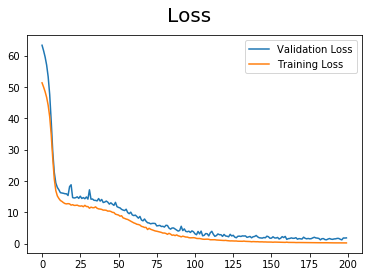

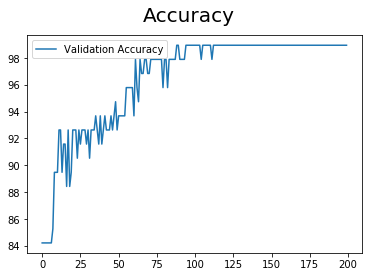

In [16]:


f1 = plt.figure()
f2 = plt.figure()
f1.suptitle('Loss', fontsize = 20)
f2.suptitle('Accuracy', fontsize = 20)
ax1 = f1.add_subplot(111)
ax1.plot(valloss, label='Validation Loss')
ax1.plot(total_loss, label='Training Loss')
ax1.legend()

ax2 = f2.add_subplot(111)
ax2.plot(total_accuracy, label= 'Validation Accuracy')
ax2.legend()
plt.show()

In [17]:


print(total_accuracy)

[84.21052631578947, 84.21052631578947, 84.21052631578947, 84.21052631578947, 84.21052631578947, 84.21052631578947, 84.21052631578947, 85.26315789473684, 89.47368421052632, 89.47368421052632, 89.47368421052632, 92.63157894736842, 92.63157894736842, 89.47368421052632, 91.57894736842105, 91.57894736842105, 88.42105263157895, 92.63157894736842, 88.42105263157895, 89.47368421052632, 92.63157894736842, 92.63157894736842, 92.63157894736842, 90.52631578947368, 92.63157894736842, 91.57894736842105, 92.63157894736842, 92.63157894736842, 92.63157894736842, 91.57894736842105, 92.63157894736842, 90.52631578947368, 92.63157894736842, 92.63157894736842, 92.63157894736842, 93.6842105263158, 92.63157894736842, 91.57894736842105, 93.6842105263158, 91.57894736842105, 92.63157894736842, 93.6842105263158, 92.63157894736842, 92.63157894736842, 92.63157894736842, 93.6842105263158, 92.63157894736842, 93.6842105263158, 94.73684210526315, 92.63157894736842, 93.6842105263158, 93.6842105263158, 93.6842105263158, 

In [18]:
# 5. Save the model checkpoint
#torch.save(m1.state_dict(), 'm1.ckpt')
